# 3 Preprocessing and Modeling

## 3.1 Contents
* 3 Preprocessing and Modeling
  * 3.1 Contents
  * 3.2 Introduction
  * 3.3 Imports
  * 3.4 Load The Raw Data
  * 3.5 Data Wrangling
  * 3.6 Exploratory Data Analysis(EDA)
    * 3.6.1 How to check for Stationarity?
    * 3.6.2 Categorizing monthly and yearly
  * 3.7 Summary

## 3.2 Introduction

There are two requests that I have to answer them. These requests need to predict the data, so I have to create a model that can predict it.

Two requests are listed below(3th and 5th questions):

3th) The company has all its retail centers closed on the 31st of December every year. Mr. Hariharan, the CEO, would love to get an estimate on no: of units of each product that could be sold on 31st of Dec, every year, if all their retail centers were kept open.

5th) The CEO would also like to predict the sales and revenues for the year 2023 and 2024. He wants you to give a yearly estimate with the best possible accuracy.

## 3.3 Imports

In [1]:
import sys
import itertools
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## 3.4 Load The Raw Data

I load the data and edit it for using it easier. These steps were done in Data Wrangling and EDA parts.

In [2]:
file = pd.read_csv('statsfinal.csv')
file.head()
file['Date'] = pd.to_datetime(file['Date'], errors='coerce')
file.isnull().sum()
file.dropna(subset=['Date'], inplace=True)
file['Year'] = file['Date'].dt.year
file['Month'] = file['Date'].dt.month
file['Year_Month'] = file['Date'].dt.strftime('%Y-%b')
file
sum_by_year_month = file.groupby('Year_Month').sum()
sum_by_year_month
sum_by_year_month.index = pd.to_datetime(sum_by_year_month.index)
file_sorted = sum_by_year_month.sort_index()
file_sorted = file_sorted[['Q-P1', 'Q-P2', 'Q-P3', 'Q-P4', 'S-P1', 'S-P2', 'S-P3', 'S-P4']]
file_sorted

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4
Year_Month,,,,,,,,
2010-01-01,19244,10503,17948,7524,61003.48,66589.02,97278.16,53646.12
2010-02-01,14829,10792,14925,7072,47007.93,68421.28,80893.50,50423.36
2010-03-01,29259,18207,14330,6302,92751.03,115432.38,77668.60,44933.26
2010-04-01,28440,19253,22339,5369,90154.80,122064.02,121077.38,38280.97
2010-05-01,28647,15798,6508,8506,90810.99,100159.32,35273.36,60647.78
...,...,...,...,...,...,...,...,...
2023-08-01,4657,3777,5685,1020,14762.69,23946.18,30812.70,7272.60
2023-09-01,7029,3294,319,615,22281.93,20883.96,1728.98,4384.95
2023-10-01,4826,292,5483,926,15298.42,1851.28,29717.86,6602.38


# Important

In [3]:
file_sorted = file_sorted[(file_sorted.index.year < 2023) & (file_sorted.index.year >= 2011)]

In [4]:
file_sorted

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4
Year_Month,,,,,,,,
2011-01-01,113390,54923,95368,34425,359446.30,348211.82,516894.56,245450.25
2011-02-01,110019,69731,105268,32062,348760.23,442094.54,570552.56,228602.06
2011-03-01,115586,66149,96987,30909,366407.62,419384.66,525669.54,220381.17
2011-04-01,120987,58287,93451,35116,383528.79,369539.58,506504.42,250377.08
2011-05-01,129877,64358,95647,32064,411710.09,408029.72,518406.74,228616.32
...,...,...,...,...,...,...,...,...
2022-08-01,109075,66072,101491,29486,345767.75,418896.48,550081.22,210235.18
2022-09-01,120519,62834,82565,31832,382045.23,398367.56,447502.30,226962.16
2022-10-01,116873,65747,86510,33428,370487.41,416835.98,468884.20,238341.64


## 3.5 Time Series Decomposition

In [5]:
Qp1 = file_sorted['Q-P1']
Qp2 = file_sorted['Q-P2']
Qp3 = file_sorted['Q-P3']
Qp4 = file_sorted['Q-P4']
Sp1 = file_sorted['S-P1']
Sp2 = file_sorted['S-P2']
Sp3 = file_sorted['S-P3']
Sp4 = file_sorted['S-P4']
time_series_list = [Qp1, Qp2, Qp3, Qp4, Sp1, Sp2, Sp3, Sp4]

In [6]:
# Perform seasonal decomposition for each time series
decompositions = {}
for i, ts in enumerate(time_series_list, start=1):
    decomposition = sm.tsa.seasonal_decompose(ts, model='multiplicative')
    decompositions[f'Time Series {i}'] = decomposition

# Access decomposition results for each time series
for key, value in decompositions.items():
    print(f"Decomposition for {key}:")
    print("Trend:", value.trend)
    print("Seasonal:", value.seasonal)
    print("Residual:", value.resid)
    print("Observed:", value.observed)
    print()


Decomposition for Time Series 1:
Trend: Year_Month
2011-01-01   NaN
2011-02-01   NaN
2011-03-01   NaN
2011-04-01   NaN
2011-05-01   NaN
              ..
2022-08-01   NaN
2022-09-01   NaN
2022-10-01   NaN
2022-11-01   NaN
2022-12-01   NaN
Name: trend, Length: 144, dtype: float64
Seasonal: Year_Month
2011-01-01    0.998406
2011-02-01    0.957747
2011-03-01    0.994144
2011-04-01    1.038416
2011-05-01    1.029155
                ...   
2022-08-01    1.008487
2022-09-01    0.944539
2022-10-01    1.013072
2022-11-01    0.956888
2022-12-01    1.002854
Name: seasonal, Length: 144, dtype: float64
Residual: Year_Month
2011-01-01   NaN
2011-02-01   NaN
2011-03-01   NaN
2011-04-01   NaN
2011-05-01   NaN
              ..
2022-08-01   NaN
2022-09-01   NaN
2022-10-01   NaN
2022-11-01   NaN
2022-12-01   NaN
Name: resid, Length: 144, dtype: float64
Observed: Year_Month
2011-01-01    113390.0
2011-02-01    110019.0
2011-03-01    115586.0
2011-04-01    120987.0
2011-05-01    129877.0
                ..

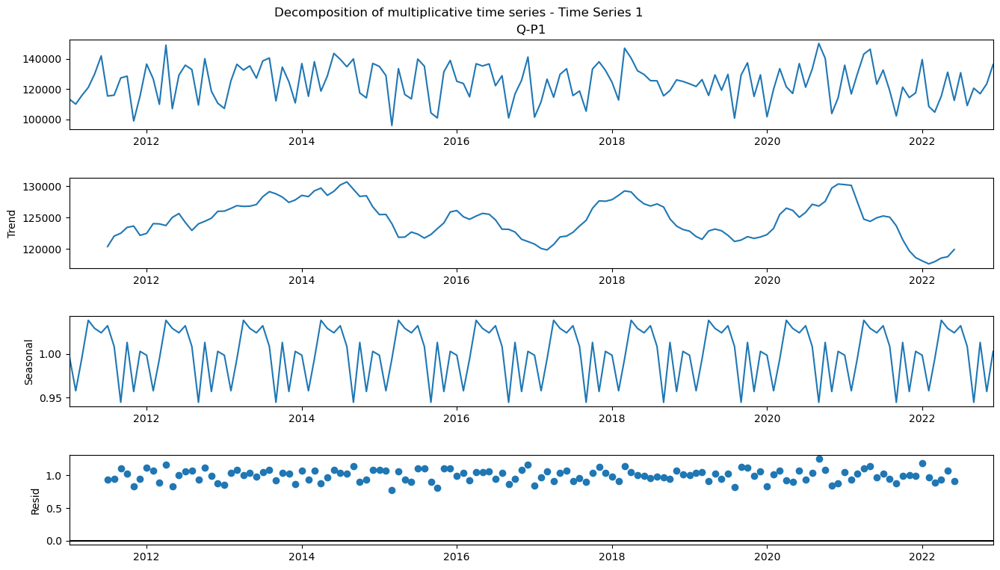

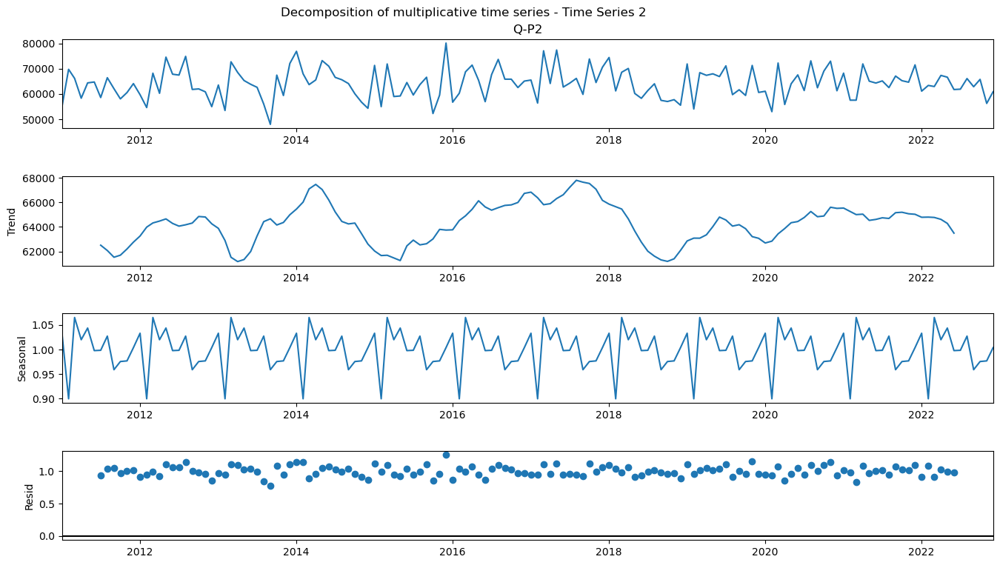

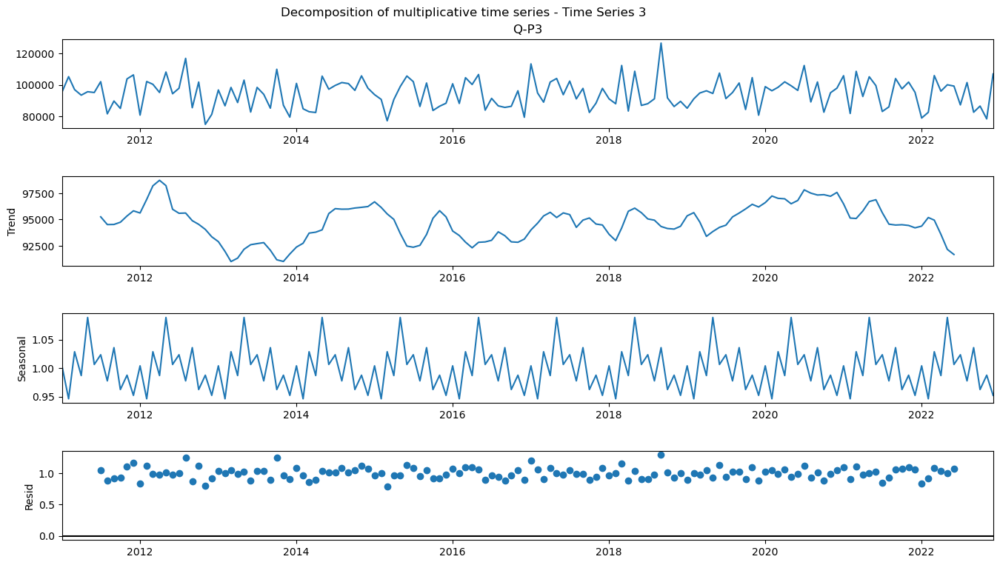

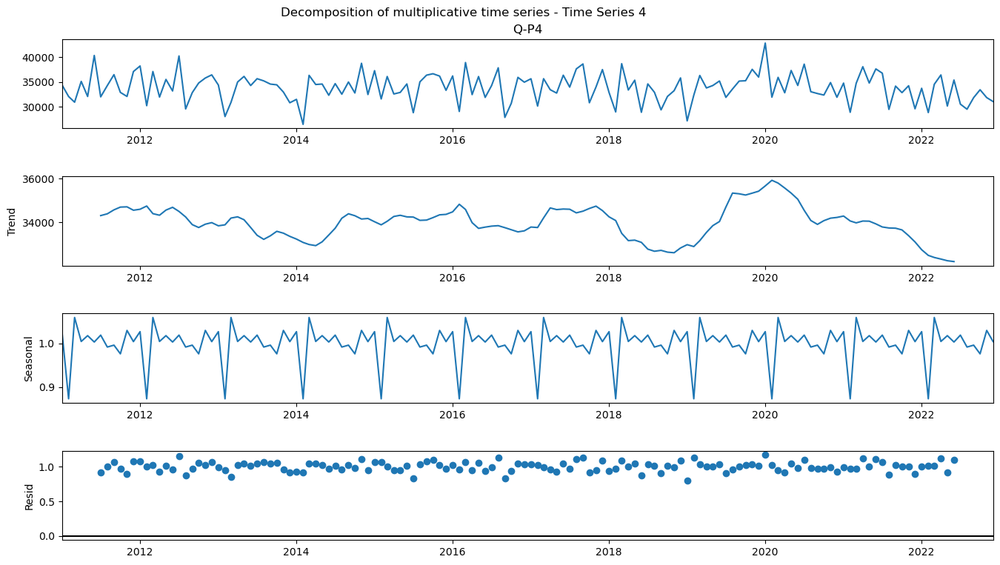

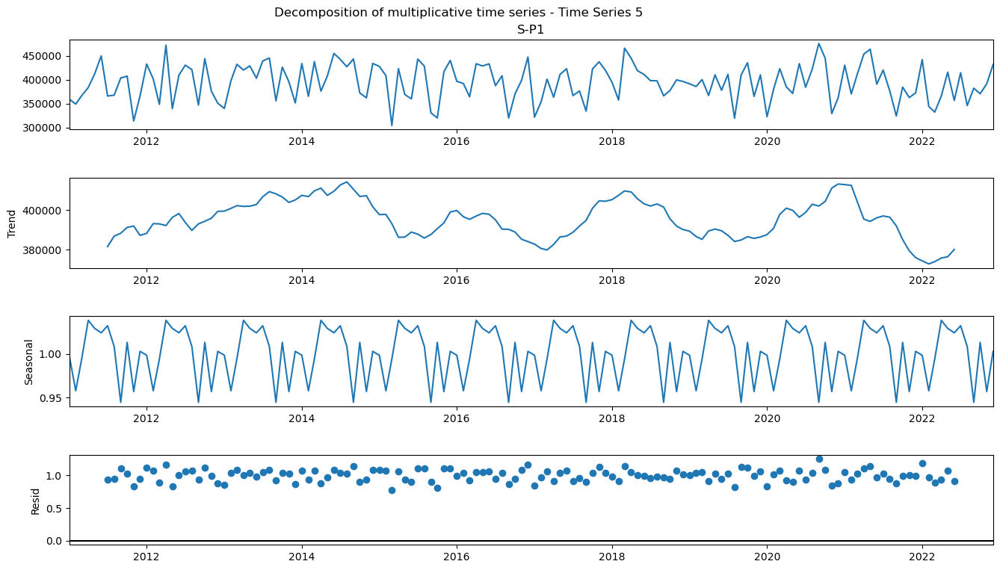

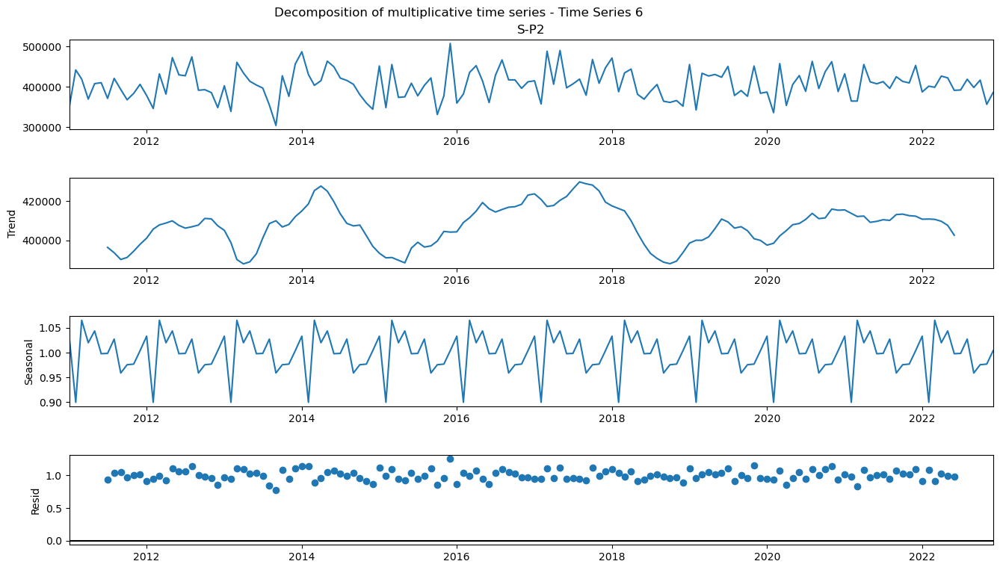

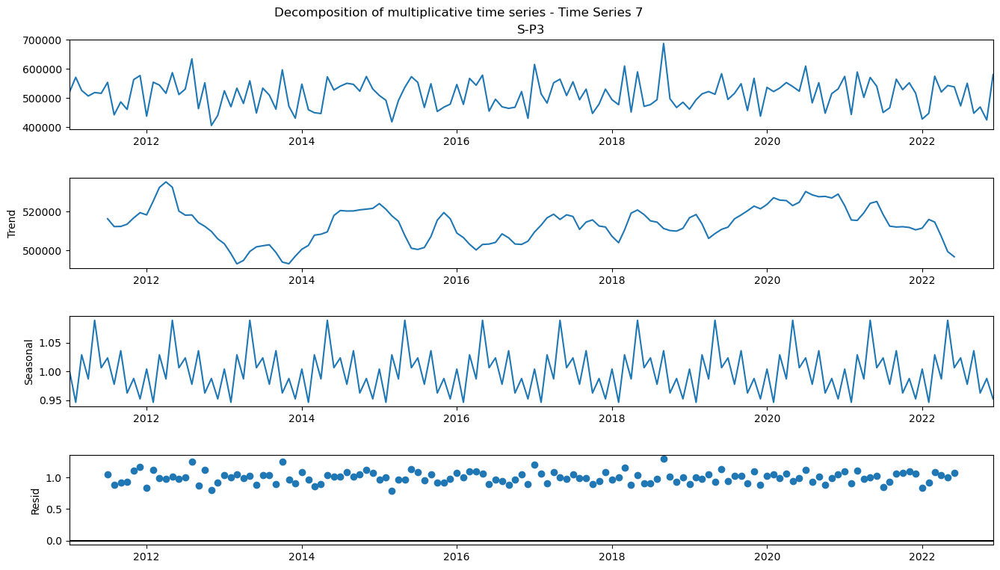

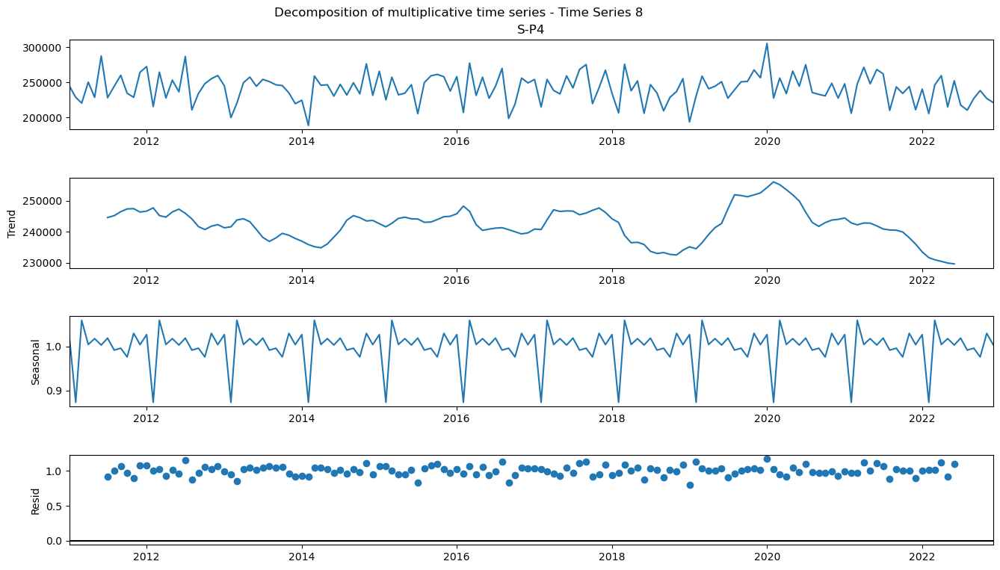

In [7]:
# Perform seasonal decomposition for each time series
for i, ts in enumerate(time_series_list, start=1):
    decomposition = sm.tsa.seasonal_decompose(ts, model='multiplicative')
    fig = decomposition.plot()
    fig.set_figwidth(15)
    fig.set_figheight(8)
    fig.suptitle(f'Decomposition of multiplicative time series - Time Series {i}')
    plt.show()

There are some differences in details, when I compare all 8 time series. But they look like to each other. It means trend,
paterns and calculations are the same as each other.

#### Observations:

1.Trend: 12-months MA is a fairly straight line indicating a linear trend. Increasing at the first and decreasing at the end
are clear. As we notice before, we prefer to work on 2011-2022, because we have missing values in 2011 and 2023. and I decide
to predict 2022 and 2023.

2.Seasonality: seasonality of 12 months is clearly visible.

3 Irregular Remainder (random): The multiplicative model works as there are no patterns in the residuals

#### How to Make a Time Series Stationary ? - Differencing 'd'
- Differencing 'd' is done on a non-stationary time series data one or more times to convert it into stationary.
- (d=1) 1st order differencing is done where the difference between the current and previous (1 lag before) series is taken and then checked for stationarity using the ADF(Augmented Dicky Fueller) test. If differenced time series is stationary, we proceed with AR modeling. Else we do (d=2) 2nd order differencing, and this process repeats till we get a stationary time series
- 1st order differencing equation is :  yt=yt−yt−1
 
- 2nd order differencing equation is :  yt=(yt−yt−1)−(yt−1−yt−2)
  and so on…
- The variance of a time series may also not be the same over time. To remove this kind of non-stationarity, we can transform the data. If the variance is increasing over time, then a log transformation can stabilize the variance.

#### Non differenced full data Time series

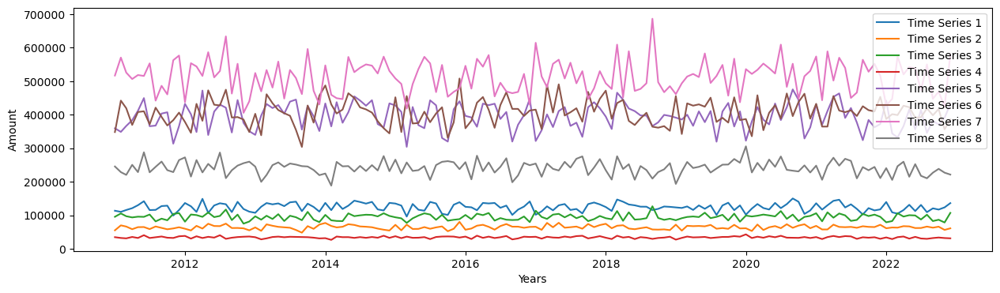

In [8]:
plt.figure(figsize=(15, 4))

# Plot each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    plt.plot(ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Amount')
plt.legend()

# Show the plot
plt.show()

#### Performing differencing ( d=1 ) as the data is non-stationary

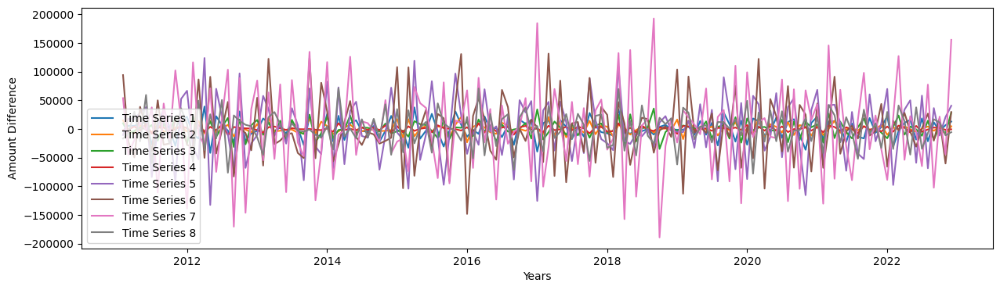

In [9]:
# Set the figure size
plt.figure(figsize=(15, 4))

# Plot the difference of each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    diff_ts = ts.diff(periods=1)
    plt.plot(diff_ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Amount Difference')
plt.legend()

# Show the plot
plt.show()

#### Performing differencing ( d=2 ) as the data is non-stationary

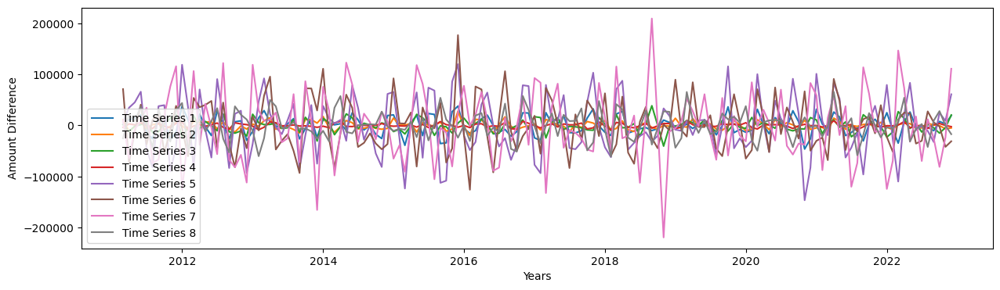

In [10]:
# Set the figure size
plt.figure(figsize=(15, 4))

# Plot the difference of each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    diff_ts = ts.diff(periods=2)
    plt.plot(diff_ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Amount Difference')
plt.legend()

# Show the plot
plt.show()

We observe seasonality even after differencing. Meaning the variance in the data seemss to be increasing.
This suggests a log transformation of the data.

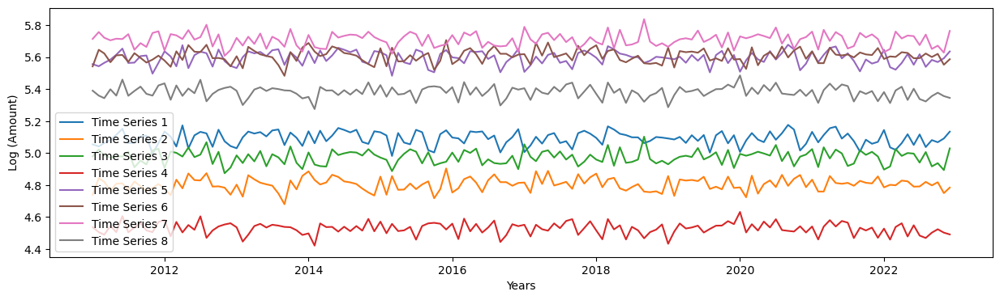

In [11]:
# Set the figure size
plt.figure(figsize=(15, 4))

# Plot the logarithm of each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    log_ts = np.log10(ts)
    plt.plot(log_ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Log (Amount)')
plt.legend()

# Show the plot
plt.show()

We observe trend and seasonality even after taking log of the observations.

#### Performing differencing (d=1) on the log transformed time series

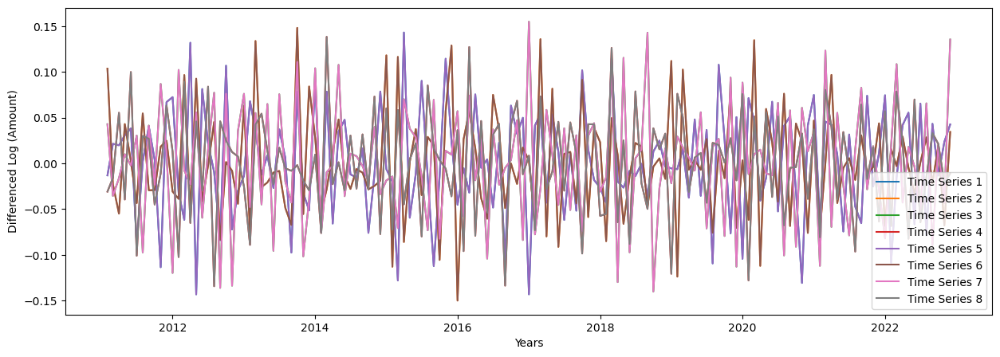

In [12]:
# Set the figure size
plt.figure(figsize=(15, 5))

# Plot the differenced logarithm of each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    diff_log_ts = np.log10(ts).diff(periods=1)
    plt.plot(diff_log_ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Differenced Log (Amount)')
plt.legend()

# Show the plot
plt.show()

#### Performing differencing (d=2) on the log transformed time series

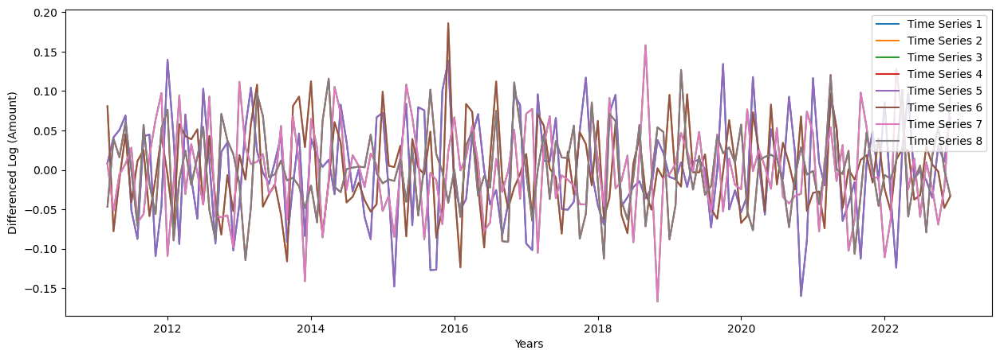

In [13]:
# Set the figure size
plt.figure(figsize=(15, 5))

# Plot the differenced logarithm of each time series with distinct colors
for i, ts in enumerate(time_series_list, start=1):
    diff_log_ts = np.log10(ts).diff(periods=2)
    plt.plot(diff_log_ts, label=f'Time Series {i}')

# Add labels and legend
plt.xlabel('Years')
plt.ylabel('Differenced Log (Amount)')
plt.legend()

# Show the plot
plt.show()

There is the shape differences when I compare diff period is 1 or 2 here.

## 3.6 Preprocessing and Modeling

### 3.6.1 Auto Regressive(AR) Models

- Autoregression means regression of a variable on itself which means Autoregressive models use previous time period values to predict the current time period values.
- One of the fundamental assumptions of an AR model is that the time series is assumed to be a stationary process.
- An AR(p) model (Auto-Regressive model of order p) can be written as:

##### yt  =    φ1yt−1+φ2yt−2+……+φpyt−p+εt
 
-  εt
  is an error term which is an independent and identically distributed random variable (or in other words, a white noise) with the parameters mean = 0 and standard deviation = σ - The φ are regression coefficients multiplied by lagged time series variable, which captures the effect of the input variable on the output, provided intermediate values do not change.

##### | Choose the order 'p' of AR model
- We look at the Partial Autocorrelations of a stationary Time Series to understand the order of Auto-Regressive models.
- For an AR model, 2 ways to identify order of 'p':
##### 1) PACF Approach : 
The PACF method where the (Partial Auto Correlation Function) values cut off and become zero after a certain lag. PACF vanishes if there is no regression coefficient that far back. The cut-off value where this happens can be taken as the order of AR as ‘p’. This can be seen from a PACF plot.
- If the 2nd PACF vanishes (cut off in PACF) then the 2nd coefficient is not considered and thus ‘p’ is 1. - If the 3rd PACF vanishes (cuts off in PACF) then the 3rd coefficient is not considered and thus ‘p’ is 2 and so on…
- Partial Autocorrelation of order 2 = Partial autocorrelation of lag 2 = Correlation between  Xt
  and  Xt−2
  holding  Xt−1
  fixed.
##### 2) Lowest AIC Approach : 
The lowest Akaike Information Criteria (AIC) value compared among different orders of ‘p’ is considered.

##### Using the 2nd method(Lowest AIC) to compare different orders of 'p'

Define the p parameter to take any value between 0 and 2

In [14]:
p= range(1,4)

### 3.6.2 Moving Average(MA) Models

- Moving average model considers past residual values to predict the current time period values These past residuals are past prediction errors.
- #### For a MA model, the residual or error component is modeled
- The moving average model MA(q) of  order q can be represented as:
##### yt=εt+θ1εt−1+……+θqεt−q
 
- Where  yt
   time series variable, θ are numeric coefficients multiplied to lagged residuals and ε is the residual term considered as a purely random process with mean 0, variance  σ2
  and   Cov(εt−1,εt−q)
  = 0.
##### | Choose the order 'q' of MA model
- We look at the Autocorrelations of a stationary Time Series to understand the order of Moving Average models.
- For a MA model
##### 1) ACF Approach : 
ACF (Autocorrelation Function) values cut off at a certain lag. ACF vanishes, and there are no coefficients that far back; thus, the cut-off value where this happens is taken as the order of MA as ‘q’. This can be seen from the ACF plot.
##### 2) Lowest AIC Approach : 
The lowest Akaike Information Criteria (AIC) value compared among different orders of ‘q’ is considered.

##### Lowest AIC Method

Using the 2nd method(Lowest AIC) to compare different orders of 'q'

##### Define the q parameter to take any value between 0 and 2

In [15]:
q = range(1, 4)

**ACF(0)=1**

**ACF(1)=PACF(1)**

Parameter (p, d, q) estimation matrix for estimating parameters towards building AR / ARMA / ARIMA / SARIMA models

In [16]:
d= range(0,2)

#Generate all different combinations of p with d=0 and q=0 triplets for AR model building
pdq_ar = list(itertools.product(p, range(1), range(1)))

#Generate all different combinations of p,q with d=0 triplets for ARMA model building
pdq_arma = list(itertools.product(p, range(1),q))

#Generate all different combinations of p, d and q triplets for ARIMA model building
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal P,D,Q triplets for SARIMA model building
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [17]:
pdq_ar

[(1, 0, 0), (2, 0, 0), (3, 0, 0)]

In [18]:
pdq_arma

[(1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3),
 (3, 0, 1),
 (3, 0, 2),
 (3, 0, 3)]

In [19]:
pdq

[(1, 0, 1),
 (1, 0, 2),
 (1, 0, 3),
 (1, 1, 1),
 (1, 1, 2),
 (1, 1, 3),
 (2, 0, 1),
 (2, 0, 2),
 (2, 0, 3),
 (2, 1, 1),
 (2, 1, 2),
 (2, 1, 3),
 (3, 0, 1),
 (3, 0, 2),
 (3, 0, 3),
 (3, 1, 1),
 (3, 1, 2),
 (3, 1, 3)]

In [20]:
seasonal_pdq

[(1, 0, 1, 12),
 (1, 0, 2, 12),
 (1, 0, 3, 12),
 (1, 1, 1, 12),
 (1, 1, 2, 12),
 (1, 1, 3, 12),
 (2, 0, 1, 12),
 (2, 0, 2, 12),
 (2, 0, 3, 12),
 (2, 1, 1, 12),
 (2, 1, 2, 12),
 (2, 1, 3, 12),
 (3, 0, 1, 12),
 (3, 0, 2, 12),
 (3, 0, 3, 12),
 (3, 1, 1, 12),
 (3, 1, 2, 12),
 (3, 1, 3, 12)]

### Train test split

In [21]:
#Separate data into train and test
# data['date'] = data.index
train = file_sorted[file_sorted.index < '2020-01-01']
test = file_sorted[file_sorted.index >= '2020-01-01']

In [22]:
# Perform ADF test for each time series in the list
for i, ts in enumerate(time_series_list, start=1):
    dftest = adfuller(ts)
    print(f"Results for Time Series {i}:")
    print("DF test statistic is %3.3f" % dftest[0])
    print("DF test p-value is %1.30f" % dftest[1])
    print()

Results for Time Series 1:
DF test statistic is -11.658
DF test p-value is 0.000000000000000000001960522039

Results for Time Series 2:
DF test statistic is -12.758
DF test p-value is 0.000000000000000000000008252401

Results for Time Series 3:
DF test statistic is -6.266
DF test p-value is 0.000000041025721605410214659285

Results for Time Series 4:
DF test statistic is -13.722
DF test p-value is 0.000000000000000000000000118264

Results for Time Series 5:
DF test statistic is -11.658
DF test p-value is 0.000000000000000000001960522039

Results for Time Series 6:
DF test statistic is -12.758
DF test p-value is 0.000000000000000000000008252401

Results for Time Series 7:
DF test statistic is -6.266
DF test p-value is 0.000000041025721605407336070753

Results for Time Series 8:
DF test statistic is -13.722
DF test p-value is 0.000000000000000000000000118264



P-values are approximately zero. We know it can't be zero, but it can be close to zero.
Using the log transformed series as there is variance in the data.

In [23]:
# Apply log transformation to each time series in the list
log_transformed_series_list = []
for i, ts in enumerate(time_series_list, start=1):
    log_transformed_series = np.log10(ts)
    log_transformed_series_list.append(log_transformed_series)

# Print the transformed time series list
for i, log_ts in enumerate(log_transformed_series_list, start=1):
    print(f"Log transformed series for Time Series {i}:")
    print(log_ts)
    print()

Log transformed series for Time Series 1:
Year_Month
2011-01-01    5.054575
2011-02-01    5.041468
2011-03-01    5.062905
2011-04-01    5.082739
2011-05-01    5.113532
                ...   
2022-08-01    5.037725
2022-09-01    5.081056
2022-10-01    5.067714
2022-11-01    5.091315
2022-12-01    5.133954
Name: Q-P1, Length: 144, dtype: float64

Log transformed series for Time Series 2:
Year_Month
2011-01-01    4.739754
2011-02-01    4.843426
2011-03-01    4.820523
2011-04-01    4.765572
2011-05-01    4.808603
                ...   
2022-08-01    4.820017
2022-09-01    4.798195
2022-10-01    4.817876
2022-11-01    4.749922
2022-12-01    4.784311
Name: Q-P2, Length: 144, dtype: float64

Log transformed series for Time Series 3:
Year_Month
2011-01-01    4.979403
2011-02-01    5.022296
2011-03-01    4.986714
2011-04-01    4.970584
2011-05-01    4.980671
                ...   
2022-08-01    5.006428
2022-09-01    4.916796
2022-10-01    4.937066
2022-11-01    4.893906
2022-12-01    5.029404


In [24]:
best_aic = np.inf
best_pdq = None
best_seasonal_pdq = None
temp_model = None

## Modeling

### AR Model
| AR Model : Autoregressive
- Use previous time period values to predict the current time period values AR Model building to estimate best 'p' ( Lowest AIC Approach )

In [25]:
# Creating an empty Dataframe with column names only
AR_AIC_0 = pd.DataFrame(columns=['param', 'AIC'])

for param in pdq_ar:
    AR_model_0 = ARIMA(log_transformed_series_list[0], order=param).fit()
    print('AR{} - AIC:{}'.format(param, AR_model_0.aic))
    row = {'param': param, 'AIC': AR_model_0.aic}
    AR_AIC_0 = pd.concat([AR_AIC_0, pd.DataFrame([row])], ignore_index=True)

AR(1, 0, 0) - AIC:-493.10971684007745
AR(2, 0, 0) - AIC:-493.6158879425233
AR(3, 0, 0) - AIC:-491.6164279197463


Building AR model with best 'p' parameter. Second one is the best. ARIMA(2, 0, 0)

In [26]:
best_model_AR0 = ARIMA(log_transformed_series_list[0], order = (2,0,0))#p=2 with lowest AIC
best_results_AR0 = best_model_AR0.fit()

In [27]:
print(best_results_AR0.summary().tables[0])
print(best_results_AR0.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P1   No. Observations:                  144
Model:                 ARIMA(2, 0, 0)   Log Likelihood                 250.808
Date:                Sun, 07 Apr 2024   AIC                           -493.616
Time:                        04:27:53   BIC                           -481.737
Sample:                    01-01-2011   HQIC                          -488.789
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0926      0.003   1513.701      0.000       5.086       5.099
ar.L1          0.0117      0.086      0.136      0.892      -0.156       0.180
ar.L2         -0.1318      0.093     -1.418      0.1

#### Calculating RMSE for best AR model 

In [28]:
pred_dynamic_AR0 = best_results_AR0.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)

In [29]:
pred99_AR0 = best_results_AR0.get_forecast(steps=len(test), alpha=0.1)#forecasting values

In [30]:
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR0 = pred_dynamic_AR0.predicted_mean
testCopy1_AR0 = test.copy()
testCopy1_AR0['sales_ts_forecasted_QP1_AR0'] = np.power(10, pred_dynamic_AR0.predicted_mean)
testCopy1_AR0.head()

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP1_AR0
Year_Month,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,125030.460440
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,123074.544311
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,123601.023035
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,123864.391142
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,123797.791688


In [31]:
# Compute the root mean square error
mse_AR0 = ((testCopy1_AR0['Q-P1'] - testCopy1_AR0['sales_ts_forecasted_QP1_AR0']) ** 2).mean()
rmse_AR0 = np.sqrt(mse_AR0)
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse_AR0, 3)))

The Root Mean Squared Error of our forecasts is 12674.089


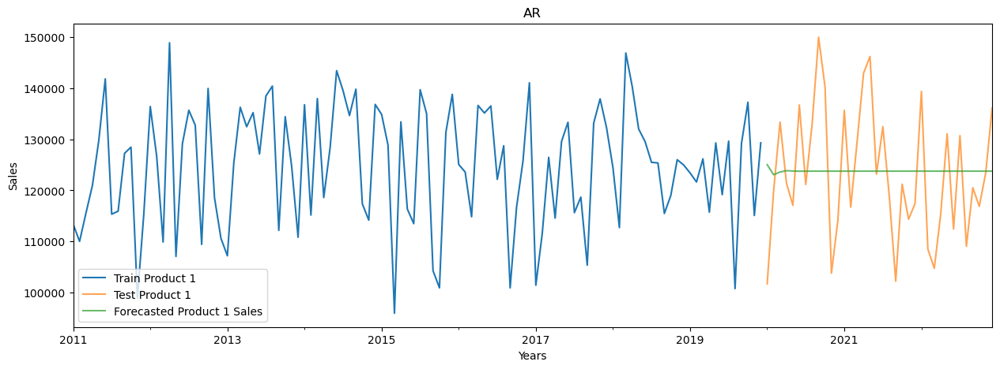

In [32]:
axis = train['Q-P1'].plot(label='Train Product 1', figsize=(15, 5))
testCopy1_AR0['Q-P1'].plot(ax=axis, label='Test Product 1', alpha=0.7)
testCopy1_AR0['sales_ts_forecasted_QP1_AR0'].plot(ax=axis, label='Forecasted Product 1 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [33]:
resultsDf_AR0 = pd.DataFrame({'RMSE': rmse_AR0}
                           ,index=['Best AR Model Product 1 : AR(2,0,0)'])

resultsDf_AR0

,RMSE
"Best AR Model Product 1 : AR(2,0,0)",12674.088666


### ARMA Model

- Improving AutoRegressive Models through Moving Average Forecasts.
- ARMA models consist of 2 components:-
- AR model: The data is modeled based on past observations.
- MA model: Previous forecast errors are incorporated into the model.

ARMA Model building to estimate best 'p' , 'q' ( Lowest AIC Approach )

In [34]:
# Creating an empty Dataframe with column names only
ARMA_AIC_0 = pd.DataFrame(columns=['param', 'AIC'])
ARMA_AIC_0

,param,AIC


In [35]:
for param in pdq_arma:
    ARMA_model_0 = ARIMA(log_transformed_series_list[0],order=param).fit()
    print('ARMA{} - AIC:{}'.format(param, ARMA_model_0.aic))
    row = {'param': param, 'AIC': ARMA_model_0.aic}
    ARMA_AIC_0 = pd.concat([ARMA_AIC_0, pd.DataFrame([row])], ignore_index=True)

ARMA(1, 0, 1) - AIC:-491.6369442081332
ARMA(1, 0, 2) - AIC:-491.4724719463596
ARMA(1, 0, 3) - AIC:-489.48529671019367
ARMA(2, 0, 1) - AIC:-491.61626355450267
ARMA(2, 0, 2) - AIC:-489.64141316718747
ARMA(2, 0, 3) - AIC:-489.4768553438096
ARMA(3, 0, 1) - AIC:-489.61658031912003
ARMA(3, 0, 2) - AIC:-487.62616847581234
ARMA(3, 0, 3) - AIC:-487.96478983057887


In [36]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARMA_AIC_0.sort_values(by='AIC',ascending=True).head()

,param,AIC
0,"(1, 0, 1)",-491.636944
3,"(2, 0, 1)",-491.616264
1,"(1, 0, 2)",-491.472472
4,"(2, 0, 2)",-489.641413
6,"(3, 0, 1)",-489.616580


#### Building ARMA model with best p,q parameter 

In [37]:
best_model_ARMA0 = ARIMA(log_transformed_series_list[0],order = (1, 0, 1))
best_results_ARMA0 = best_model_ARMA0.fit()

In [38]:
print(best_results_ARMA0.summary().tables[0])
print(best_results_ARMA0.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P1   No. Observations:                  144
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 249.818
Date:                Sun, 07 Apr 2024   AIC                           -491.637
Time:                        04:27:54   BIC                           -479.758
Sample:                    01-01-2011   HQIC                          -486.810
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0926      0.004   1288.599      0.000       5.085       5.100
ar.L1         -0.4931      1.085     -0.454      0.650      -2.620       1.634
ma.L1          0.5465      1.047      0.522      0.6

#### Calculating RMSE for best MA model 

In [39]:
pred_dynamic_ARMA0 = best_results_ARMA0.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)

In [40]:
pred99_ARMA0 = best_results_ARMA0.get_forecast(steps=len(test), alpha=0.1)#forecasting values

In [41]:
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA0 = pred_dynamic_ARMA0.predicted_mean
testCopy1_ARMA0 = test.copy()
testCopy1_ARMA0['sales_ts_forecasted_QP1_ARMA0'] = np.power(10, pred_dynamic_ARMA0.predicted_mean)
testCopy1_ARMA0

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP1_ARMA0
Year_Month,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,124324.524264
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,123487.041270
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,123899.269096
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,123695.841451
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,123796.103139
2020-06-01,136733,67523,96492,34295,433443.61,428095.82,522986.64,244523.35,123746.657254
2020-07-01,121156,61325,112383,38607,384064.52,388800.50,609115.86,275267.91,123771.034921
2020-08-01,133139,73092,89129,33029,422050.63,463403.28,483079.18,235496.77,123759.014497
2020-09-01,150003,62429,101867,32660,475509.51,395799.86,552119.14,232865.80,123764.941226


In [42]:
sales_ts_forecasted_ARMA0.head()

2020-01-01    5.094557
2020-02-01    5.091621
2020-03-01    5.093069
2020-04-01    5.092355
2020-05-01    5.092707
Freq: MS, Name: predicted_mean, dtype: float64

In [43]:
# Compute the root mean square error
mse_ARMA0 = ((testCopy1_ARMA0['Q-P1'] - testCopy1_ARMA0['sales_ts_forecasted_QP1_ARMA0']) ** 2).mean()
rmse_ARMA0 = np.sqrt(mse_ARMA0)
print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse_ARMA0, 3)))

The Root Mean Squared Error of our forecasts is 12634.902


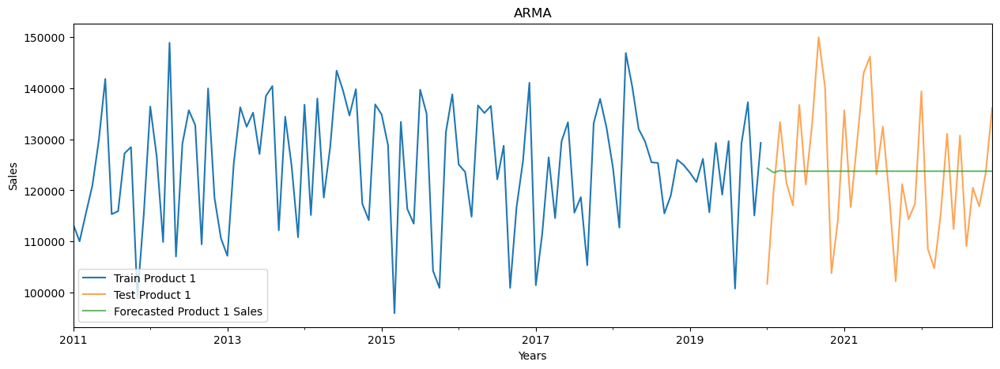

In [44]:
axis = train['Q-P1'].plot(label='Train Product 1', figsize=(15, 5))
testCopy1_ARMA0['Q-P1'].plot(ax=axis, label='Test Product 1', alpha=0.7)
testCopy1_ARMA0['sales_ts_forecasted_QP1_ARMA0'].plot(ax=axis, label='Forecasted Product 1 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [45]:
resultsDf_ARMA0 = pd.DataFrame({'RMSE': rmse_ARMA0}
                           ,index=['Best ARMA Model Product 1 : ARMA(1, 0, 1)'])

resultsDf_ARMA0

pd.concat([resultsDf_AR0,resultsDf_ARMA0])

,RMSE
"Best AR Model Product 1 : AR(2,0,0)",12674.088666
"Best ARMA Model Product 1 : ARMA(1, 0, 1)",12634.901547


### ARIMA Model

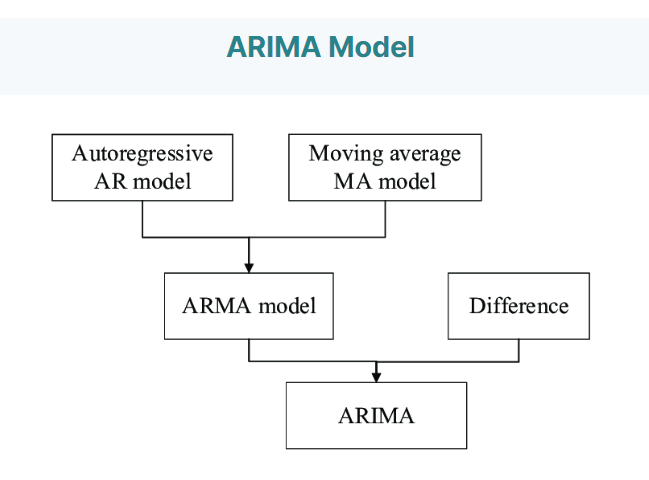

- ARIMA:- Auto Regressive Integrated Moving Average is a way of modeling time series data for forecasting or predicting future data points.
- Improving AR Models by making Time Series stationary through Moving AVerage Forecasts
- ARIMA models consist of 3 components:-
- AR model: The data is modeled based on past observations.
- Integrated component: Whether the data needs to be differenced/transformed.
- MA model: Previous forecast errors are incorporated into the model.

#### ARIMA Model building to estimate best 'p' , 'd' , 'q' paramters ( Lowest AIC Approach )

In [46]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_0 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_0

,param,AIC


In [47]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:
    ARIMA_model_ARIMA0 = ARIMA(log_transformed_series_list[0], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_ARIMA0.aic))
    row = {'param': param, 'AIC': ARIMA_model_ARIMA0.aic}
    ARIMA_AIC_0 = pd.concat([ARIMA_AIC_0, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-491.6369442081332
ARIMA(1, 0, 2) - AIC:-491.4724719463596
ARIMA(1, 0, 3) - AIC:-489.48529671019367
ARIMA(1, 1, 1) - AIC:-483.7067460026601
ARIMA(1, 1, 2) - AIC:-481.699663507153
ARIMA(1, 1, 3) - AIC:-481.79063327385643
ARIMA(2, 0, 1) - AIC:-491.61626355450267
ARIMA(2, 0, 2) - AIC:-489.64141316718747
ARIMA(2, 0, 3) - AIC:-489.4768553438096
ARIMA(2, 1, 1) - AIC:-483.9529328912212
ARIMA(2, 1, 2) - AIC:-479.72572386463906
ARIMA(2, 1, 3) - AIC:-488.98957022204684
ARIMA(3, 0, 1) - AIC:-489.61658031912003
ARIMA(3, 0, 2) - AIC:-487.62616847581234
ARIMA(3, 0, 3) - AIC:-487.96478983057887
ARIMA(3, 1, 1) - AIC:-481.9624237034109
ARIMA(3, 1, 2) - AIC:-480.3041153965637
ARIMA(3, 1, 3) - AIC:-485.34557105228237


In [48]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC_0.sort_values(by='AIC',ascending=True).head()

,param,AIC
0,"(1, 0, 1)",-491.636944
6,"(2, 0, 1)",-491.616264
1,"(1, 0, 2)",-491.472472
7,"(2, 0, 2)",-489.641413
12,"(3, 0, 1)",-489.616580


#### Building ARIMA model with best parameters p,d,q

In [49]:
best_model_ARIMA0 = ARIMA(log_transformed_series_list[0],order = (1, 0, 1))
best_results_ARIMA0 = best_model_ARIMA0.fit()

In [50]:
print(best_results_ARIMA0.summary().tables[0])
print(best_results_ARIMA0.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P1   No. Observations:                  144
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 249.818
Date:                Sun, 07 Apr 2024   AIC                           -491.637
Time:                        04:27:58   BIC                           -479.758
Sample:                    01-01-2011   HQIC                          -486.810
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.0926      0.004   1288.599      0.000       5.085       5.100
ar.L1         -0.4931      1.085     -0.454      0.650      -2.620       1.634
ma.L1          0.5465      1.047      0.522      0.6

#### Calculating RMSE for best ARIMA model 

In [51]:
pred_dynamic_ARIMA0 = best_results_ARIMA0.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)

In [52]:
pred99_ARIMA0 = best_results_ARIMA0.get_forecast(steps=len(test), alpha=0.1)#forecasting values

In [53]:
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA0 = pred_dynamic_ARIMA0.predicted_mean
testCopy1_ARIMA0 = test.copy()
testCopy1_ARIMA0['sales_ts_forecasted_QP1_ARIMA0'] = np.power(10, pred_dynamic_ARIMA0.predicted_mean)

In [54]:
# Compute the root mean square error
mse_ARIMA0 = ((testCopy1_ARIMA0['Q-P1'] - testCopy1_ARIMA0['sales_ts_forecasted_QP1_ARIMA0']) ** 2).mean()
rmse_ARIMA0 = np.sqrt(mse_ARIMA0)
print('The Root Mean Squared Error of our ARIMA forecasts is {}'.format(round(rmse_ARIMA0, 3)))

The Root Mean Squared Error of our ARIMA forecasts is 12634.902


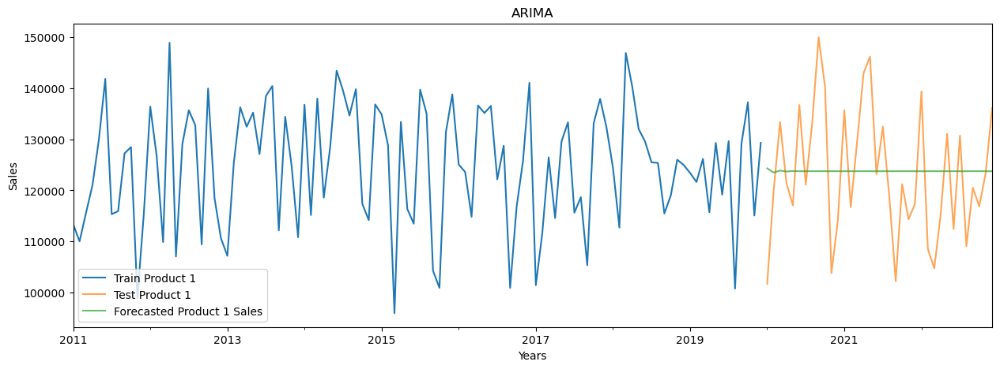

In [55]:
axis = train['Q-P1'].plot(label='Train Product 1', figsize=(15, 5))
testCopy1_ARIMA0['Q-P1'].plot(ax=axis, label='Test Product 1', alpha=0.7)
testCopy1_ARIMA0['sales_ts_forecasted_QP1_ARIMA0'].plot(ax=axis, label='Forecasted Product 1 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [56]:
resultsDf_ARIMA0 = pd.DataFrame({'RMSE': rmse_ARIMA0}
                           ,index=['Best ARIMA Model Product 1 : ARIMA(1,0,1)'])

resultsDf_ARIMA0

pd.concat([resultsDf_AR0, resultsDf_ARMA0, resultsDf_ARIMA0])

,RMSE
"Best AR Model Product 1 : AR(2,0,0)",12674.088666
"Best ARMA Model Product 1 : ARMA(1, 0, 1)",12634.901547
"Best ARIMA Model Product 1 : ARIMA(1,0,1)",12634.901547


The RMSE of best models of ARMA and ARIMA are the same, because their pqr for the best models are equal. 

### SARIMA Model

- The ARIMA models can be extended/improved to handle seasonal components of a data series
- The seasonal autoregressive moving average model is given by

SARIMA(p, d, q)(P, D, Q)m
    non-seasonal seasonal

- The above model consists of:
- Autoregressive and moving average components (p, q)
- Seasonal autoregressive and moving average components (P, Q)
- The ordinary and seasonal difference components of order ‘d’ and ‘D’
- Seasonal frequency ‘F’
- The value for the parameters (p,d,q) and (P, D, Q) can be decided by comparing different values for each and taking the lowest AIC value for the model build.
- The value for F can be consolidated by ACF plot

Finding Seasonality = 12 from ACF/PACF plots 

<Figure size 1500x400 with 0 Axes>

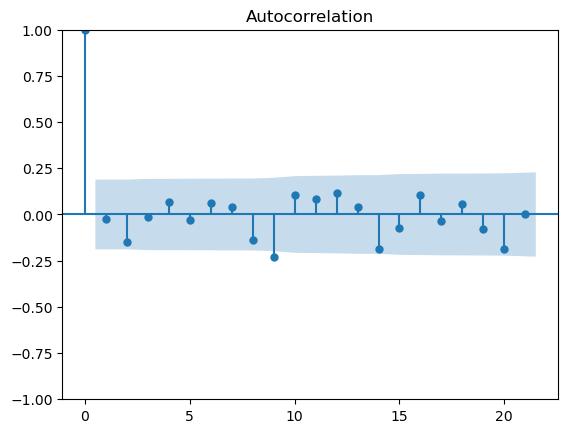

In [57]:
plt.figure(figsize=(15, 4))
plot_acf(train['Q-P1'],alpha=0.05);

SARIMA Model building to estimate best parameters 

In [58]:
best_aic_0 = np.inf
best_pdq_0 = None
best_seasonal_pdq_0 = None
temp_model_0 = None

In [59]:
SARIMA_AIC_0 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_0

,param,seasonal,AIC


In [60]:
SARIMA_AIC_0 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_0 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[0],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_0 = SARIMA_model_0.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_0.aic))
SARIMA_AIC_0.loc[len(SARIMA_AIC_0)] = [param, param_seasonal, results_SARIMA_0.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3984.337570013038


In [61]:
SARIMA_AIC_0.sort_values(by=['AIC'],ascending=True).head()

,param,seasonal,AIC
0,"(3, 1, 3)","(3, 1, 3, 12)",3984.33757


Inference * Criteria to choose the best fit model is the lowest/minimum AIC value
For ARIMA(p, d, q) × (P, D, Q)S,
we got SARIMAX(3, 1, 3)x(3, 1, 3, 12)model with the least AIC of 3984.33757
Here,
- p = non-seasonal AR order = 3,
- d = non-seasonal differencing = 0,
- q = non-seasonal MA order = 3,
- P = seasonal AR order = 3,
- D = seasonal differencing = 1,
- Q = seasonal MA order = 3,
- S = time span of repeating seasonal pattern = 12
Building SARIMA model with the best parameters

In [62]:
best_model_SARIMA_0 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[0],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_0 = best_model_SARIMA_0.fit()

In [63]:
print(best_results_SARIMA_0.summary().tables[0])
print(best_results_SARIMA_0.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               Q-P1   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 211.893
Date:                            Sun, 07 Apr 2024   AIC                           -397.786
Time:                                    04:28:05   BIC                           -360.408
Sample:                                01-01-2011   HQIC                          -382.597
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3257      0.122     -2.668      0.008      -0.565      -0.086
ar.L2         -0.9949      0.044   

In [64]:
pred_dynamic_SARIMA_0 = best_results_SARIMA_0.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True,
                                                             full_results=True)

In [65]:
pred99_SARIMA_0 = best_results_SARIMA_0.get_forecast(steps=len(test), alpha=0.1)

In [66]:
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_0 = pred_dynamic_SARIMA_0.predicted_mean
testCopy_SARIMA_0 = test.copy()
testCopy_SARIMA_0['sales_ts_forecasted_QP1_SARIMA_0'] = np.power(10, pred_dynamic_SARIMA_0.predicted_mean)

In [67]:
testCopy_SARIMA_0

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP1_SARIMA_0
Year_Month,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,120386.599321
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,121482.866776
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,120315.001831
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,121272.831828
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,124572.785780
2020-06-01,136733,67523,96492,34295,433443.61,428095.82,522986.64,244523.35,130584.632370
2020-07-01,121156,61325,112383,38607,384064.52,388800.50,609115.86,275267.91,127834.435468
2020-08-01,133139,73092,89129,33029,422050.63,463403.28,483079.18,235496.77,118842.617388
2020-09-01,150003,62429,101867,32660,475509.51,395799.86,552119.14,232865.80,118826.307621


In [68]:
# Compute the root mean square error
mse_SARIMA_0 = ((testCopy_SARIMA_0['Q-P1'] - testCopy_SARIMA_0['sales_ts_forecasted_QP1_SARIMA_0']) ** 2).mean()
rmse_SARIMA_0 = np.sqrt(mse_SARIMA_0)
print('The Root Mean Squared Error of our forecasts SARIMA_0 is {}'.format(round(rmse_SARIMA_0, 3)))

The Root Mean Squared Error of our forecasts SARIMA_0 is 12001.957


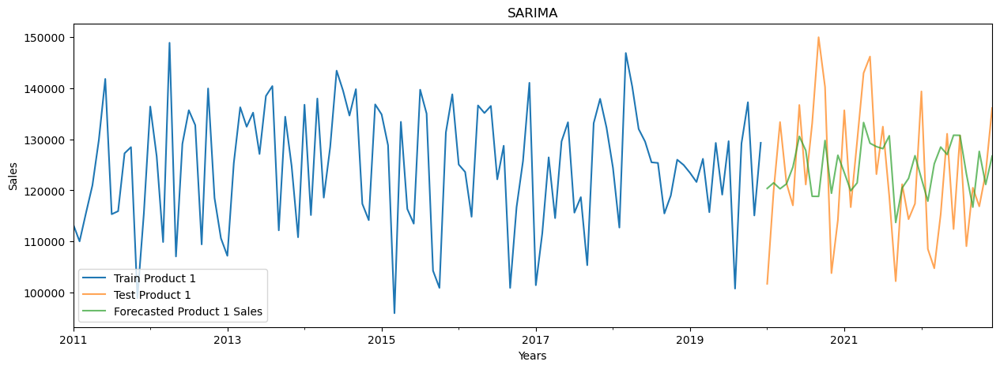

In [69]:
axis = train['Q-P1'].plot(label='Train Product 1', figsize=(15, 5))
testCopy_SARIMA_0['Q-P1'].plot(ax=axis, label='Test Product 1', alpha=0.7)
testCopy_SARIMA_0['sales_ts_forecasted_QP1_SARIMA_0'].plot(ax=axis, label='Forecasted Product 1 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [70]:
resultsDf_SARIMA_0 = pd.DataFrame({'RMSE': rmse_SARIMA_0}
                           ,index=['Best SARIMA Model product 1 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

pd.concat([resultsDf_AR0, resultsDf_ARMA0, resultsDf_ARIMA0, resultsDf_SARIMA_0])

,RMSE
"Best AR Model Product 1 : AR(2,0,0)",12674.088666
"Best ARMA Model Product 1 : ARMA(1, 0, 1)",12634.901547
"Best ARIMA Model Product 1 : ARIMA(1,0,1)",12634.901547
"Best SARIMA Model product 1 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",12001.956713


#### Conclusion:
The best model for product 1 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 12001.956713.

#### Forecast sales using the best fit SARIMA model as per RMSE

In [71]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_0.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_0.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

In [72]:
n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,115953.424199,95057.551431,141442.698460,95057.551431,141442.698460
2020-02-01,116854.802732,95744.508305,142619.615093,95744.508305,142619.615093
2020-03-01,118097.324744,96741.991966,144166.745260,96741.991966,144166.745260
2020-04-01,120802.468866,98913.279432,147535.665261,98913.279432,147535.665261
2020-05-01,120216.044846,98364.897144,146921.288570,98364.897144,146921.288570


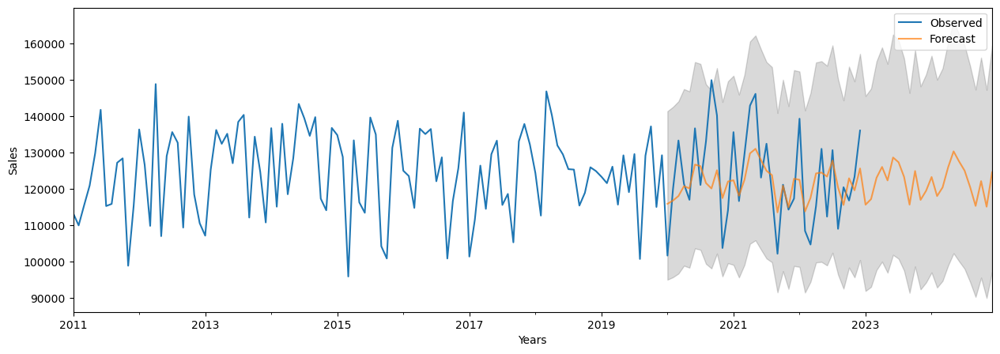

In [73]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['Q-P1']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

So we can see the 5th request of CEO. As we can seec we can use the best model (SARIMAX(3, 1, 3)x(3, 1, 3, 12)) for product 1, and we can predict the amount of product 1 for 2023, 2024 and etc.

#### Other Conclusions:
Plot ACF and PACF for residuals of ARIMA model to ensure no more information is left for extraction

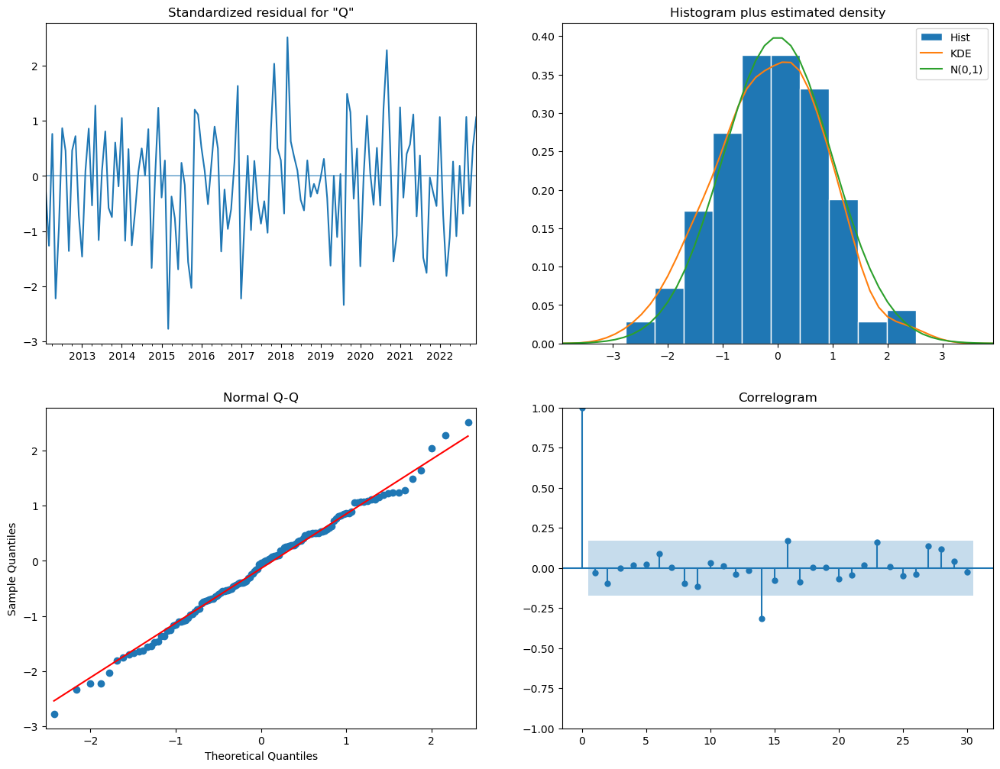

In [74]:
best_results_SARIMA_0.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

Inference
Note : 4 plots in the residuals diagnostic plots tell us :
- Standardized residuals plot The top left plot shows 1-step-ahead standardized residuals.
If model is working correctly, then no pattern should be obvious in the residuals which is clearly not visible from the plot as well .

- Histogram plus estimated density plot This plot shows the distribution of the residuals.The orange line shows a smoothed version of this histogram, and the green line shows a normal distribution. If the model is good these two lines should be the same. Here there are small differences between them, which indicate that our model is doing just well enough.

- Normal Q-Q plot The Q-Q plot compare the distribution of residuals to normal distribution. If the distribution of the residuals is normal, then all the points should lie along the red line, except for some values at the end, which is exactly happening in this case.

- Correlogram plot The correlogram plot is the ACF plot of the residuals rather than the data. 95% of the correlations for lag >0 should not be significant (within the blue shades). If there is a significant correlation in the residuals, it means that there is information in the data that was not captured by the model, which is clearly not in this case.

This introduction of time series models explains ARMA, ARIMA and SARIMA models in a progressive order.
* ARMA: Autoregressive + Moving Average
* ARIMA: Autoregressive + Moving Average + Trend Differencing
* SARIMA: Autoregressive + Moving Average + Trend Differencing + Seasonal Differencing
Furthermore, we explored concepts and techniques related to time series data, such as Stationarity, ADF test, ACF/PACF plot and AIC.

#### I will model this pattern for Q-P2, Q-P3, Q-P4, S-P1, S-P2, S-P3, S-P4, as well.

## Modeling for Q-P2, Q-P3, Q-P4, S-P1, S-P2, S-P3, S-P4

### AR Model
| AR Model : Autoregressive
- Use previous time period values to predict the current time period values AR Model building to estimate best 'p' ( Lowest AIC Approach )

In [75]:
# Creating an empty DataFrame with column names only
AR_AIC_results = []

for series_idx, series_data in enumerate(log_transformed_series_list[1:8], start=1):
    print(f"Results for log_transformed_series_list[{series_idx}]:")
    AR_AIC = pd.DataFrame(columns=['param', 'AIC'])
    
    for param in pdq_ar:
        ARIMA_model = ARIMA(series_data, order=param).fit()
        print('AR{} - AIC:{}'.format(param, ARIMA_model.aic))
        row = {'param': str(param), 'AIC': ARIMA_model.aic}
        AR_AIC = AR_AIC.append(row, ignore_index=True)

    AR_AIC_results.append(AR_AIC)
    print()  # for separating different series' results

Results for log_transformed_series_list[1]:
AR(1, 0, 0) - AIC:-509.96733889221855
AR(2, 0, 0) - AIC:-509.75125067015256
AR(3, 0, 0) - AIC:-509.0932512949946

Results for log_transformed_series_list[2]:
AR(1, 0, 0) - AIC:-498.21617804361915
AR(2, 0, 0) - AIC:-496.90272252594116
AR(3, 0, 0) - AIC:-495.2194009044774

Results for log_transformed_series_list[3]:
AR(1, 0, 0) - AIC:-535.5289309251714
AR(2, 0, 0) - AIC:-534.2135911089506
AR(3, 0, 0) - AIC:-532.2856201510826

Results for log_transformed_series_list[4]:
AR(1, 0, 0) - AIC:-493.1097168400777
AR(2, 0, 0) - AIC:-493.6158879425243
AR(3, 0, 0) - AIC:-491.6164279197475

Results for log_transformed_series_list[5]:
AR(1, 0, 0) - AIC:-509.96733889221844
AR(2, 0, 0) - AIC:-509.7512506701851
AR(3, 0, 0) - AIC:-509.09325129499484

Results for log_transformed_series_list[6]:
AR(1, 0, 0) - AIC:-498.21617804361904
AR(2, 0, 0) - AIC:-496.90272252593945
AR(3, 0, 0) - AIC:-495.2194009045009

Results for log_transformed_series_list[7]:
AR(1, 0, 0) 

In [76]:
best_model_AR1 = ARIMA(log_transformed_series_list[1], order = (1,0,0))#p=1 with lowest AIC
best_results_AR1 = best_model_AR1.fit()
best_model_AR2 = ARIMA(log_transformed_series_list[2], order = (1,0,0))#p=1 with lowest AIC
best_results_AR2 = best_model_AR2.fit()
best_model_AR3 = ARIMA(log_transformed_series_list[3], order = (1,0,0))#p=1 with lowest AIC
best_results_AR3 = best_model_AR3.fit()
best_model_AR4 = ARIMA(log_transformed_series_list[4], order = (2,0,0))#p=2 with lowest AIC
best_results_AR4 = best_model_AR4.fit()
best_model_AR5 = ARIMA(log_transformed_series_list[5], order = (1,0,0))#p=1 with lowest AIC
best_results_AR5 = best_model_AR5.fit()
best_model_AR6 = ARIMA(log_transformed_series_list[6], order = (1,0,0))#p=1 with lowest AIC
best_results_AR6 = best_model_AR6.fit()
best_model_AR7 = ARIMA(log_transformed_series_list[7], order = (1,0,0))#p=1 with lowest AIC
best_results_AR7 = best_model_AR7.fit()

In [77]:
print(best_results_AR1.summary().tables[0])
print(best_results_AR1.summary().tables[1])
print(best_results_AR2.summary().tables[0])
print(best_results_AR2.summary().tables[1])
print(best_results_AR3.summary().tables[0])
print(best_results_AR3.summary().tables[1])
print(best_results_AR4.summary().tables[0])
print(best_results_AR4.summary().tables[1])
print(best_results_AR5.summary().tables[0])
print(best_results_AR5.summary().tables[1])
print(best_results_AR6.summary().tables[0])
print(best_results_AR6.summary().tables[1])
print(best_results_AR7.summary().tables[0])
print(best_results_AR7.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P2   No. Observations:                  144
Model:                 ARIMA(1, 0, 0)   Log Likelihood                 257.984
Date:                Sun, 07 Apr 2024   AIC                           -509.967
Time:                        04:28:08   BIC                           -501.058
Sample:                    01-01-2011   HQIC                          -506.347
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8052      0.003   1478.002      0.000       4.799       4.812
ar.L1         -0.0581      0.086     -0.674      0.500      -0.227       0.111
sigma2         0.0016      0.000      8.042      0.0

#### Calculating RMSE for best AR model 

In [78]:
pred_dynamic_AR1 = best_results_AR1.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR1 = best_results_AR1.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR1 = pred_dynamic_AR1.predicted_mean
testCopy1_AR = test.copy()
testCopy1_AR['sales_ts_forecasted_QP2_AR'] = np.power(10, pred_dynamic_AR1.predicted_mean)

pred_dynamic_AR2 = best_results_AR2.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR2 = best_results_AR2.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR2 = pred_dynamic_AR2.predicted_mean
testCopy1_AR['sales_ts_forecasted_QP3_AR'] = np.power(10, pred_dynamic_AR2.predicted_mean)

pred_dynamic_AR3 = best_results_AR3.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR3 = best_results_AR3.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR3 = pred_dynamic_AR3.predicted_mean
testCopy1_AR['sales_ts_forecasted_QP4_AR'] = np.power(10, pred_dynamic_AR3.predicted_mean)

pred_dynamic_AR4 = best_results_AR4.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR4 = best_results_AR4.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR4 = pred_dynamic_AR4.predicted_mean
testCopy1_AR['sales_ts_forecasted_SP1_AR'] = np.power(10, pred_dynamic_AR4.predicted_mean)

pred_dynamic_AR5 = best_results_AR5.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR5 = best_results_AR5.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR5 = pred_dynamic_AR5.predicted_mean
testCopy1_AR['sales_ts_forecasted_SP2_AR'] = np.power(10, pred_dynamic_AR5.predicted_mean)

pred_dynamic_AR6 = best_results_AR6.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR6 = best_results_AR6.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR6 = pred_dynamic_AR6.predicted_mean
testCopy1_AR['sales_ts_forecasted_SP3_AR'] = np.power(10, pred_dynamic_AR6.predicted_mean)

pred_dynamic_AR7 = best_results_AR7.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_AR7 = best_results_AR7.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_AR7 = pred_dynamic_AR7.predicted_mean
testCopy1_AR['sales_ts_forecasted_SP4_AR'] = np.power(10, pred_dynamic_AR7.predicted_mean)

testCopy1_AR.head()

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP2_AR,sales_ts_forecasted_QP3_AR,sales_ts_forecasted_QP4_AR,sales_ts_forecasted_SP1_AR,sales_ts_forecasted_SP2_AR,sales_ts_forecasted_SP3_AR,sales_ts_forecasted_SP4_AR
Year_Month,,,,,,,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,64048.632352,96428.890531,33465.186585,396346.559595,406068.329113,522644.586678,238606.780352
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,63841.538973,93898.089901,33811.466741,390146.305466,404755.357091,508927.647263,241075.757863
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,63853.559487,94271.120840,33762.221803,391815.243021,404831.567146,510949.474954,240724.641458
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,63852.860642,94215.416265,33769.189783,392650.119921,404827.136468,510647.556156,240774.323150
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,63852.901267,94223.718506,33768.203134,392438.999651,404827.394034,510692.554302,240767.288349


In [79]:
# Compute the root mean square error
mse_AR1 = ((testCopy1_AR['Q-P2'] - testCopy1_AR['sales_ts_forecasted_QP2_AR']) ** 2).mean()
rmse_AR1 = np.sqrt(mse_AR1)
print('The Root Mean Squared Error of our forecasts AR Q-P2 is {}'.format(round(rmse_AR1, 3)))

# Compute the root mean square error
mse_AR2 = ((testCopy1_AR['Q-P3'] - testCopy1_AR['sales_ts_forecasted_QP3_AR']) ** 2).mean()
rmse_AR2 = np.sqrt(mse_AR2)
print('The Root Mean Squared Error of our forecasts AR Q-P3 is {}'.format(round(rmse_AR2, 3)))

# Compute the root mean square error
mse_AR3 = ((testCopy1_AR['Q-P4'] - testCopy1_AR['sales_ts_forecasted_QP4_AR']) ** 2).mean()
rmse_AR3 = np.sqrt(mse_AR3)
print('The Root Mean Squared Error of our forecasts AR Q-P4 is {}'.format(round(rmse_AR3, 3)))

# Compute the root mean square error
mse_AR4 = ((testCopy1_AR['S-P1'] - testCopy1_AR['sales_ts_forecasted_SP1_AR']) ** 2).mean()
rmse_AR4 = np.sqrt(mse_AR4)
print('The Root Mean Squared Error of our forecasts AR S-P1 is {}'.format(round(rmse_AR4, 3)))

# Compute the root mean square error
mse_AR5 = ((testCopy1_AR['S-P2'] - testCopy1_AR['sales_ts_forecasted_SP2_AR']) ** 2).mean()
rmse_AR5 = np.sqrt(mse_AR5)
print('The Root Mean Squared Error of our forecasts AR S-P2 is {}'.format(round(rmse_AR5, 3)))

# Compute the root mean square error
mse_AR6 = ((testCopy1_AR['S-P3'] - testCopy1_AR['sales_ts_forecasted_SP3_AR']) ** 2).mean()
rmse_AR6 = np.sqrt(mse_AR6)
print('The Root Mean Squared Error of our forecasts AR S-P3 is {}'.format(round(rmse_AR6, 3)))

# Compute the root mean square error
mse_AR7 = ((testCopy1_AR['S-P4'] - testCopy1_AR['sales_ts_forecasted_SP4_AR']) ** 2).mean()
rmse_AR7 = np.sqrt(mse_AR7)
print('The Root Mean Squared Error of our forecasts AR S-P4 is {}'.format(round(rmse_AR7, 3)))

The Root Mean Squared Error of our forecasts AR Q-P2 is 4831.926
The Root Mean Squared Error of our forecasts AR Q-P3 is 9097.458
The Root Mean Squared Error of our forecasts AR Q-P4 is 3080.922
The Root Mean Squared Error of our forecasts AR S-P1 is 40176.861
The Root Mean Squared Error of our forecasts AR S-P2 is 30634.409
The Root Mean Squared Error of our forecasts AR S-P3 is 49308.221
The Root Mean Squared Error of our forecasts AR S-P4 is 21966.973


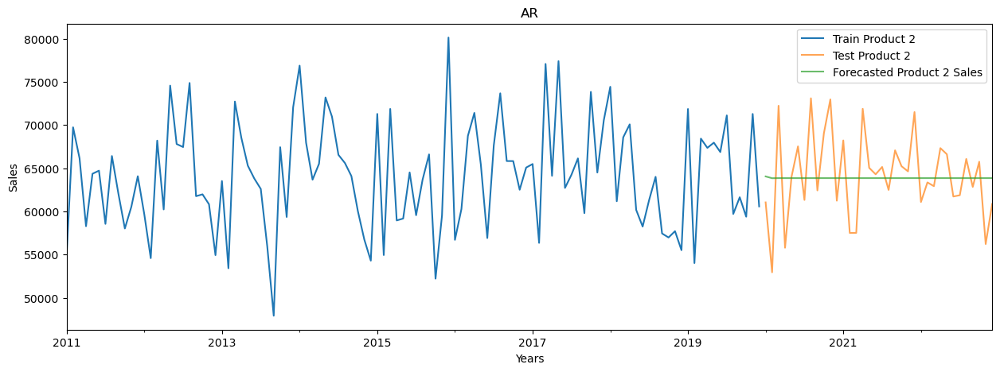

In [80]:
axis = train['Q-P2'].plot(label='Train Product 2', figsize=(15, 5))
testCopy1_AR['Q-P2'].plot(ax=axis, label='Test Product 2', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_QP2_AR'].plot(ax=axis, label='Forecasted Product 2 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

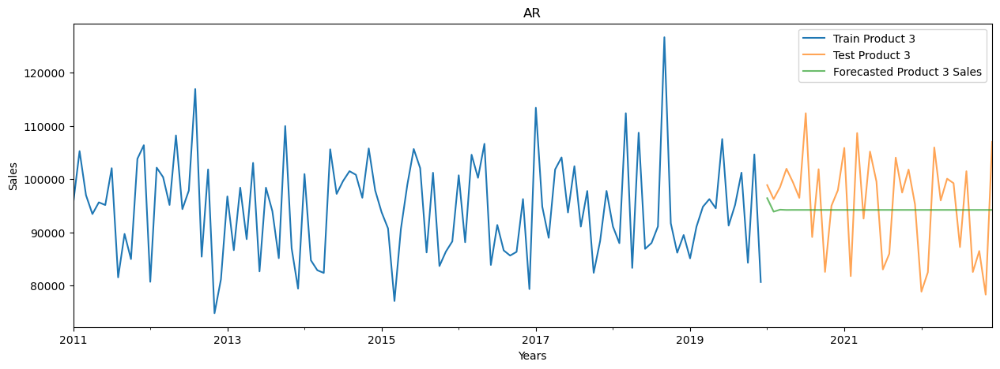

In [81]:
axis = train['Q-P3'].plot(label='Train Product 3', figsize=(15, 5))
testCopy1_AR['Q-P3'].plot(ax=axis, label='Test Product 3', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_QP3_AR'].plot(ax=axis, label='Forecasted Product 3 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

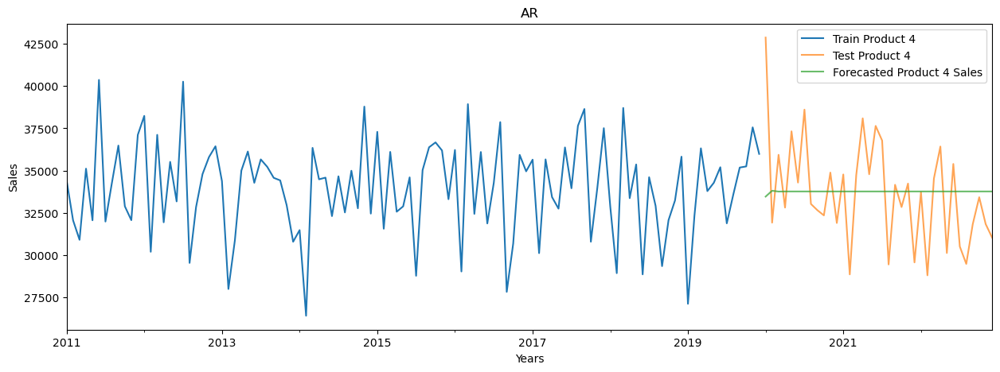

In [82]:
axis = train['Q-P4'].plot(label='Train Product 4', figsize=(15, 5))
testCopy1_AR['Q-P4'].plot(ax=axis, label='Test Product 4', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_QP4_AR'].plot(ax=axis, label='Forecasted Product 4 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

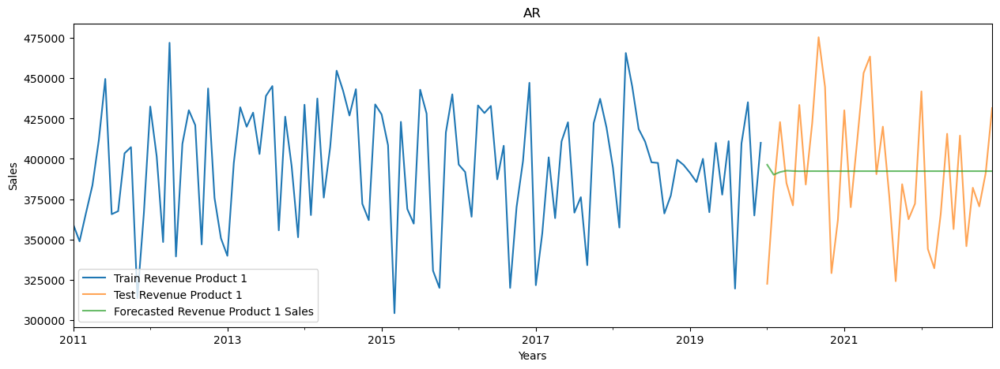

In [83]:
axis = train['S-P1'].plot(label='Train Revenue Product 1', figsize=(15, 5))
testCopy1_AR['S-P1'].plot(ax=axis, label='Test Revenue Product 1', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_SP1_AR'].plot(ax=axis, label='Forecasted Revenue Product 1 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

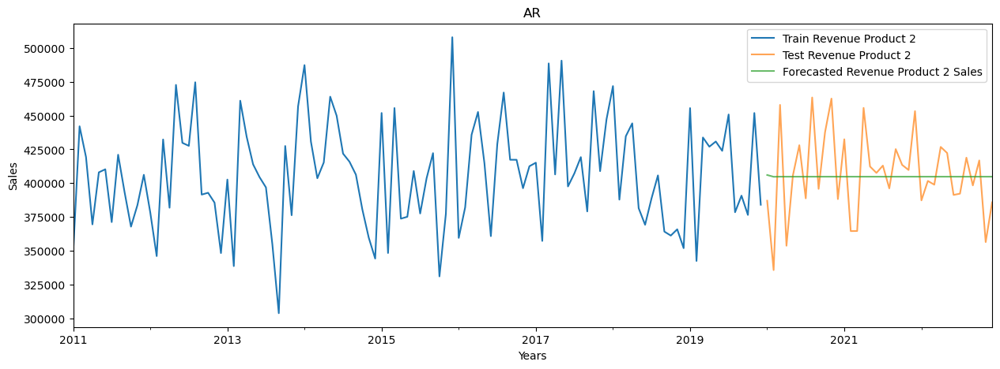

In [84]:
axis = train['S-P2'].plot(label='Train Revenue Product 2', figsize=(15, 5))
testCopy1_AR['S-P2'].plot(ax=axis, label='Test Revenue Product 2', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_SP2_AR'].plot(ax=axis, label='Forecasted Revenue Product 2 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

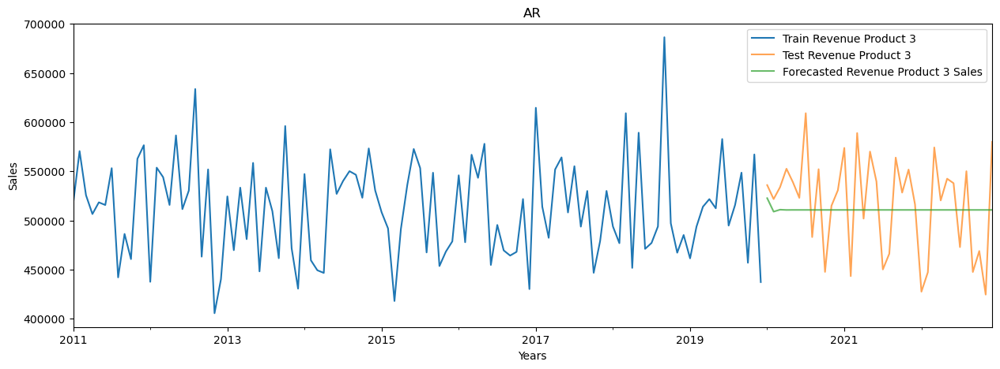

In [85]:
axis = train['S-P3'].plot(label='Train Revenue Product 3', figsize=(15, 5))
testCopy1_AR['S-P3'].plot(ax=axis, label='Test Revenue Product 3', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_SP3_AR'].plot(ax=axis, label='Forecasted Revenue Product 3 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

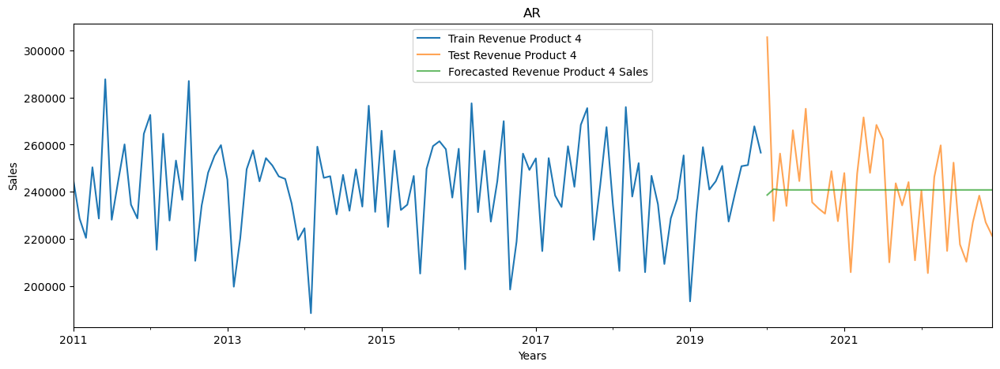

In [86]:
axis = train['S-P4'].plot(label='Train Revenue Product 4', figsize=(15, 5))
testCopy1_AR['S-P4'].plot(ax=axis, label='Test Revenue Product 4', alpha=0.7)
testCopy1_AR['sales_ts_forecasted_SP4_AR'].plot(ax=axis, label='Forecasted Revenue Product 4 Sales', alpha=0.7)
axis.set_title('AR')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [87]:
resultsDf_AR1 = pd.DataFrame({'RMSE': rmse_AR1}
                           ,index=['Best AR Model Product 2 : AR(1,0,0)'])
resultsDf_AR1

,RMSE
"Best AR Model Product 2 : AR(1,0,0)",4831.92574


In [88]:
resultsDf_AR2 = pd.DataFrame({'RMSE': rmse_AR2}
                           ,index=['Best AR Model Product 3 : AR(1,0,0)'])
resultsDf_AR2

,RMSE
"Best AR Model Product 3 : AR(1,0,0)",9097.457688


In [89]:
resultsDf_AR3 = pd.DataFrame({'RMSE': rmse_AR3}
                           ,index=['Best AR Model Product 4 : AR(1,0,0)'])
resultsDf_AR3

,RMSE
"Best AR Model Product 4 : AR(1,0,0)",3080.921856


In [90]:
resultsDf_AR4 = pd.DataFrame({'RMSE': rmse_AR4}
                           ,index=['Best AR Model Revenue Product 1 : AR(2,0,0)'])
resultsDf_AR4

,RMSE
"Best AR Model Revenue Product 1 : AR(2,0,0)",40176.861072


In [91]:
resultsDf_AR5 = pd.DataFrame({'RMSE': rmse_AR5}
                           ,index=['Best AR Model Revenue Product 2 : AR(1,0,0)'])
resultsDf_AR5

,RMSE
"Best AR Model Revenue Product 2 : AR(1,0,0)",30634.409195


In [92]:
resultsDf_AR6 = pd.DataFrame({'RMSE': rmse_AR6}
                           ,index=['Best AR Model Revenue Product 3 : AR(1,0,0)'])
resultsDf_AR6

,RMSE
"Best AR Model Revenue Product 3 : AR(1,0,0)",49308.220668


In [93]:
resultsDf_AR7 = pd.DataFrame({'RMSE': rmse_AR7}
                           ,index=['Best AR Model Revenue Product 4 : AR(1,0,0)'])
resultsDf_AR7

,RMSE
"Best AR Model Revenue Product 4 : AR(1,0,0)",21966.972834


### ARMA Model

- Improving AutoRegressive Models through Moving Average Forecasts.
- ARMA models consist of 2 components:-
- AR model: The data is modeled based on past observations.
- MA model: Previous forecast errors are incorporated into the model.

ARMA Model building to estimate best 'p' , 'q' ( Lowest AIC Approach )

In [94]:
# Creating an empty Dataframe with column names only
ARMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARMA_AIC

,param,AIC


In [95]:
# Creating an empty DataFrame with column names only
ARMA_AIC_results = []

for series_idx, series_data in enumerate(log_transformed_series_list[1:8], start=1):
    print(f"Results for log_transformed_series_list[{series_idx}]:")
    ARMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
    
    for param in pdq_arma:
        ARMA_model = ARIMA(series_data, order=param).fit()
        print('ARMA{} - AIC:{}'.format(param, ARMA_model.aic))
        row = {'param': str(param), 'AIC': ARMA_model.aic}
        ARMA_AIC = ARMA_AIC.append(row, ignore_index=True)

    ARMA_AIC_results.append(AR_AIC)
    print()  # for separating different series' results

Results for log_transformed_series_list[1]:
ARMA(1, 0, 1) - AIC:-507.50636553305833
ARMA(1, 0, 2) - AIC:-509.0475239347404
ARMA(1, 0, 3) - AIC:-508.3470723425261
ARMA(2, 0, 1) - AIC:-508.4633203727019
ARMA(2, 0, 2) - AIC:-511.17733198529277
ARMA(2, 0, 3) - AIC:-506.00690629293194
ARMA(3, 0, 1) - AIC:-508.4448147051097
ARMA(3, 0, 2) - AIC:-506.5641682093119
ARMA(3, 0, 3) - AIC:-507.1112779638139

Results for log_transformed_series_list[2]:
ARMA(1, 0, 1) - AIC:-496.87545375040924
ARMA(1, 0, 2) - AIC:-497.75403560652774
ARMA(1, 0, 3) - AIC:-499.3123224950158
ARMA(2, 0, 1) - AIC:-497.4425348006015
ARMA(2, 0, 2) - AIC:-498.57581299028357
ARMA(2, 0, 3) - AIC:-497.46811742466116
ARMA(3, 0, 1) - AIC:-498.6145311191364
ARMA(3, 0, 2) - AIC:-497.8154491489674
ARMA(3, 0, 3) - AIC:-500.33771474486593

Results for log_transformed_series_list[3]:
ARMA(1, 0, 1) - AIC:-534.6052069149617
ARMA(1, 0, 2) - AIC:-532.5256121802025
ARMA(1, 0, 3) - AIC:-531.0170418920775
ARMA(2, 0, 1) - AIC:-535.5436852012622


#### Building ARMA model with best p,q parameter 

In [96]:
best_model_ARMA1 = ARIMA(log_transformed_series_list[1],order = (2, 0, 2))
best_results_ARMA1 = best_model_ARMA1.fit()

In [97]:
print(best_results_ARMA1.summary().tables[0])
print(best_results_ARMA1.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P2   No. Observations:                  144
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 261.589
Date:                Sun, 07 Apr 2024   AIC                           -511.177
Time:                        04:28:21   BIC                           -493.358
Sample:                    01-01-2011   HQIC                          -503.937
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8051      0.003   1373.179      0.000       4.798       4.812
ar.L1          0.5854      0.121      4.822      0.000       0.347       0.823
ar.L2         -0.7896      0.135     -5.846      0.0

In [98]:
best_model_ARMA2 = ARIMA(log_transformed_series_list[2],order = (3, 0, 3))
best_results_ARMA2 = best_model_ARMA2.fit()

In [99]:
print(best_results_ARMA2.summary().tables[0])
print(best_results_ARMA2.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P3   No. Observations:                  144
Model:                 ARIMA(3, 0, 3)   Log Likelihood                 258.169
Date:                Sun, 07 Apr 2024   AIC                           -500.338
Time:                        04:28:21   BIC                           -476.579
Sample:                    01-01-2011   HQIC                          -490.684
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9745      0.001   3536.898      0.000       4.972       4.977
ar.L1          0.2911      0.189      1.540      0.123      -0.079       0.661
ar.L2         -0.2311      0.205     -1.126      0.2

In [100]:
best_model_ARMA3 = ARIMA(log_transformed_series_list[3],order = (1, 0, 1))
best_results_ARMA3 = best_model_ARMA3.fit()

In [101]:
print(best_results_ARMA3.summary().tables[0])
print(best_results_ARMA3.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P4   No. Observations:                  144
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 271.303
Date:                Sun, 07 Apr 2024   AIC                           -534.605
Time:                        04:28:21   BIC                           -522.726
Sample:                    01-01-2011   HQIC                          -529.778
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5285      0.003   1556.220      0.000       4.523       4.534
ar.L1         -0.6787      0.326     -2.084      0.037      -1.317      -0.040
ma.L1          0.5564      0.359      1.550      0.1

In [102]:
best_model_ARMA4 = ARIMA(log_transformed_series_list[4],order = (1, 0, 1))
best_results_ARMA4 = best_model_ARMA4.fit()

In [103]:
print(best_results_ARMA4.summary().tables[0])
print(best_results_ARMA4.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P1   No. Observations:                  144
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 249.818
Date:                Sun, 07 Apr 2024   AIC                           -491.637
Time:                        04:28:22   BIC                           -479.758
Sample:                    01-01-2011   HQIC                          -486.810
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.5937      0.004   1415.384      0.000       5.586       5.601
ar.L1         -0.4931      1.085     -0.454      0.650      -2.620       1.634
ma.L1          0.5465      1.047      0.522      0.6

In [104]:
best_model_ARMA5 = ARIMA(log_transformed_series_list[5],order = (2, 0, 2))
best_results_ARMA5 = best_model_ARMA5.fit()

In [105]:
print(best_results_ARMA5.summary().tables[0])
print(best_results_ARMA5.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P2   No. Observations:                  144
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 261.591
Date:                Sun, 07 Apr 2024   AIC                           -511.181
Time:                        04:28:22   BIC                           -493.362
Sample:                    01-01-2011   HQIC                          -503.941
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.6071      0.004   1600.525      0.000       5.600       5.614
ar.L1          0.5866      0.120      4.896      0.000       0.352       0.821
ar.L2         -0.7893      0.133     -5.943      0.0

In [106]:
best_model_ARMA6 = ARIMA(log_transformed_series_list[6],order = (3, 0, 3))
best_results_ARMA6 = best_model_ARMA6.fit()

In [107]:
print(best_results_ARMA6.summary().tables[0])
print(best_results_ARMA6.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P3   No. Observations:                  144
Model:                 ARIMA(3, 0, 3)   Log Likelihood                 258.169
Date:                Sun, 07 Apr 2024   AIC                           -500.338
Time:                        04:28:22   BIC                           -476.580
Sample:                    01-01-2011   HQIC                          -490.684
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.7085      0.001   4060.214      0.000       5.706       5.711
ar.L1          0.2909      0.189      1.541      0.123      -0.079       0.661
ar.L2         -0.2310      0.205     -1.127      0.2

In [108]:
best_model_ARMA7 = ARIMA(log_transformed_series_list[7],order = (2, 0, 1))
best_results_ARMA7 = best_model_ARMA7.fit()

In [109]:
print(best_results_ARMA7.summary().tables[0])
print(best_results_ARMA7.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P4   No. Observations:                  144
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 272.740
Date:                Sun, 07 Apr 2024   AIC                           -535.479
Time:                        04:28:22   BIC                           -520.630
Sample:                    01-01-2011   HQIC                          -529.445
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.3816      0.003   1857.787      0.000       5.376       5.387
ar.L1         -1.0886      0.111     -9.783      0.000      -1.307      -0.870
ar.L2         -0.0894      0.098     -0.914      0.3

#### Calculating RMSE for best MA model 

In [110]:
pred_dynamic_ARMA1 = best_results_ARMA1.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA1 = best_results_ARMA1.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA1 = pred_dynamic_ARMA1.predicted_mean
testCopy1_ARMA = test.copy()
testCopy1_ARMA['sales_ts_forecasted_QP2_ARMA'] = np.power(10, pred_dynamic_ARMA1.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA2 = best_results_ARMA2.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA2 = best_results_ARMA2.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA2 = pred_dynamic_ARMA2.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_QP3_ARMA'] = np.power(10, pred_dynamic_ARMA2.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA3 = best_results_ARMA3.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA3 = best_results_ARMA3.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA3 = pred_dynamic_ARMA3.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_QP4_ARMA'] = np.power(10, pred_dynamic_ARMA3.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA4 = best_results_ARMA4.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA4 = best_results_ARMA4.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA4 = pred_dynamic_ARMA4.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_SP1_ARMA'] = np.power(10, pred_dynamic_ARMA4.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA5 = best_results_ARMA5.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA5 = best_results_ARMA5.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA5 = pred_dynamic_ARMA5.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_SP2_ARMA'] = np.power(10, pred_dynamic_ARMA5.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA6 = best_results_ARMA6.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA6 = best_results_ARMA6.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA6 = pred_dynamic_ARMA6.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_SP3_ARMA'] = np.power(10, pred_dynamic_ARMA6.predicted_mean)
testCopy1_ARMA.head()

pred_dynamic_ARMA7 = best_results_ARMA7.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARMA7 = best_results_ARMA7.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARMA7 = pred_dynamic_ARMA7.predicted_mean
testCopy1_ARMA['sales_ts_forecasted_SP4_ARMA'] = np.power(10, pred_dynamic_ARMA7.predicted_mean)
testCopy1_ARMA.head()

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP2_ARMA,sales_ts_forecasted_QP3_ARMA,sales_ts_forecasted_QP4_ARMA,sales_ts_forecasted_SP1_ARMA,sales_ts_forecasted_SP2_ARMA,sales_ts_forecasted_SP3_ARMA,sales_ts_forecasted_SP4_ARMA
Year_Month,,,,,,,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,64891.101747,97830.320995,33708.841056,394108.742975,411716.533932,530241.054906,242183.384971
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,66812.119084,93437.190649,33806.967976,391453.921172,423901.134148,506428.460048,237869.170116
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,64724.210659,94032.600225,33740.334345,392760.683514,410232.394878,509642.410698,243827.310011
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,62085.455196,96182.710259,33785.546835,392115.817918,393261.990505,521310.377975,237730.369963
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,62129.030658,94465.395887,33754.852768,392433.647398,393689.202830,512001.230753,243834.689843


In [111]:
# Compute the root mean square error
mse_ARMA1 = ((testCopy1_ARMA['Q-P2'] - testCopy1_ARMA['sales_ts_forecasted_QP2_ARMA']) ** 2).mean()
rmse_ARMA1 = np.sqrt(mse_ARMA1)
print('The Root Mean Squared Error of our forecasts Q-P2 ARMA1 is {}'.format(round(rmse_ARMA1, 3)))

# Compute the root mean square error
mse_ARMA2 = ((testCopy1_ARMA['Q-P3'] - testCopy1_ARMA['sales_ts_forecasted_QP3_ARMA']) ** 2).mean()
rmse_ARMA2 = np.sqrt(mse_ARMA2)
print('The Root Mean Squared Error of our forecasts Q-P3 ARMA2 is {}'.format(round(rmse_ARMA2, 3)))

# Compute the root mean square error
mse_ARMA3 = ((testCopy1_ARMA['Q-P4'] - testCopy1_ARMA['sales_ts_forecasted_QP4_ARMA']) ** 2).mean()
rmse_ARMA3 = np.sqrt(mse_ARMA3)
print('The Root Mean Squared Error of our forecasts Q-P4 ARMA3 is {}'.format(round(rmse_ARMA3, 3)))

# Compute the root mean square error
mse_ARMA4 = ((testCopy1_ARMA['S-P1'] - testCopy1_ARMA['sales_ts_forecasted_SP1_ARMA']) ** 2).mean()
rmse_ARMA4 = np.sqrt(mse_ARMA4)
print('The Root Mean Squared Error of our forecasts S-P1 ARMA4 is {}'.format(round(rmse_ARMA4, 3)))

# Compute the root mean square error
mse_ARMA5 = ((testCopy1_ARMA['S-P2'] - testCopy1_ARMA['sales_ts_forecasted_SP2_ARMA']) ** 2).mean()
rmse_ARMA5 = np.sqrt(mse_ARMA5)
print('The Root Mean Squared Error of our forecasts S-P2 ARMA5 is {}'.format(round(rmse_ARMA5, 3)))

# Compute the root mean square error
mse_ARMA6 = ((testCopy1_ARMA['S-P3'] - testCopy1_ARMA['sales_ts_forecasted_SP3_ARMA']) ** 2).mean()
rmse_ARMA6 = np.sqrt(mse_ARMA6)
print('The Root Mean Squared Error of our forecasts S-P3 ARMA6 is {}'.format(round(rmse_ARMA6, 3)))

# Compute the root mean square error
mse_ARMA7 = ((testCopy1_ARMA['S-P4'] - testCopy1_ARMA['sales_ts_forecasted_SP4_ARMA']) ** 2).mean()
rmse_ARMA7 = np.sqrt(mse_ARMA7)
print('The Root Mean Squared Error of our forecasts S-P4 ARMA7 is {}'.format(round(rmse_ARMA7, 3)))

The Root Mean Squared Error of our forecasts Q-P2 ARMA1 is 4930.657
The Root Mean Squared Error of our forecasts Q-P3 ARMA2 is 9034.622
The Root Mean Squared Error of our forecasts Q-P4 ARMA3 is 3061.521
The Root Mean Squared Error of our forecasts S-P1 ARMA4 is 40052.638
The Root Mean Squared Error of our forecasts S-P2 ARMA5 is 31293.444
The Root Mean Squared Error of our forecasts S-P3 ARMA6 is 48968.143
The Root Mean Squared Error of our forecasts S-P4 ARMA7 is 21090.606


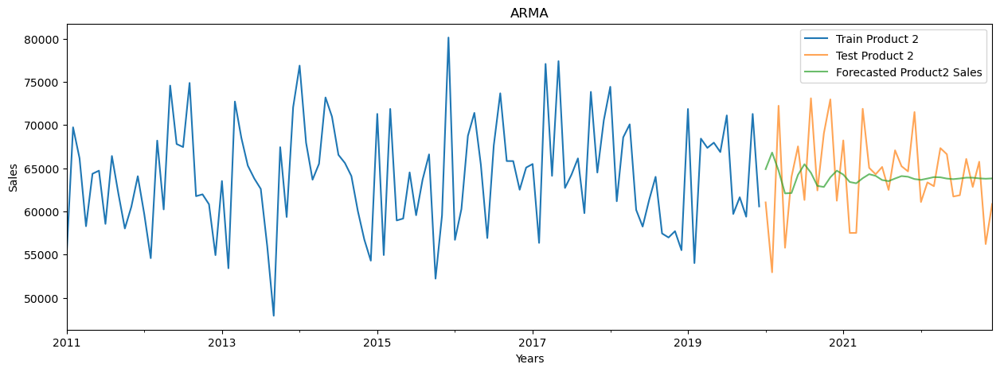

In [112]:
axis = train['Q-P2'].plot(label='Train Product 2', figsize=(15, 5))
testCopy1_ARMA['Q-P2'].plot(ax=axis, label='Test Product 2', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_QP2_ARMA'].plot(ax=axis, label='Forecasted Product2 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

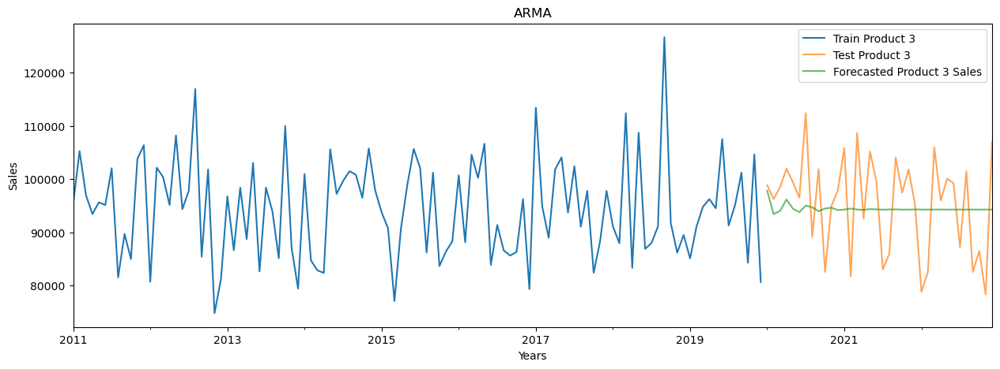

In [113]:
axis = train['Q-P3'].plot(label='Train Product 3', figsize=(15, 5))
testCopy1_ARMA['Q-P3'].plot(ax=axis, label='Test Product 3', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_QP3_ARMA'].plot(ax=axis, label='Forecasted Product 3 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

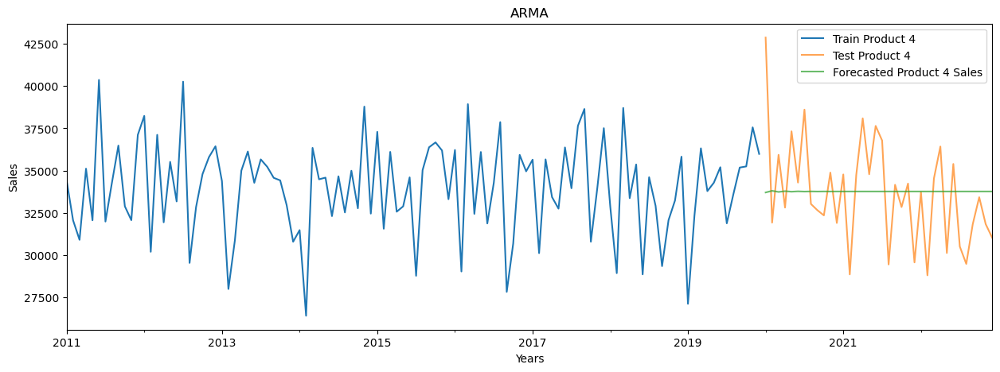

In [114]:
axis = train['Q-P4'].plot(label='Train Product 4', figsize=(15, 5))
testCopy1_ARMA['Q-P4'].plot(ax=axis, label='Test Product 4', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_QP4_ARMA'].plot(ax=axis, label='Forecasted Product 4 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

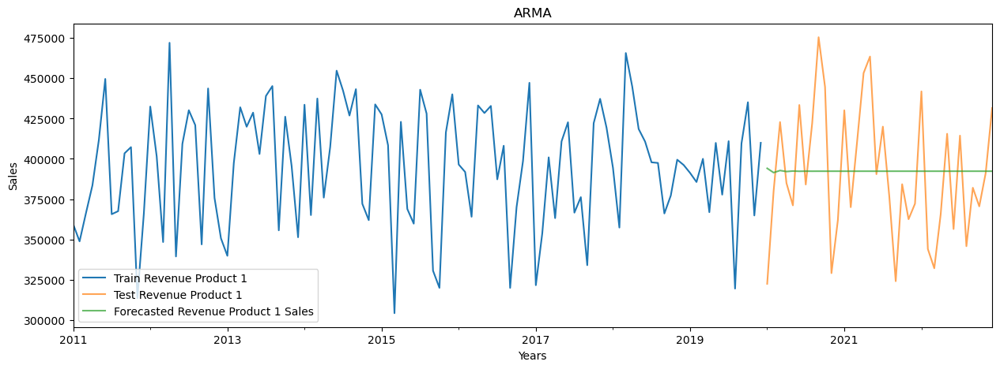

In [115]:
axis = train['S-P1'].plot(label='Train Revenue Product 1', figsize=(15, 5))
testCopy1_ARMA['S-P1'].plot(ax=axis, label='Test Revenue Product 1', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_SP1_ARMA'].plot(ax=axis, label='Forecasted Revenue Product 1 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

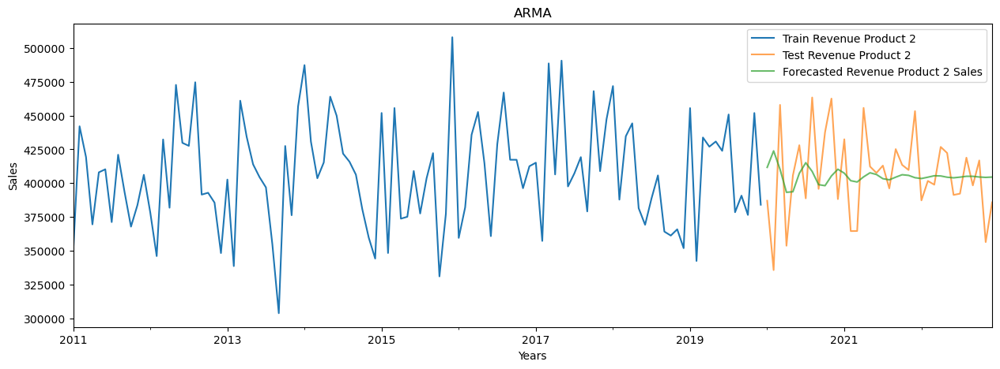

In [116]:
axis = train['S-P2'].plot(label='Train Revenue Product 2', figsize=(15, 5))
testCopy1_ARMA['S-P2'].plot(ax=axis, label='Test Revenue Product 2', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_SP2_ARMA'].plot(ax=axis, label='Forecasted Revenue Product 2 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

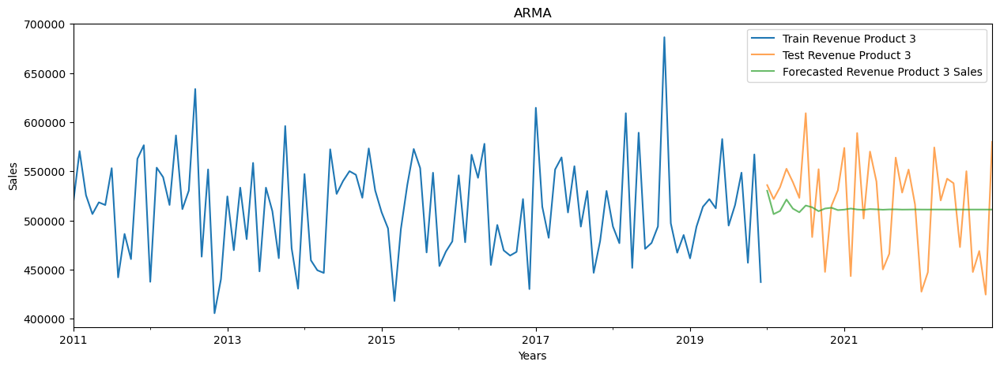

In [117]:
axis = train['S-P3'].plot(label='Train Revenue Product 3', figsize=(15, 5))
testCopy1_ARMA['S-P3'].plot(ax=axis, label='Test Revenue Product 3', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_SP3_ARMA'].plot(ax=axis, label='Forecasted Revenue Product 3 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

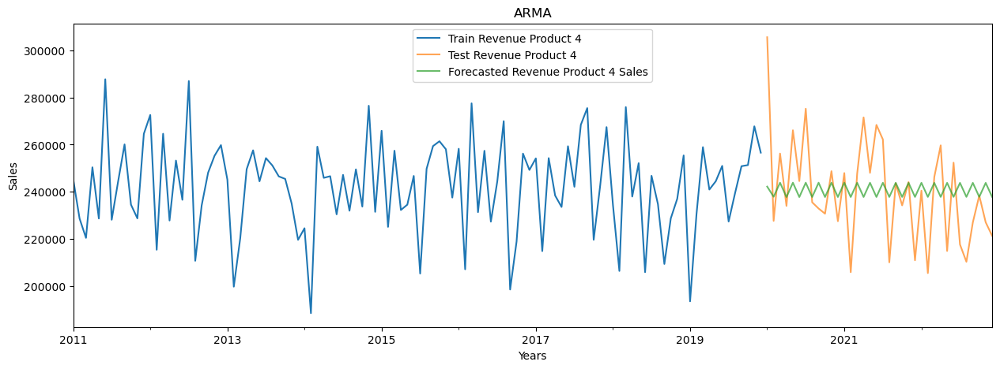

In [118]:
axis = train['S-P4'].plot(label='Train Revenue Product 4', figsize=(15, 5))
testCopy1_ARMA['S-P4'].plot(ax=axis, label='Test Revenue Product 4', alpha=0.7)
testCopy1_ARMA['sales_ts_forecasted_SP4_ARMA'].plot(ax=axis, label='Forecasted Revenue Product 4 Sales', alpha=0.7)
axis.set_title('ARMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [119]:
resultsDf_ARMA1 = pd.DataFrame({'RMSE': rmse_ARMA1}
                           ,index=['Best ARMA Model Product 2 : ARMA(2, 0, 2)'])
resultsDf_ARMA1
pd.concat([resultsDf_AR1,resultsDf_ARMA1])

,RMSE
"Best AR Model Product 2 : AR(1,0,0)",4831.925740
"Best ARMA Model Product 2 : ARMA(2, 0, 2)",4930.656694


In [120]:
resultsDf_ARMA2 = pd.DataFrame({'RMSE': rmse_ARMA2}
                           ,index=['Best ARMA Model Product 3 : ARMA(3, 0, 3)'])
resultsDf_ARMA1
pd.concat([resultsDf_AR2,resultsDf_ARMA2])

,RMSE
"Best AR Model Product 3 : AR(1,0,0)",9097.457688
"Best ARMA Model Product 3 : ARMA(3, 0, 3)",9034.622200


In [121]:
resultsDf_ARMA3 = pd.DataFrame({'RMSE': rmse_ARMA3}
                           ,index=['Best ARMA Model Product 4 : ARMA(1, 0, 1)'])
resultsDf_ARMA3
pd.concat([resultsDf_AR3,resultsDf_ARMA3])

,RMSE
"Best AR Model Product 4 : AR(1,0,0)",3080.921856
"Best ARMA Model Product 4 : ARMA(1, 0, 1)",3061.521141


In [122]:
resultsDf_ARMA4 = pd.DataFrame({'RMSE': rmse_ARMA4}
                           ,index=['Best ARMA Model Revenue Product 1 : ARMA(1, 0, 1)'])
resultsDf_ARMA4
pd.concat([resultsDf_AR4, resultsDf_ARMA4])

,RMSE
"Best AR Model Revenue Product 1 : AR(2,0,0)",40176.861072
"Best ARMA Model Revenue Product 1 : ARMA(1, 0, 1)",40052.637944


In [123]:
resultsDf_ARMA5 = pd.DataFrame({'RMSE': rmse_ARMA5}
                           ,index=['Best ARMA Model Revenue Product 2 : ARMA(2, 0, 2)'])
resultsDf_ARMA5
pd.concat([resultsDf_AR5, resultsDf_ARMA5])

,RMSE
"Best AR Model Revenue Product 2 : AR(1,0,0)",30634.409195
"Best ARMA Model Revenue Product 2 : ARMA(2, 0, 2)",31293.444292


In [124]:
resultsDf_ARMA6 = pd.DataFrame({'RMSE': rmse_ARMA6}
                           ,index=['Best ARMA Model Revenue Product 3 : ARMA(3, 0, 3)'])
resultsDf_ARMA6
pd.concat([resultsDf_AR6,resultsDf_ARMA6])

,RMSE
"Best AR Model Revenue Product 3 : AR(1,0,0)",49308.220668
"Best ARMA Model Revenue Product 3 : ARMA(3, 0, 3)",48968.143077


In [125]:
resultsDf_ARMA7 = pd.DataFrame({'RMSE': rmse_ARMA7}
                           ,index=['Best ARMA Model Revenue Product 4 : ARMA(2, 0, 1)'])
resultsDf_ARMA7
pd.concat([resultsDf_AR7,resultsDf_ARMA7])

,RMSE
"Best AR Model Revenue Product 4 : AR(1,0,0)",21966.972834
"Best ARMA Model Revenue Product 4 : ARMA(2, 0, 1)",21090.605765


### ARIMA Model

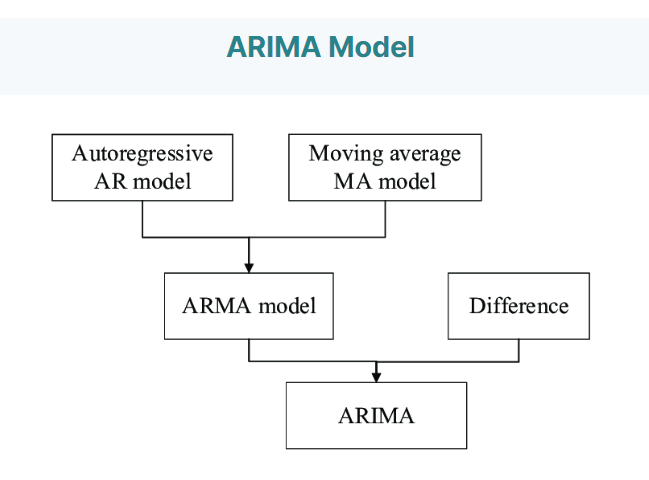

- ARIMA:- Auto Regressive Integrated Moving Average is a way of modeling time series data for forecasting or predicting future data points.
- Improving AR Models by making Time Series stationary through Moving AVerage Forecasts
- ARIMA models consist of 3 components:-
- AR model: The data is modeled based on past observations.
- Integrated component: Whether the data needs to be differenced/transformed.
- MA model: Previous forecast errors are incorporated into the model.

ARIMA Model building to estimate best 'p' , 'd' , 'q' paramters ( Lowest AIC Approach )

#### Q-P2 ARIMA

In [126]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_1 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_1

,param,AIC


In [127]:
for param in pdq:
    ARIMA_model_1 = ARIMA(log_transformed_series_list[1], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_1.aic))
    row = {'param': param, 'AIC': ARIMA_model_1.aic}
    ARIMA_AIC_1 = pd.concat([ARIMA_AIC_1, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-507.50636553305833
ARIMA(1, 0, 2) - AIC:-509.0475239347404
ARIMA(1, 0, 3) - AIC:-508.3470723425261
ARIMA(1, 1, 1) - AIC:-500.3078552262471
ARIMA(1, 1, 2) - AIC:-498.0352335753499
ARIMA(1, 1, 3) - AIC:-496.24962837844055
ARIMA(2, 0, 1) - AIC:-508.4633203727019
ARIMA(2, 0, 2) - AIC:-511.17733198529277
ARIMA(2, 0, 3) - AIC:-506.00690629293194
ARIMA(2, 1, 1) - AIC:-500.3245546799335
ARIMA(2, 1, 2) - AIC:-496.3661056624399
ARIMA(2, 1, 3) - AIC:-503.47183525877267
ARIMA(3, 0, 1) - AIC:-508.4448147051097
ARIMA(3, 0, 2) - AIC:-506.5641682093119
ARIMA(3, 0, 3) - AIC:-507.1112779638139
ARIMA(3, 1, 1) - AIC:-499.86687255161263
ARIMA(3, 1, 2) - AIC:-496.40026639184345
ARIMA(3, 1, 3) - AIC:-497.40035880285296


#### Building ARIMA model with best parameters p,d,q

In [128]:
best_model_ARIMA1 = ARIMA(log_transformed_series_list[1],order = (2, 0, 2))
best_results_ARIMA1 = best_model_ARIMA1.fit()

In [129]:
print(best_results_ARIMA1.summary().tables[0])
print(best_results_ARIMA1.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P2   No. Observations:                  144
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 261.589
Date:                Sun, 07 Apr 2024   AIC                           -511.177
Time:                        04:28:27   BIC                           -493.358
Sample:                    01-01-2011   HQIC                          -503.937
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.8051      0.003   1373.179      0.000       4.798       4.812
ar.L1          0.5854      0.121      4.822      0.000       0.347       0.823
ar.L2         -0.7896      0.135     -5.846      0.0

#### Q-P3 ARIMA

In [130]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_2 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_2

,param,AIC


In [131]:
for param in pdq:
    ARIMA_model_2 = ARIMA(log_transformed_series_list[2], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_2.aic))
    row = {'param': param, 'AIC': ARIMA_model_2.aic}
    ARIMA_AIC_2 = pd.concat([ARIMA_AIC_2, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-496.87545375040924
ARIMA(1, 0, 2) - AIC:-497.75403560652774
ARIMA(1, 0, 3) - AIC:-499.3123224950158
ARIMA(1, 1, 1) - AIC:-488.4647915339111
ARIMA(1, 1, 2) - AIC:-488.80896706845346
ARIMA(1, 1, 3) - AIC:-487.69882419411954
ARIMA(2, 0, 1) - AIC:-497.4425348006015
ARIMA(2, 0, 2) - AIC:-498.57581299028357
ARIMA(2, 0, 3) - AIC:-497.46811742466116
ARIMA(2, 1, 1) - AIC:-487.3107994475934
ARIMA(2, 1, 2) - AIC:-487.7537319936359
ARIMA(2, 1, 3) - AIC:-498.31552458970157
ARIMA(3, 0, 1) - AIC:-498.6145311191364
ARIMA(3, 0, 2) - AIC:-497.8154491489674
ARIMA(3, 0, 3) - AIC:-500.33771474486593
ARIMA(3, 1, 1) - AIC:-485.53403237658074
ARIMA(3, 1, 2) - AIC:-485.86855729683566
ARIMA(3, 1, 3) - AIC:-480.9428214262357


#### Building ARIMA model with best parameters p,d,q

In [132]:
best_model_ARIMA2 = ARIMA(log_transformed_series_list[2],order = (3, 0, 3))
best_results_ARIMA2 = best_model_ARIMA2.fit()

In [133]:
print(best_results_ARIMA2.summary().tables[0])
print(best_results_ARIMA2.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P3   No. Observations:                  144
Model:                 ARIMA(3, 0, 3)   Log Likelihood                 258.169
Date:                Sun, 07 Apr 2024   AIC                           -500.338
Time:                        04:28:31   BIC                           -476.579
Sample:                    01-01-2011   HQIC                          -490.684
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.9745      0.001   3536.898      0.000       4.972       4.977
ar.L1          0.2911      0.189      1.540      0.123      -0.079       0.661
ar.L2         -0.2311      0.205     -1.126      0.2

#### Q-P4 ARIMA

In [134]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_3 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_3

,param,AIC


In [135]:
for param in pdq:
    ARIMA_model_3 = ARIMA(log_transformed_series_list[3], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_3.aic))
    row = {'param': param, 'AIC': ARIMA_model_3.aic}
    ARIMA_AIC_3 = pd.concat([ARIMA_AIC_3, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-534.6052069149617
ARIMA(1, 0, 2) - AIC:-532.5256121802025
ARIMA(1, 0, 3) - AIC:-531.0170418920775
ARIMA(1, 1, 1) - AIC:-525.5438855601385
ARIMA(1, 1, 2) - AIC:-526.5202728390444
ARIMA(1, 1, 3) - AIC:-525.5634640358674
ARIMA(2, 0, 1) - AIC:-535.5436852012622
ARIMA(2, 0, 2) - AIC:-530.6115270003053
ARIMA(2, 0, 3) - AIC:-531.64570429313
ARIMA(2, 1, 1) - AIC:-524.1509088735463
ARIMA(2, 1, 2) - AIC:-525.6587246527927
ARIMA(2, 1, 3) - AIC:-521.4889159848617
ARIMA(3, 0, 1) - AIC:-530.2610278328875
ARIMA(3, 0, 2) - AIC:-531.0263930809446
ARIMA(3, 0, 3) - AIC:-529.2480420334032
ARIMA(3, 1, 1) - AIC:-522.397814735633
ARIMA(3, 1, 2) - AIC:-523.4056151786953
ARIMA(3, 1, 3) - AIC:-523.8000940127217


#### Building ARIMA model with best parameters p,d,q

In [136]:
best_model_ARIMA3 = ARIMA(log_transformed_series_list[3],order = (2, 0, 1))
best_results_ARIMA3 = best_model_ARIMA3.fit()

In [137]:
print(best_results_ARIMA3.summary().tables[0])
print(best_results_ARIMA3.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   Q-P4   No. Observations:                  144
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 272.772
Date:                Sun, 07 Apr 2024   AIC                           -535.544
Time:                        04:28:34   BIC                           -520.695
Sample:                    01-01-2011   HQIC                          -529.510
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.5285      0.003   1562.961      0.000       4.523       4.534
ar.L1         -1.0892      0.109    -10.005      0.000      -1.303      -0.876
ar.L2         -0.0899      0.097     -0.923      0.3

#### S-P1 ARIMA

In [138]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_4 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_4

,param,AIC


In [139]:
for param in pdq:
    ARIMA_model_4 = ARIMA(log_transformed_series_list[4], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_4.aic))
    row = {'param': param, 'AIC': ARIMA_model_1.aic}
    ARIMA_AIC_4 = pd.concat([ARIMA_AIC_4, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-491.6369442083319
ARIMA(1, 0, 2) - AIC:-491.4724720271719
ARIMA(1, 0, 3) - AIC:-489.48529671038165
ARIMA(1, 1, 1) - AIC:-483.70674456834354
ARIMA(1, 1, 2) - AIC:-482.2735646049555
ARIMA(1, 1, 3) - AIC:-480.8018024626321
ARIMA(2, 0, 1) - AIC:-491.61626355448965
ARIMA(2, 0, 2) - AIC:-489.6414131662808
ARIMA(2, 0, 3) - AIC:-489.47357515305197
ARIMA(2, 1, 1) - AIC:-483.95286613080293
ARIMA(2, 1, 2) - AIC:-479.72570944133207
ARIMA(2, 1, 3) - AIC:-489.13477445719286
ARIMA(3, 0, 1) - AIC:-489.6165803191135
ARIMA(3, 0, 2) - AIC:-487.6261684674499
ARIMA(3, 0, 3) - AIC:-487.9650194136265
ARIMA(3, 1, 1) - AIC:-481.9652274567258
ARIMA(3, 1, 2) - AIC:-480.304084381773
ARIMA(3, 1, 3) - AIC:-487.227071932003


#### Building ARIMA model with best parameters p,d,q

In [140]:
best_model_ARIMA4 = ARIMA(log_transformed_series_list[4],order = (1, 0, 1))
best_results_ARIMA4 = best_model_ARIMA4.fit()

In [141]:
print(best_results_ARIMA4.summary().tables[0])
print(best_results_ARIMA4.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P1   No. Observations:                  144
Model:                 ARIMA(1, 0, 1)   Log Likelihood                 249.818
Date:                Sun, 07 Apr 2024   AIC                           -491.637
Time:                        04:28:37   BIC                           -479.758
Sample:                    01-01-2011   HQIC                          -486.810
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.5937      0.004   1415.384      0.000       5.586       5.601
ar.L1         -0.4931      1.085     -0.454      0.650      -2.620       1.634
ma.L1          0.5465      1.047      0.522      0.6

#### S-P2 ARIMA

In [142]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_5 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_5

,param,AIC


In [143]:
for param in pdq:
    ARIMA_model_5 = ARIMA(log_transformed_series_list[5], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_5.aic))
    row = {'param': param, 'AIC': ARIMA_model_5.aic}
    ARIMA_AIC_5 = pd.concat([ARIMA_AIC_5, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-507.5063655330522
ARIMA(1, 0, 2) - AIC:-509.04752393459296
ARIMA(1, 0, 3) - AIC:-508.3470723455207
ARIMA(1, 1, 1) - AIC:-500.3091462179946
ARIMA(1, 1, 2) - AIC:-498.02821936570393
ARIMA(1, 1, 3) - AIC:-496.2493324870425
ARIMA(2, 0, 1) - AIC:-508.46332016525696
ARIMA(2, 0, 2) - AIC:-511.1811510798609
ARIMA(2, 0, 3) - AIC:-506.00692011804153
ARIMA(2, 1, 1) - AIC:-500.3235316305693
ARIMA(2, 1, 2) - AIC:-496.36544771654553
ARIMA(2, 1, 3) - AIC:-502.04314256615794
ARIMA(3, 0, 1) - AIC:-508.44481487730957
ARIMA(3, 0, 2) - AIC:-506.5641666583159
ARIMA(3, 0, 3) - AIC:-507.1113338691091
ARIMA(3, 1, 1) - AIC:-499.86699389243415
ARIMA(3, 1, 2) - AIC:-496.39104887704445
ARIMA(3, 1, 3) - AIC:-497.3223380095761


#### Building ARIMA model with best parameters p,d,q

In [144]:
best_model_ARIMA5 = ARIMA(log_transformed_series_list[5],order = (2, 0, 2))
best_results_ARIMA5 = best_model_ARIMA5.fit()

In [145]:
print(best_results_ARIMA5.summary().tables[0])
print(best_results_ARIMA5.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P2   No. Observations:                  144
Model:                 ARIMA(2, 0, 2)   Log Likelihood                 261.591
Date:                Sun, 07 Apr 2024   AIC                           -511.181
Time:                        04:28:40   BIC                           -493.362
Sample:                    01-01-2011   HQIC                          -503.941
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.6071      0.004   1600.525      0.000       5.600       5.614
ar.L1          0.5866      0.120      4.896      0.000       0.352       0.821
ar.L2         -0.7893      0.133     -5.943      0.0

#### S-P3 ARIMA

In [146]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_6 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_6

,param,AIC


In [147]:
for param in pdq:
    ARIMA_model_6 = ARIMA(log_transformed_series_list[6], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_6.aic))
    row = {'param': param, 'AIC': ARIMA_model_6.aic}
    ARIMA_AIC_6 = pd.concat([ARIMA_AIC_6, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-496.87545375041094
ARIMA(1, 0, 2) - AIC:-497.7515728679292
ARIMA(1, 0, 3) - AIC:-499.31232248485185
ARIMA(1, 1, 1) - AIC:-488.4791559179063
ARIMA(1, 1, 2) - AIC:-488.80896722361535
ARIMA(1, 1, 3) - AIC:-487.6988041760701
ARIMA(2, 0, 1) - AIC:-497.44253436693015
ARIMA(2, 0, 2) - AIC:-498.53970161500865
ARIMA(2, 0, 3) - AIC:-497.46811719566824
ARIMA(2, 1, 1) - AIC:-487.3106558989232
ARIMA(2, 1, 2) - AIC:-487.7550713877991
ARIMA(2, 1, 3) - AIC:-483.1455305069322
ARIMA(3, 0, 1) - AIC:-498.6146741170116
ARIMA(3, 0, 2) - AIC:-497.97806021201984
ARIMA(3, 0, 3) - AIC:-500.3383361069074
ARIMA(3, 1, 1) - AIC:-485.5392588486319
ARIMA(3, 1, 2) - AIC:-485.86855711513493
ARIMA(3, 1, 3) - AIC:-481.2441619350731


#### Building ARIMA model with best parameters p,d,q

In [148]:
best_model_ARIMA6 = ARIMA(log_transformed_series_list[6],order = (3, 0, 3))
best_results_ARIMA6 = best_model_ARIMA6.fit()

In [149]:
print(best_results_ARIMA6.summary().tables[0])
print(best_results_ARIMA6.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P3   No. Observations:                  144
Model:                 ARIMA(3, 0, 3)   Log Likelihood                 258.169
Date:                Sun, 07 Apr 2024   AIC                           -500.338
Time:                        04:28:44   BIC                           -476.580
Sample:                    01-01-2011   HQIC                          -490.684
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.7085      0.001   4060.214      0.000       5.706       5.711
ar.L1          0.2909      0.189      1.541      0.123      -0.079       0.661
ar.L2         -0.2310      0.205     -1.127      0.2

#### S-P4 ARIMA

In [150]:
# Creating an empty Dataframe with column names only
ARIMA_AIC_7 = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC_7

,param,AIC


In [151]:
for param in pdq:
    ARIMA_model_7 = ARIMA(log_transformed_series_list[7], order=param).fit()
    print('ARIMA{} - AIC:{}'.format(param, ARIMA_model_7.aic))
    row = {'param': param, 'AIC': ARIMA_model_7.aic}
    ARIMA_AIC_7 = pd.concat([ARIMA_AIC_7, pd.DataFrame([row])], ignore_index=True)

ARIMA(1, 0, 1) - AIC:-534.6052069147977
ARIMA(1, 0, 2) - AIC:-532.5256121802457
ARIMA(1, 0, 3) - AIC:-530.8571671665891
ARIMA(1, 1, 1) - AIC:-525.5438859125844
ARIMA(1, 1, 2) - AIC:-526.5683663411432
ARIMA(1, 1, 3) - AIC:-525.504869241166
ARIMA(2, 0, 1) - AIC:-535.4791940436376
ARIMA(2, 0, 2) - AIC:-530.6115270003223
ARIMA(2, 0, 3) - AIC:-531.6304922315004
ARIMA(2, 1, 1) - AIC:-524.1509074495837
ARIMA(2, 1, 2) - AIC:-525.6684809706321
ARIMA(2, 1, 3) - AIC:-521.9897133429249
ARIMA(3, 0, 1) - AIC:-530.2610278328578
ARIMA(3, 0, 2) - AIC:-531.0263962382314
ARIMA(3, 0, 3) - AIC:-529.2376844956295
ARIMA(3, 1, 1) - AIC:-522.4073600533015
ARIMA(3, 1, 2) - AIC:-523.6691306142641
ARIMA(3, 1, 3) - AIC:-521.6010050133066


#### Building ARIMA model with best parameters p,d,q

In [152]:
best_model_ARIMA7 = ARIMA(log_transformed_series_list[7],order = (2, 0, 1))
best_results_ARIMA7 = best_model_ARIMA7.fit()

In [153]:
print(best_results_ARIMA7.summary().tables[0])
print(best_results_ARIMA7.summary().tables[1])

                               SARIMAX Results                                
Dep. Variable:                   S-P4   No. Observations:                  144
Model:                 ARIMA(2, 0, 1)   Log Likelihood                 272.740
Date:                Sun, 07 Apr 2024   AIC                           -535.479
Time:                        04:28:47   BIC                           -520.630
Sample:                    01-01-2011   HQIC                          -529.445
                         - 12-01-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.3816      0.003   1857.787      0.000       5.376       5.387
ar.L1         -1.0886      0.111     -9.783      0.000      -1.307      -0.870
ar.L2         -0.0894      0.098     -0.914      0.3

#### Calculating RMSE for best ARIMA model 

In [154]:
pred_dynamic_ARIMA1 = best_results_ARIMA1.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA1 = best_results_ARIMA1.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA1 = pred_dynamic_ARIMA1.predicted_mean
testCopy1_ARIMA = test.copy()
testCopy1_ARIMA['sales_ts_forecasted_QP2_ARIMA'] = np.power(10, pred_dynamic_ARIMA1.predicted_mean)

pred_dynamic_ARIMA2 = best_results_ARIMA2.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA2 = best_results_ARIMA2.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA2 = pred_dynamic_ARIMA2.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_QP3_ARIMA'] = np.power(10, pred_dynamic_ARIMA2.predicted_mean)

pred_dynamic_ARIMA3 = best_results_ARIMA3.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA3 = best_results_ARIMA3.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA3 = pred_dynamic_ARIMA3.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_QP4_ARIMA'] = np.power(10, pred_dynamic_ARIMA3.predicted_mean)

pred_dynamic_ARIMA4 = best_results_ARIMA4.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA4 = best_results_ARIMA4.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA4 = pred_dynamic_ARIMA4.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_SP1_ARIMA'] = np.power(10, pred_dynamic_ARIMA4.predicted_mean)

pred_dynamic_ARIMA5 = best_results_ARIMA5.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA5 = best_results_ARIMA5.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA5 = pred_dynamic_ARIMA5.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_SP2_ARIMA'] = np.power(10, pred_dynamic_ARIMA5.predicted_mean)

pred_dynamic_ARIMA6 = best_results_ARIMA6.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA6 = best_results_ARIMA6.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA6 = pred_dynamic_ARIMA6.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_SP3_ARIMA'] = np.power(10, pred_dynamic_ARIMA6.predicted_mean)

pred_dynamic_ARIMA7 = best_results_ARIMA7.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_ARIMA7 = best_results_ARIMA7.get_forecast(steps=len(test), alpha=0.1)#forecasting values
# Extract the predicted and true values of our time series
sales_ts_forecasted_ARIMA7 = pred_dynamic_ARIMA7.predicted_mean
testCopy1_ARIMA['sales_ts_forecasted_SP4_ARIMA'] = np.power(10, pred_dynamic_ARIMA7.predicted_mean)

testCopy1_ARIMA.head()

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP2_ARIMA,sales_ts_forecasted_QP3_ARIMA,sales_ts_forecasted_QP4_ARIMA,sales_ts_forecasted_SP1_ARIMA,sales_ts_forecasted_SP2_ARIMA,sales_ts_forecasted_SP3_ARIMA,sales_ts_forecasted_SP4_ARIMA
Year_Month,,,,,,,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,64891.101747,97830.320995,33984.831657,394108.742975,411716.533932,530241.054906,242183.384971
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,66812.119084,93437.190649,33341.510057,391453.921172,423901.134148,506428.460048,237869.170116
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,64724.210659,94032.600225,34218.603698,392760.683514,410232.394878,509642.410698,243827.310011
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,62085.455196,96182.710259,33321.572641,392115.817918,393261.990505,521310.377975,237730.369963
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,62129.030658,94465.395887,34219.811662,392433.647398,393689.202830,512001.230753,243834.689843


In [155]:
# Compute the root mean square error
mse_ARIMA1 = ((testCopy1_ARIMA['Q-P2'] - testCopy1_ARIMA['sales_ts_forecasted_QP2_ARIMA']) ** 2).mean()
rmse_ARIMA1 = np.sqrt(mse_ARIMA1)
print('The Root Mean Squared Error of our forecasts ARIMA Q-P2 is {}'.format(round(rmse_ARIMA1, 3)))

# Compute the root mean square error
mse_ARIMA2 = ((testCopy1_ARIMA['Q-P3'] - testCopy1_ARIMA['sales_ts_forecasted_QP3_ARIMA']) ** 2).mean()
rmse_ARIMA2 = np.sqrt(mse_ARIMA2)
print('The Root Mean Squared Error of our forecasts ARIMA Q-P3 is {}'.format(round(rmse_ARIMA2, 3)))

# Compute the root mean square error
mse_ARIMA3 = ((testCopy1_ARIMA['Q-P4'] - testCopy1_ARIMA['sales_ts_forecasted_QP4_ARIMA']) ** 2).mean()
rmse_ARIMA3 = np.sqrt(mse_ARIMA3)
print('The Root Mean Squared Error of our forecasts ARIMA Q-P4 is {}'.format(round(rmse_ARIMA3, 3)))

# Compute the root mean square error
mse_ARIMA4 = ((testCopy1_ARIMA['S-P1'] - testCopy1_ARIMA['sales_ts_forecasted_SP1_ARIMA']) ** 2).mean()
rmse_ARIMA4 = np.sqrt(mse_ARIMA4)
print('The Root Mean Squared Error of our forecasts ARIMA S-P1 is {}'.format(round(rmse_ARIMA4, 3)))

# Compute the root mean square error
mse_ARIMA5 = ((testCopy1_ARIMA['S-P2'] - testCopy1_ARIMA['sales_ts_forecasted_SP2_ARIMA']) ** 2).mean()
rmse_ARIMA5 = np.sqrt(mse_ARIMA5)
print('The Root Mean Squared Error of our forecasts ARIMA S-P2 is {}'.format(round(rmse_ARIMA5, 3)))

# Compute the root mean square error
mse_ARIMA6 = ((testCopy1_ARIMA['S-P3'] - testCopy1_ARIMA['sales_ts_forecasted_SP3_ARIMA']) ** 2).mean()
rmse_ARIMA6 = np.sqrt(mse_ARIMA6)
print('The Root Mean Squared Error of our forecasts ARIMA S-P3 is {}'.format(round(rmse_ARIMA6, 3)))

# Compute the root mean square error
mse_ARIMA7 = ((testCopy1_ARIMA['S-P4'] - testCopy1_ARIMA['sales_ts_forecasted_SP4_ARIMA']) ** 2).mean()
rmse_ARIMA7 = np.sqrt(mse_ARIMA7)
print('The Root Mean Squared Error of our forecasts ARIMA S-P4 is {}'.format(round(rmse_ARIMA7, 3)))

The Root Mean Squared Error of our forecasts ARIMA Q-P2 is 4930.657
The Root Mean Squared Error of our forecasts ARIMA Q-P3 is 9034.622
The Root Mean Squared Error of our forecasts ARIMA Q-P4 is 2954.061
The Root Mean Squared Error of our forecasts ARIMA S-P1 is 40052.638
The Root Mean Squared Error of our forecasts ARIMA S-P2 is 31293.444
The Root Mean Squared Error of our forecasts ARIMA S-P3 is 48968.143
The Root Mean Squared Error of our forecasts ARIMA S-P4 is 21090.606


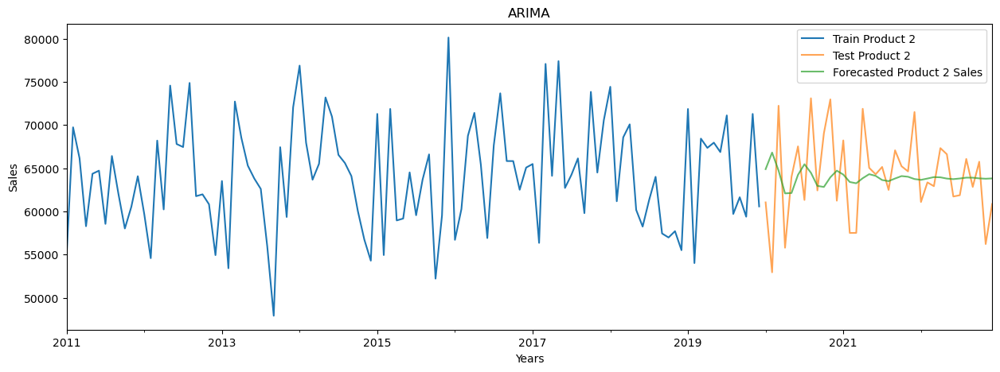

In [156]:
axis = train['Q-P2'].plot(label='Train Product 2', figsize=(15, 5))
testCopy1_ARIMA['Q-P2'].plot(ax=axis, label='Test Product 2', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_QP2_ARIMA'].plot(ax=axis, label='Forecasted Product 2 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

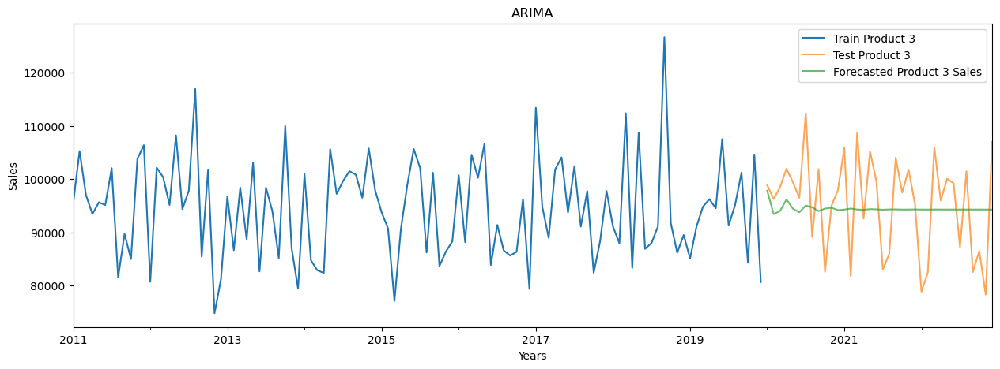

In [157]:
axis = train['Q-P3'].plot(label='Train Product 3', figsize=(15, 5))
testCopy1_ARIMA['Q-P3'].plot(ax=axis, label='Test Product 3', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_QP3_ARIMA'].plot(ax=axis, label='Forecasted Product 3 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

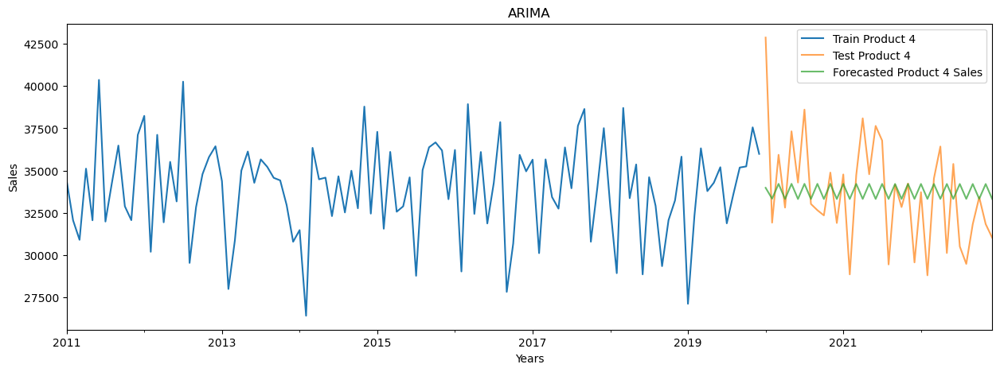

In [158]:
axis = train['Q-P4'].plot(label='Train Product 4', figsize=(15, 5))
testCopy1_ARIMA['Q-P4'].plot(ax=axis, label='Test Product 4', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_QP4_ARIMA'].plot(ax=axis, label='Forecasted Product 4 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

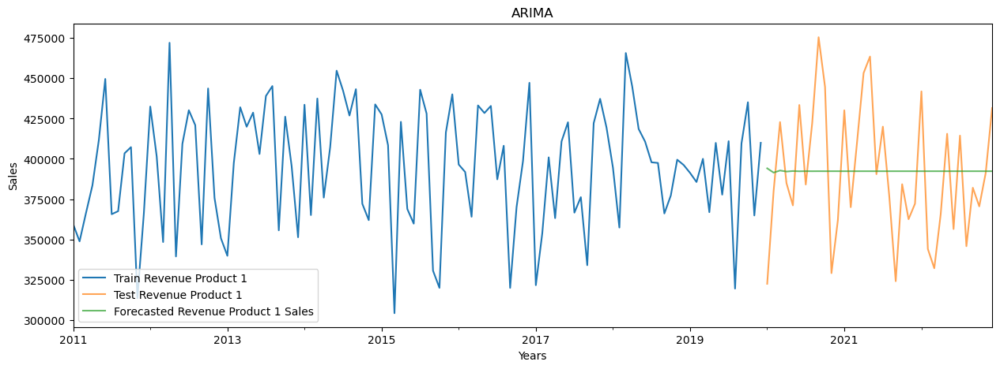

In [159]:
axis = train['S-P1'].plot(label='Train Revenue Product 1', figsize=(15, 5))
testCopy1_ARIMA['S-P1'].plot(ax=axis, label='Test Revenue Product 1', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_SP1_ARIMA'].plot(ax=axis, label='Forecasted Revenue Product 1 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

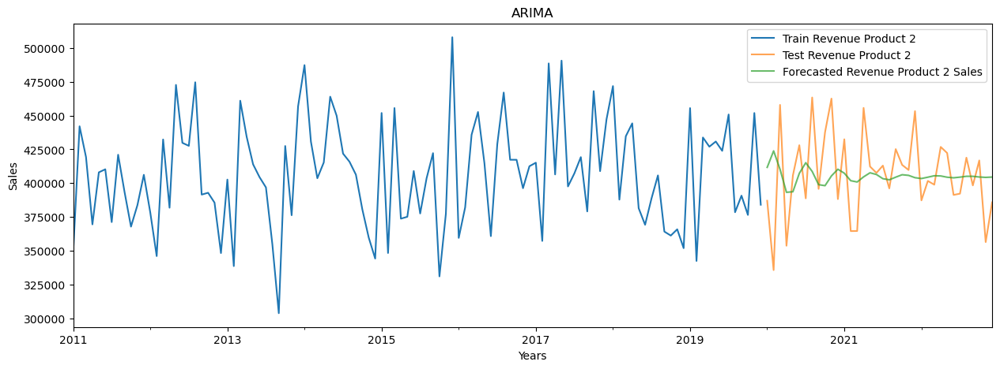

In [160]:
axis = train['S-P2'].plot(label='Train Revenue Product 2', figsize=(15, 5))
testCopy1_ARIMA['S-P2'].plot(ax=axis, label='Test Revenue Product 2', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_SP2_ARIMA'].plot(ax=axis, label='Forecasted Revenue Product 2 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

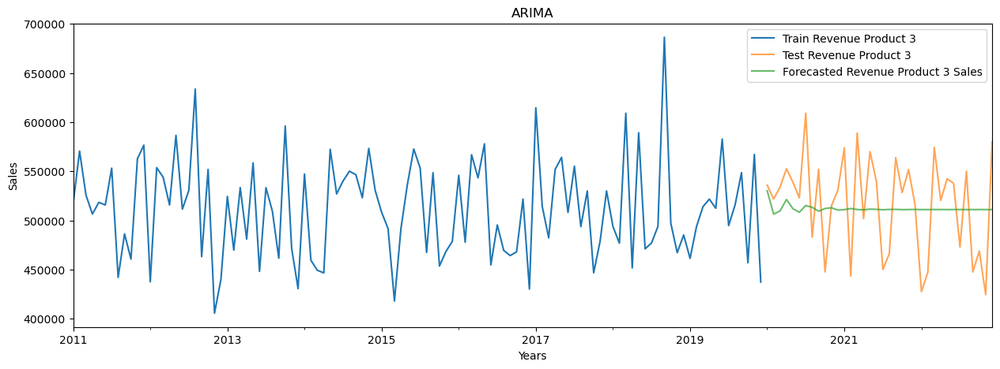

In [161]:
axis = train['S-P3'].plot(label='Train Revenue Product 3', figsize=(15, 5))
testCopy1_ARIMA['S-P3'].plot(ax=axis, label='Test Revenue Product 3', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_SP3_ARIMA'].plot(ax=axis, label='Forecasted Revenue Product 3 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

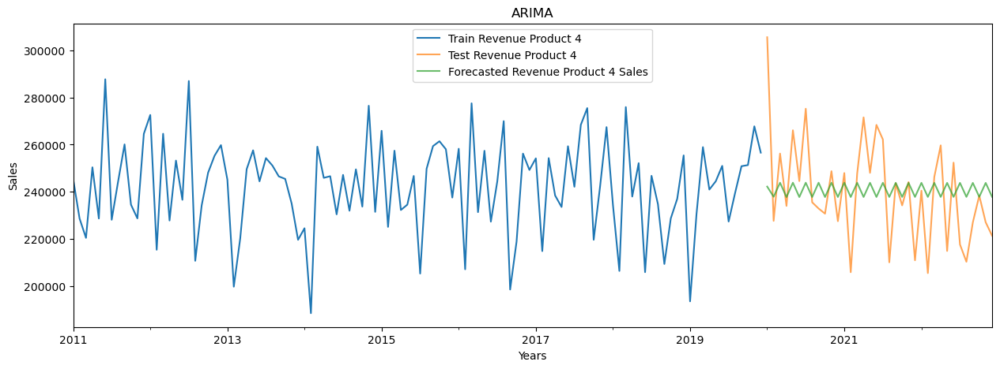

In [162]:
axis = train['S-P4'].plot(label='Train Revenue Product 4', figsize=(15, 5))
testCopy1_ARIMA['S-P4'].plot(ax=axis, label='Test Revenue Product 4', alpha=0.7)
testCopy1_ARIMA['sales_ts_forecasted_SP4_ARIMA'].plot(ax=axis, label='Forecasted Revenue Product 4 Sales', alpha=0.7)
axis.set_title('ARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [163]:
resultsDf_ARIMA1 = pd.DataFrame({'RMSE': rmse_ARIMA1}
                           ,index=['Best ARIMA Model Product 2 : ARMA(2, 0, 2)'])
resultsDf_ARIMA1
pd.concat([resultsDf_AR1, resultsDf_ARMA1, resultsDf_ARIMA1])

,RMSE
"Best AR Model Product 2 : AR(1,0,0)",4831.925740
"Best ARMA Model Product 2 : ARMA(2, 0, 2)",4930.656694
"Best ARIMA Model Product 2 : ARMA(2, 0, 2)",4930.656694


In [164]:
resultsDf_ARIMA2 = pd.DataFrame({'RMSE': rmse_ARIMA2}
                           ,index=['Best ARIMA Model Product 3 : ARMA(3, 0, 3)'])
resultsDf_ARIMA2
pd.concat([resultsDf_AR2, resultsDf_ARMA2, resultsDf_ARIMA2])

,RMSE
"Best AR Model Product 3 : AR(1,0,0)",9097.457688
"Best ARMA Model Product 3 : ARMA(3, 0, 3)",9034.622200
"Best ARIMA Model Product 3 : ARMA(3, 0, 3)",9034.622200


In [165]:
resultsDf_ARIMA3 = pd.DataFrame({'RMSE': rmse_ARIMA3}
                           ,index=['Best ARIMA Model Product 4 : ARMA(2, 0, 1)'])
resultsDf_ARIMA3
pd.concat([resultsDf_AR3, resultsDf_ARMA3, resultsDf_ARIMA3])

,RMSE
"Best AR Model Product 4 : AR(1,0,0)",3080.921856
"Best ARMA Model Product 4 : ARMA(1, 0, 1)",3061.521141
"Best ARIMA Model Product 4 : ARMA(2, 0, 1)",2954.061145


In [166]:
resultsDf_ARIMA4 = pd.DataFrame({'RMSE': rmse_ARIMA4}
                           ,index=['Best ARIMA Model Revenue Product 1 : ARMA(1, 0, 1)'])
resultsDf_ARIMA4
pd.concat([resultsDf_AR4, resultsDf_ARMA4, resultsDf_ARIMA1])

,RMSE
"Best AR Model Revenue Product 1 : AR(2,0,0)",40176.861072
"Best ARMA Model Revenue Product 1 : ARMA(1, 0, 1)",40052.637944
"Best ARIMA Model Product 2 : ARMA(2, 0, 2)",4930.656694


In [167]:
resultsDf_ARIMA5 = pd.DataFrame({'RMSE': rmse_ARIMA5}
                           ,index=['Best ARIMA Model Revenue Product 2 : ARMA(2, 0, 2)'])
resultsDf_ARIMA5
pd.concat([resultsDf_AR5, resultsDf_ARMA5, resultsDf_ARIMA5])

,RMSE
"Best AR Model Revenue Product 2 : AR(1,0,0)",30634.409195
"Best ARMA Model Revenue Product 2 : ARMA(2, 0, 2)",31293.444292
"Best ARIMA Model Revenue Product 2 : ARMA(2, 0, 2)",31293.444292


In [168]:
resultsDf_ARIMA6 = pd.DataFrame({'RMSE': rmse_ARIMA6}
                           ,index=['Best ARIMA Model Revenue Product 3 : ARMA(3, 0, 3)'])
resultsDf_ARIMA6
pd.concat([resultsDf_AR6, resultsDf_ARMA6, resultsDf_ARIMA6])

,RMSE
"Best AR Model Revenue Product 3 : AR(1,0,0)",49308.220668
"Best ARMA Model Revenue Product 3 : ARMA(3, 0, 3)",48968.143077
"Best ARIMA Model Revenue Product 3 : ARMA(3, 0, 3)",48968.143077


In [169]:
resultsDf_ARIMA7 = pd.DataFrame({'RMSE': rmse_ARIMA7}
                           ,index=['Best ARIMA Model Revenue Product 4 : ARMA(2, 0, 1)'])
resultsDf_ARIMA7
pd.concat([resultsDf_AR7, resultsDf_ARMA7, resultsDf_ARIMA7])

,RMSE
"Best AR Model Revenue Product 4 : AR(1,0,0)",21966.972834
"Best ARMA Model Revenue Product 4 : ARMA(2, 0, 1)",21090.605765
"Best ARIMA Model Revenue Product 4 : ARMA(2, 0, 1)",21090.605765


### SARIMA Model

- The ARIMA models can be extended/improved to handle seasonal components of a data series
- The seasonal autoregressive moving average model is given by

SARIMA(p, d, q)(P, D, Q)m
    non-seasonal seasonal

- The above model consists of:
- Autoregressive and moving average components (p, q)
- Seasonal autoregressive and moving average components (P, Q)
- The ordinary and seasonal difference components of order ‘d’ and ‘D’
- Seasonal frequency ‘F’
- The value for the parameters (p,d,q) and (P, D, Q) can be decided by comparing different values for each and taking the lowest AIC value for the model build.
- The value for F can be consolidated by ACF plot

Finding Seasonality = 12 from ACF/PACF plots 

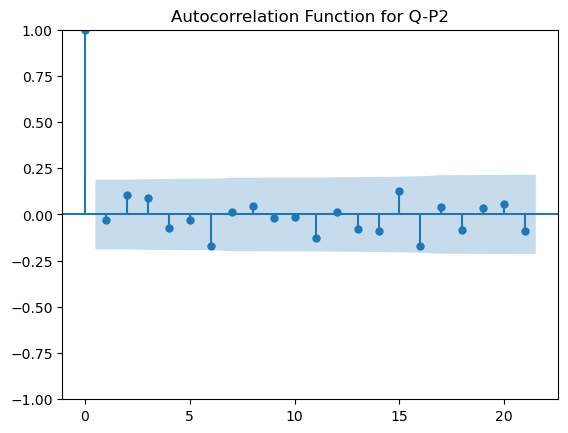

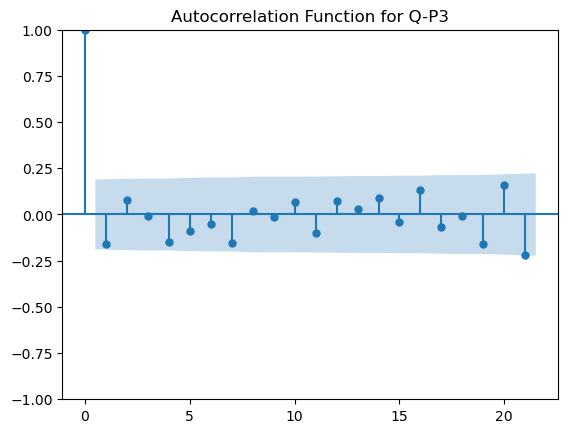

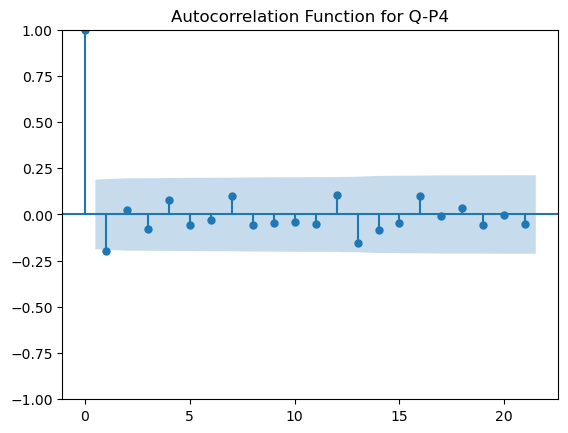

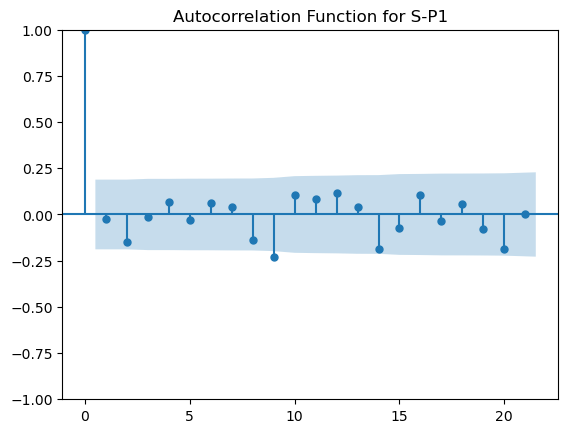

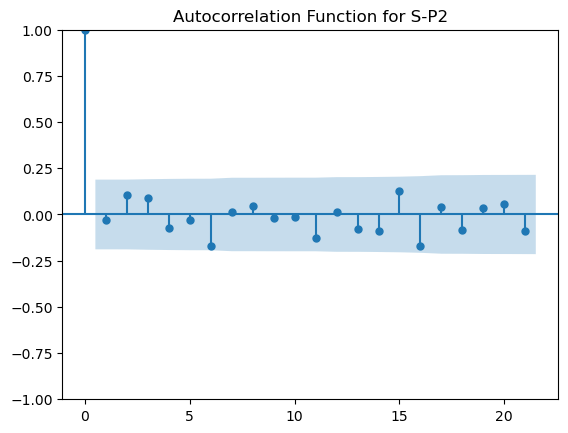

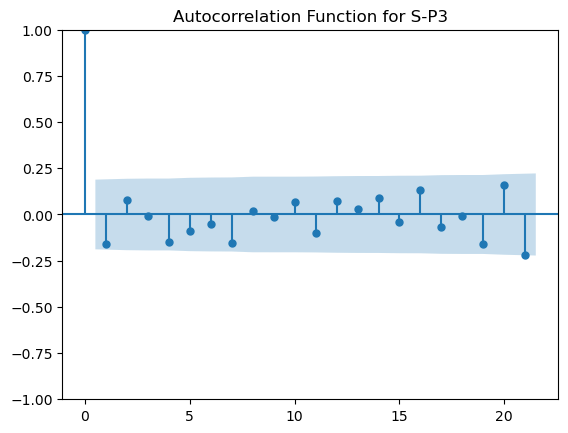

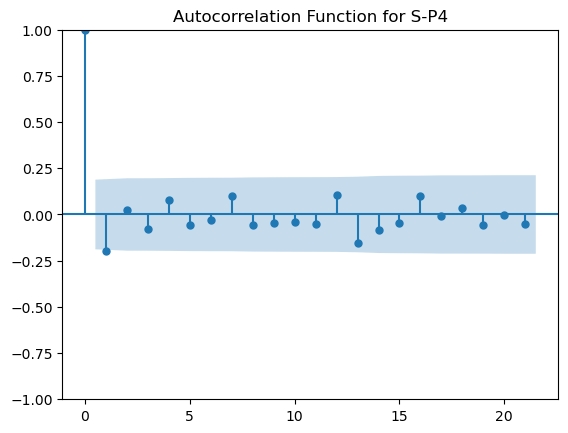

In [170]:
# plt.figure(figsize=(15, 4))
plot_acf(train['Q-P2'],alpha=0.05)
plt.title('Autocorrelation Function for Q-P2')
plt.show()
plot_acf(train['Q-P3'],alpha=0.05)
plt.title('Autocorrelation Function for Q-P3')
plt.show()
plot_acf(train['Q-P4'],alpha=0.05)
plt.title('Autocorrelation Function for Q-P4')
plt.show()
plot_acf(train['S-P1'],alpha=0.05)
plt.title('Autocorrelation Function for S-P1')
plt.show()
plot_acf(train['S-P2'],alpha=0.05)
plt.title('Autocorrelation Function for S-P2')
plt.show()
plot_acf(train['S-P3'],alpha=0.05)
plt.title('Autocorrelation Function for S-P3')
plt.show()
plot_acf(train['S-P4'],alpha=0.05)
plt.title('Autocorrelation Function for S-P4')
plt.show()

#### SARIMA Model building to estimate best parameters 

In [171]:
best_aic_0 = np.inf
best_pdq_0 = None
best_seasonal_pdq_0 = None
temp_model_0 = None

In [172]:
SARIMA_AIC_1 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_1
SARIMA_AIC_2 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_2
SARIMA_AIC_3 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_3
SARIMA_AIC_4 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_4
SARIMA_AIC_5 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_5
SARIMA_AIC_6 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_6
SARIMA_AIC_7 = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC_7

,param,seasonal,AIC


In [173]:
SARIMA_AIC_1 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_1 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[1],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_1 = SARIMA_model_1.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_1.aic))
SARIMA_AIC_1.loc[len(SARIMA_AIC_1)] = [param, param_seasonal, results_SARIMA_1.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:2929.999533753914


In [174]:
SARIMA_AIC_2 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_2 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[2],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_2 = SARIMA_model_2.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_2.aic))
SARIMA_AIC_2.loc[len(SARIMA_AIC_2)] = [param, param_seasonal, results_SARIMA_2.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:4228.792867452232


In [175]:
SARIMA_AIC_3 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_3 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[3],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_3 = SARIMA_model_3.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_3.aic))
SARIMA_AIC_3.loc[len(SARIMA_AIC_3)] = [param, param_seasonal, results_SARIMA_3.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3537.045341586191


In [176]:
SARIMA_AIC_4 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_4 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[4],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_4 = SARIMA_model_4.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_4.aic))
SARIMA_AIC_4.loc[len(SARIMA_AIC_4)] = [param, param_seasonal, results_SARIMA_4.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3844.4894724031565


In [177]:
SARIMA_AIC_5 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_5 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[5],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_5 = SARIMA_model_5.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_5.aic))
SARIMA_AIC_5.loc[len(SARIMA_AIC_5)] = [param, param_seasonal, results_SARIMA_5.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:26.0


In [178]:
SARIMA_AIC_6 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_6 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[6],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_6 = SARIMA_model_6.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_6.aic))
SARIMA_AIC_6.loc[len(SARIMA_AIC_6)] = [param, param_seasonal, results_SARIMA_6.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3433.4178696772146


In [179]:
SARIMA_AIC_7 = pd.DataFrame(columns=['param', 'seasonal', 'AIC'])

for param in pdq:
    for param_seasonal in seasonal_pdq:
        SARIMA_model_7 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[7],
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

results_SARIMA_7 = SARIMA_model_7.fit(maxiter=1000)
print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA_7.aic))
SARIMA_AIC_7.loc[len(SARIMA_AIC_4)] = [param, param_seasonal, results_SARIMA_7.aic]

SARIMA(3, 1, 3)x(3, 1, 3, 12) - AIC:3549.082075008426


#### Conclusion:
SARIMA(3, 1, 3)x(3, 1, 3, 12) is the best model for all features.

Inference * Criteria to choose the best fit model is the lowest/minimum AIC value
For ARIMA(p, d, q) × (P, D, Q)S,
we got SARIMAX(3, 1, 3)x(3, 1, 3, 12)model with the least AIC of 3984.33757
Here,
- p = non-seasonal AR order = 3,
- d = non-seasonal differencing = 0,
- q = non-seasonal MA order = 3,
- P = seasonal AR order = 3,
- D = seasonal differencing = 1,
- Q = seasonal MA order = 3,
- S = time span of repeating seasonal pattern = 12
Building SARIMA model with the best parameters

In [180]:
best_model_SARIMA_1 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[1],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_1 = best_model_SARIMA_1.fit()
print(best_results_SARIMA_1.summary().tables[0])
print(best_results_SARIMA_1.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               Q-P2   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 227.823
Date:                            Sun, 07 Apr 2024   AIC                           -429.647
Time:                                    04:29:23   BIC                           -392.269
Sample:                                01-01-2011   HQIC                          -414.458
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8591      0.593     -1.449      0.147      -2.021       0.303
ar.L2         -0.2113      0.570   

In [181]:
best_model_SARIMA_2 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[2],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_2 = best_model_SARIMA_2.fit()
print(best_results_SARIMA_2.summary().tables[0])
print(best_results_SARIMA_2.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               Q-P3   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 215.007
Date:                            Sun, 07 Apr 2024   AIC                           -404.014
Time:                                    04:29:27   BIC                           -366.637
Sample:                                01-01-2011   HQIC                          -388.826
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3008      0.524     -2.482      0.013      -2.328      -0.274
ar.L2         -1.0420      0.556   

In [182]:
best_model_SARIMA_3 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[3],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_3 = best_model_SARIMA_3.fit()
print(best_results_SARIMA_3.summary().tables[0])
print(best_results_SARIMA_3.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               Q-P4   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 241.686
Date:                            Sun, 07 Apr 2024   AIC                           -457.373
Time:                                    04:29:31   BIC                           -419.995
Sample:                                01-01-2011   HQIC                          -442.185
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1887      0.823     -1.444      0.149      -2.802       0.424
ar.L2         -0.7623      0.750   

In [183]:
best_model_SARIMA_4 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[4],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_4 = best_model_SARIMA_4.fit()
print(best_results_SARIMA_4.summary().tables[0])
print(best_results_SARIMA_4.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               S-P1   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 212.093
Date:                            Sun, 07 Apr 2024   AIC                           -398.186
Time:                                    04:29:35   BIC                           -360.809
Sample:                                01-01-2011   HQIC                          -382.998
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3175      0.126     -2.527      0.011      -0.564      -0.071
ar.L2         -0.9933      0.051   

In [184]:
best_model_SARIMA_5 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[5],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_5 = best_model_SARIMA_5.fit()
print(best_results_SARIMA_5.summary().tables[0])
print(best_results_SARIMA_5.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               S-P2   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 226.541
Date:                            Sun, 07 Apr 2024   AIC                           -427.082
Time:                                    04:29:39   BIC                           -389.705
Sample:                                01-01-2011   HQIC                          -411.894
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7692      0.536     -1.435      0.151      -1.819       0.281
ar.L2         -0.0494      0.493   

In [185]:
best_model_SARIMA_6 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[6],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_6 = best_model_SARIMA_6.fit()
print(best_results_SARIMA_6.summary().tables[0])
print(best_results_SARIMA_6.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               S-P3   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 214.570
Date:                            Sun, 07 Apr 2024   AIC                           -403.139
Time:                                    04:29:43   BIC                           -365.762
Sample:                                01-01-2011   HQIC                          -387.951
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2632      0.498     -2.535      0.011      -2.240      -0.287
ar.L2         -0.9926      0.508   

In [186]:
best_model_SARIMA_7 = sm.tsa.statespace.SARIMAX(log_transformed_series_list[7],
                                      order=(3, 1, 3),
                                      seasonal_order=(3, 1, 3, 12),
                                      enforce_stationarity=True)
best_results_SARIMA_7 = best_model_SARIMA_7.fit()
print(best_results_SARIMA_7.summary().tables[0])
print(best_results_SARIMA_7.summary().tables[1])

                                     SARIMAX Results                                      
Dep. Variable:                               S-P4   No. Observations:                  144
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood                 241.668
Date:                            Sun, 07 Apr 2024   AIC                           -457.335
Time:                                    04:29:47   BIC                           -419.958
Sample:                                01-01-2011   HQIC                          -442.147
                                     - 12-01-2022                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1874      0.834     -1.424      0.154      -2.821       0.446
ar.L2         -0.7717      0.797   

In [187]:
pred_dynamic_SARIMA_1 = best_results_SARIMA_1.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_1 = best_results_SARIMA_1.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_1 = pred_dynamic_SARIMA_1.predicted_mean
testCopy_SARIMA = test.copy()
testCopy_SARIMA['sales_ts_forecasted_QP2_SARIMA'] = np.power(10, pred_dynamic_SARIMA_1.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_2 = best_results_SARIMA_2.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_2 = best_results_SARIMA_2.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_2 = pred_dynamic_SARIMA_2.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_QP3_SARIMA'] = np.power(10, pred_dynamic_SARIMA_2.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_3 = best_results_SARIMA_3.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_3 = best_results_SARIMA_3.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_3 = pred_dynamic_SARIMA_3.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_QP4_SARIMA'] = np.power(10, pred_dynamic_SARIMA_3.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_4 = best_results_SARIMA_4.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_4 = best_results_SARIMA_4.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_4 = pred_dynamic_SARIMA_4.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_SP1_SARIMA'] = np.power(10, pred_dynamic_SARIMA_4.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_5 = best_results_SARIMA_5.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_5 = best_results_SARIMA_5.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_5 = pred_dynamic_SARIMA_5.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_SP2_SARIMA'] = np.power(10, pred_dynamic_SARIMA_5.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_6 = best_results_SARIMA_6.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_6 = best_results_SARIMA_6.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_6 = pred_dynamic_SARIMA_6.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_SP3_SARIMA'] = np.power(10, pred_dynamic_SARIMA_6.predicted_mean)
testCopy_SARIMA

pred_dynamic_SARIMA_7 = best_results_SARIMA_7.get_prediction(start=pd.to_datetime('2020-01-01'), dynamic=True, full_results=True)
pred99_SARIMA_7 = best_results_SARIMA_7.get_forecast(steps=len(test), alpha=0.1)
# Extract the predicted and true values of our time series
sales_ts_forecasted_SARIMA_7 = pred_dynamic_SARIMA_7.predicted_mean
testCopy_SARIMA['sales_ts_forecasted_SP4_SARIMA'] = np.power(10, pred_dynamic_SARIMA_7.predicted_mean)
testCopy_SARIMA.head()

,Q-P1,Q-P2,Q-P3,Q-P4,S-P1,S-P2,S-P3,S-P4,sales_ts_forecasted_QP2_SARIMA,sales_ts_forecasted_QP3_SARIMA,sales_ts_forecasted_QP4_SARIMA,sales_ts_forecasted_SP1_SARIMA,sales_ts_forecasted_SP2_SARIMA,sales_ts_forecasted_SP3_SARIMA,sales_ts_forecasted_SP4_SARIMA
Year_Month,,,,,,,,,,,,,,,
2020-01-01,101704,61046,98885,42868,322401.68,387031.64,535956.70,305648.84,64112.844463,98702.878360,33919.654446,382076.565599,412017.975628,534747.429866,241203.259530
2020-02-01,119893,52954,96262,31924,380060.81,335728.36,521740.04,227618.12,60717.043850,93757.992342,29384.271444,380799.040890,392096.696967,508139.331496,209287.904447
2020-03-01,133386,72228,98494,35935,422833.62,457925.52,533837.48,256216.55,68564.276607,89194.112469,35967.671188,389160.293035,429578.869922,490344.114554,255885.128921
2020-04-01,121429,55796,101958,32816,384929.93,353746.64,552612.36,233978.08,67196.301041,95991.450609,33140.618753,384484.877270,435293.391924,516284.058321,236756.290042
2020-05-01,117066,64001,99438,37323,371099.22,405766.34,538953.96,266112.99,65682.637994,101423.736298,34744.056838,398837.124504,426758.960295,555332.061324,247578.085082


In [188]:
# Compute the root mean square error
mse_SARIMA_1 = ((testCopy_SARIMA['Q-P2'] - testCopy_SARIMA['sales_ts_forecasted_QP2_SARIMA']) ** 2).mean()
rmse_SARIMA_1 = np.sqrt(mse_SARIMA_1)
print('The Root Mean Squared Error of our forecasts SARIMA Q-P2 is {}'.format(round(rmse_SARIMA_1, 3)))

# Compute the root mean square error
mse_SARIMA_2 = ((testCopy_SARIMA['Q-P3'] - testCopy_SARIMA['sales_ts_forecasted_QP3_SARIMA']) ** 2).mean()
rmse_SARIMA_2 = np.sqrt(mse_SARIMA_2)
print('The Root Mean Squared Error of our forecasts SARIMA Q-P3 is {}'.format(round(rmse_SARIMA_2, 3)))

# Compute the root mean square error
mse_SARIMA_3 = ((testCopy_SARIMA['Q-P4'] - testCopy_SARIMA['sales_ts_forecasted_QP4_SARIMA']) ** 2).mean()
rmse_SARIMA_3 = np.sqrt(mse_SARIMA_3)
print('The Root Mean Squared Error of our forecasts SARIMA Q-P4 is {}'.format(round(rmse_SARIMA_3, 3)))

# Compute the root mean square error
mse_SARIMA_4 = ((testCopy_SARIMA['S-P1'] - testCopy_SARIMA['sales_ts_forecasted_SP1_SARIMA']) ** 2).mean()
rmse_SARIMA_4 = np.sqrt(mse_SARIMA_4)
print('The Root Mean Squared Error of our forecasts SARIMA S-P1 is {}'.format(round(rmse_SARIMA_4, 3)))

# Compute the root mean square error
mse_SARIMA_5 = ((testCopy_SARIMA['S-P2'] - testCopy_SARIMA['sales_ts_forecasted_SP2_SARIMA']) ** 2).mean()
rmse_SARIMA_5 = np.sqrt(mse_SARIMA_5)
print('The Root Mean Squared Error of our forecasts SARIMA S-P2 is {}'.format(round(rmse_SARIMA_5, 3)))

# Compute the root mean square error
mse_SARIMA_6 = ((testCopy_SARIMA['S-P3'] - testCopy_SARIMA['sales_ts_forecasted_SP3_SARIMA']) ** 2).mean()
rmse_SARIMA_6 = np.sqrt(mse_SARIMA_6)
print('The Root Mean Squared Error of our forecasts SARIMA S-P3 is {}'.format(round(rmse_SARIMA_6, 3)))

# Compute the root mean square error
mse_SARIMA_7 = ((testCopy_SARIMA['S-P4'] - testCopy_SARIMA['sales_ts_forecasted_SP4_SARIMA']) ** 2).mean()
rmse_SARIMA_7 = np.sqrt(mse_SARIMA_7)
print('The Root Mean Squared Error of our forecasts SARIMA S-P4 is {}'.format(round(rmse_SARIMA_7, 3)))

The Root Mean Squared Error of our forecasts SARIMA Q-P2 is 5529.36
The Root Mean Squared Error of our forecasts SARIMA Q-P3 is 8739.051
The Root Mean Squared Error of our forecasts SARIMA Q-P4 is 2920.619
The Root Mean Squared Error of our forecasts SARIMA S-P1 is 37954.148
The Root Mean Squared Error of our forecasts SARIMA S-P2 is 34607.295
The Root Mean Squared Error of our forecasts SARIMA S-P3 is 48102.762
The Root Mean Squared Error of our forecasts SARIMA S-P4 is 20879.88


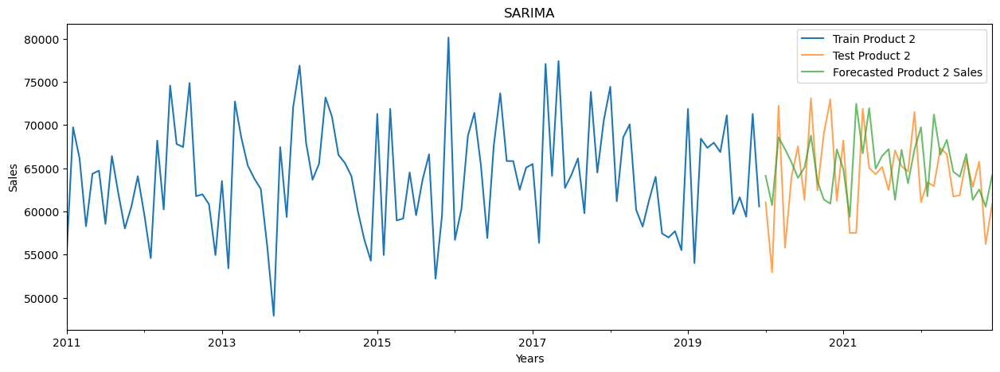

In [189]:
axis = train['Q-P2'].plot(label='Train Product 2', figsize=(15, 5))
testCopy_SARIMA['Q-P2'].plot(ax=axis, label='Test Product 2', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_QP2_SARIMA'].plot(ax=axis, label='Forecasted Product 2 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

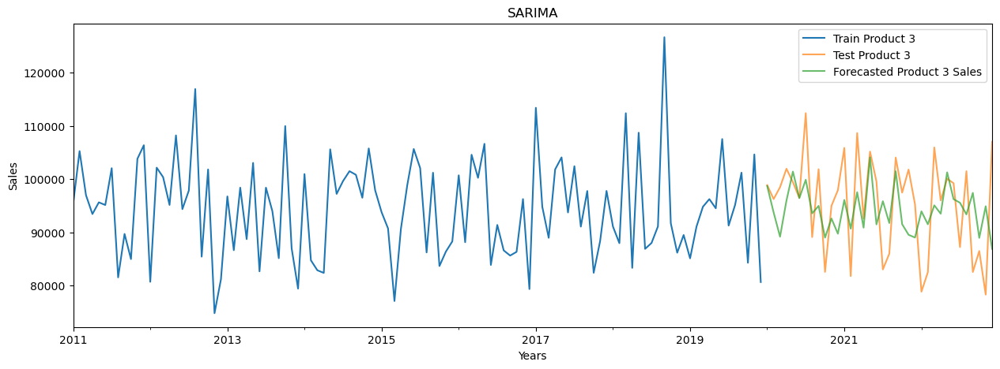

In [190]:
axis = train['Q-P3'].plot(label='Train Product 3', figsize=(15, 5))
testCopy_SARIMA['Q-P3'].plot(ax=axis, label='Test Product 3', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_QP3_SARIMA'].plot(ax=axis, label='Forecasted Product 3 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

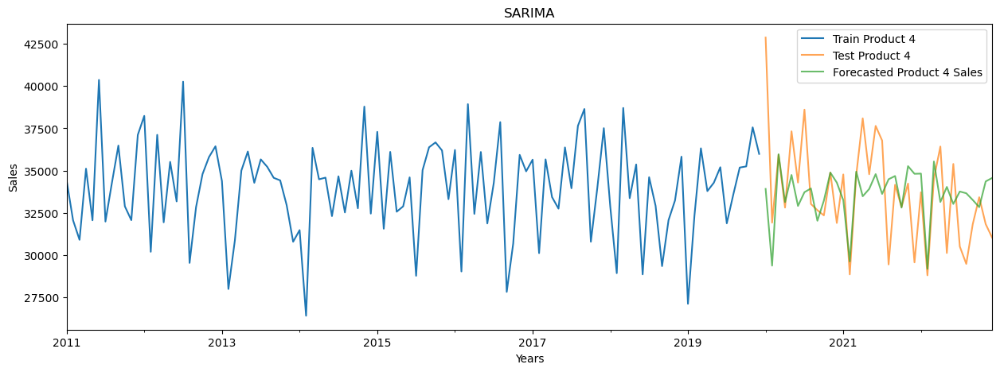

In [191]:
axis = train['Q-P4'].plot(label='Train Product 4', figsize=(15, 5))
testCopy_SARIMA['Q-P4'].plot(ax=axis, label='Test Product 4', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_QP4_SARIMA'].plot(ax=axis, label='Forecasted Product 4 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

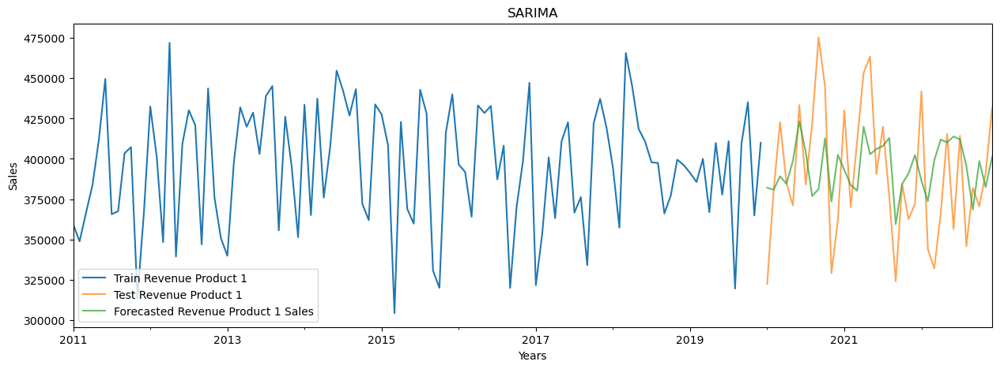

In [192]:
axis = train['S-P1'].plot(label='Train Revenue Product 1', figsize=(15, 5))
testCopy_SARIMA['S-P1'].plot(ax=axis, label='Test Revenue Product 1', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_SP1_SARIMA'].plot(ax=axis, label='Forecasted Revenue Product 1 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

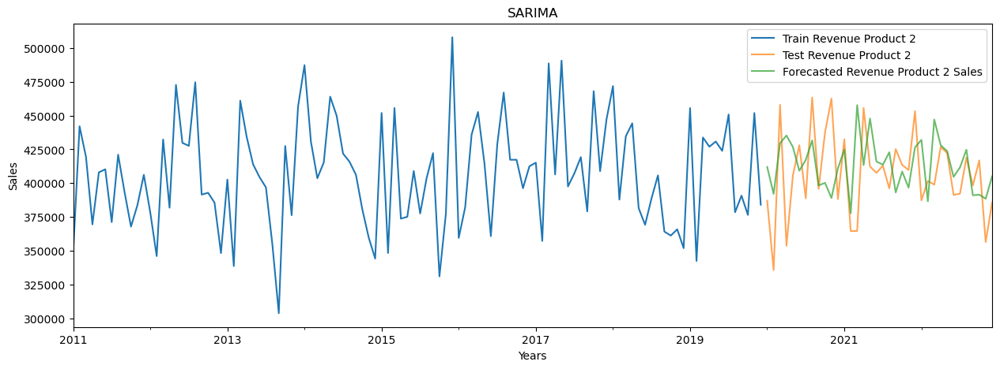

In [193]:
axis = train['S-P2'].plot(label='Train Revenue Product 2', figsize=(15, 5))
testCopy_SARIMA['S-P2'].plot(ax=axis, label='Test Revenue Product 2', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_SP2_SARIMA'].plot(ax=axis, label='Forecasted Revenue Product 2 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

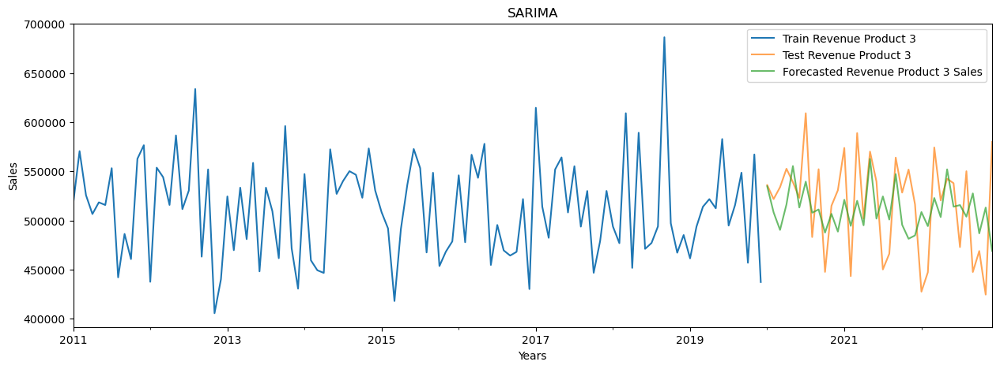

In [194]:
axis = train['S-P3'].plot(label='Train Revenue Product 3', figsize=(15, 5))
testCopy_SARIMA['S-P3'].plot(ax=axis, label='Test Revenue Product 3', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_SP3_SARIMA'].plot(ax=axis, label='Forecasted Revenue Product 3 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

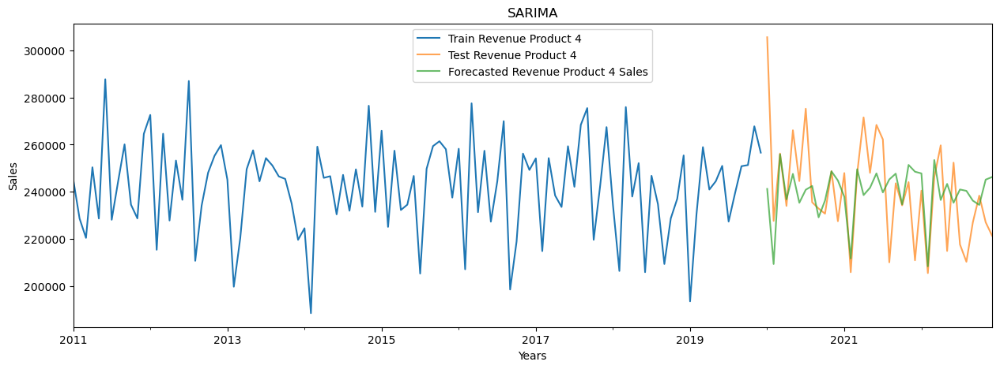

In [195]:
axis = train['S-P4'].plot(label='Train Revenue Product 4', figsize=(15, 5))
testCopy_SARIMA['S-P4'].plot(ax=axis, label='Test Revenue Product 4', alpha=0.7)
testCopy_SARIMA['sales_ts_forecasted_SP4_SARIMA'].plot(ax=axis, label='Forecasted Revenue Product 4 Sales', alpha=0.7)
axis.set_title('SARIMA')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()
plt.close()

In [196]:
resultsDf_SARIMA1 = pd.DataFrame({'RMSE': rmse_SARIMA_1}
                           ,index=['Best SARIMA Model product 2 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product2 = pd.concat([resultsDf_AR1, resultsDf_ARMA1, resultsDf_ARIMA1, resultsDf_SARIMA1])
model_product2

,RMSE
"Best AR Model Product 2 : AR(1,0,0)",4831.925740
"Best ARMA Model Product 2 : ARMA(2, 0, 2)",4930.656694
"Best ARIMA Model Product 2 : ARMA(2, 0, 2)",4930.656694
"Best SARIMA Model product 2 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",5529.360298


#### Conclusion:
The best model for product 2 is AR(1,0,0) that its RMSE is 4831.925740.

In [197]:
resultsDf_SARIMA2 = pd.DataFrame({'RMSE': rmse_SARIMA_2}
                           ,index=['Best SARIMA Model product 3 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product3 = pd.concat([resultsDf_AR2, resultsDf_ARMA2, resultsDf_ARIMA2, resultsDf_SARIMA2])
model_product3

,RMSE
"Best AR Model Product 3 : AR(1,0,0)",9097.457688
"Best ARMA Model Product 3 : ARMA(3, 0, 3)",9034.622200
"Best ARIMA Model Product 3 : ARMA(3, 0, 3)",9034.622200
"Best SARIMA Model product 3 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",8739.050509


#### Conclusion:
The best model for product 3 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 8739.050509.

In [198]:
resultsDf_SARIMA3 = pd.DataFrame({'RMSE': rmse_SARIMA_3}
                           ,index=['Best SARIMA Model product 4 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product4 = pd.concat([resultsDf_AR3, resultsDf_ARMA3, resultsDf_ARIMA3, resultsDf_SARIMA3])
model_product4

,RMSE
"Best AR Model Product 4 : AR(1,0,0)",3080.921856
"Best ARMA Model Product 4 : ARMA(1, 0, 1)",3061.521141
"Best ARIMA Model Product 4 : ARMA(2, 0, 1)",2954.061145
"Best SARIMA Model product 4 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",2920.618921


#### Conclusion:
The best model for product 4 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 2920.618921.

In [199]:
resultsDf_SARIMA4 = pd.DataFrame({'RMSE': rmse_SARIMA_4}
                           ,index=['Best SARIMA Model Revenue product 1 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product5 = pd.concat([resultsDf_AR4, resultsDf_ARMA4, resultsDf_ARIMA4, resultsDf_SARIMA4])
model_product5

,RMSE
"Best AR Model Revenue Product 1 : AR(2,0,0)",40176.861072
"Best ARMA Model Revenue Product 1 : ARMA(1, 0, 1)",40052.637944
"Best ARIMA Model Revenue Product 1 : ARMA(1, 0, 1)",40052.637944
"Best SARIMA Model Revenue product 1 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",37954.147761


#### Conclusion:
The best model for Revenue product 1 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 37954.147761.

In [200]:
resultsDf_SARIMA5 = pd.DataFrame({'RMSE': rmse_SARIMA_5}
                           ,index=['Best SARIMA Model Revenue product 2 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product6 = pd.concat([resultsDf_AR5, resultsDf_ARMA5, resultsDf_ARIMA5, resultsDf_SARIMA5])
model_product6

,RMSE
"Best AR Model Revenue Product 2 : AR(1,0,0)",30634.409195
"Best ARMA Model Revenue Product 2 : ARMA(2, 0, 2)",31293.444292
"Best ARIMA Model Revenue Product 2 : ARMA(2, 0, 2)",31293.444292
"Best SARIMA Model Revenue product 2 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",34607.294546


#### Conclusion:
The best model for Revenue product 2 is AR(1,0,0) that its RMSE is 30634.409195.

In [201]:
resultsDf_SARIMA6 = pd.DataFrame({'RMSE': rmse_SARIMA_6}
                           ,index=['Best SARIMA Model Revenue product 3 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product7 = pd.concat([resultsDf_AR6, resultsDf_ARMA6, resultsDf_ARIMA6, resultsDf_SARIMA6])
model_product7

,RMSE
"Best AR Model Revenue Product 3 : AR(1,0,0)",49308.220668
"Best ARMA Model Revenue Product 3 : ARMA(3, 0, 3)",48968.143077
"Best ARIMA Model Revenue Product 3 : ARMA(3, 0, 3)",48968.143077
"Best SARIMA Model Revenue product 3 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",48102.761913


#### Conclusion:
The best model for Revenue product 3 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 48102.761913.

In [202]:
resultsDf_SARIMA7 = pd.DataFrame({'RMSE': rmse_SARIMA_7}
                           ,index=['Best SARIMA Model Revenue product 4 : SARIMA(3, 1, 3)x(3, 1, 3, 12)'])

model_product8 = pd.concat([resultsDf_AR7, resultsDf_ARMA7, resultsDf_ARIMA7, resultsDf_SARIMA7])
model_product8

,RMSE
"Best AR Model Revenue Product 4 : AR(1,0,0)",21966.972834
"Best ARMA Model Revenue Product 4 : ARMA(2, 0, 1)",21090.605765
"Best ARIMA Model Revenue Product 4 : ARMA(2, 0, 1)",21090.605765
"Best SARIMA Model Revenue product 4 : SARIMA(3, 1, 3)x(3, 1, 3, 12)",20879.880150


#### Conclusion:
The best model for Revenue product 4 is SARIMAX(3, 1, 3)x(3, 1, 3, 12) that its RMSE is 20879.880150.

#### Forecast sales using the best fit SARIMA model as per RMSE

In [203]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_1.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_1.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,69596.392014,58722.196273,82484.274921,58722.196273,82484.274921
2020-02-01,58053.899098,48984.536073,68802.431760,48984.536073,68802.431760
2020-03-01,69752.253264,58825.468525,82708.679717,58825.468525,82708.679717
2020-04-01,66499.667577,56007.887953,78956.838928,56007.887953,78956.838928
2020-05-01,66294.825255,55808.533013,78751.467175,55808.533013,78751.467175


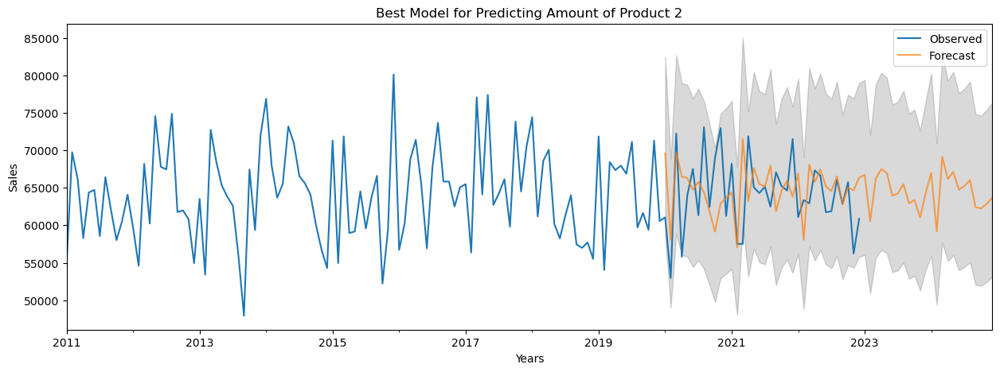

In [204]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['Q-P2']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Amount of Product 2')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [205]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_2.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_2.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,90428.561078,74355.682540,109975.786373,74355.682540,109975.786373
2020-02-01,92329.646573,75756.283388,112528.799658,75756.283388,112528.799658
2020-03-01,97545.054665,80004.626723,118931.092856,80004.626723,118931.092856
2020-04-01,95383.487887,78228.071312,116301.087436,78228.071312,116301.087436
2020-05-01,102295.505714,83897.426888,124728.145754,83897.426888,124728.145754


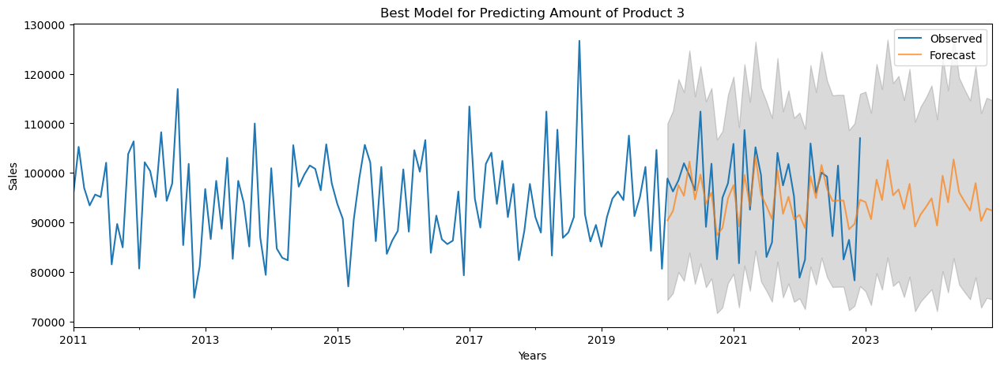

In [206]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['Q-P3']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Amount of Product 3')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [207]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_3.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_3.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,32004.658337,27322.793410,37488.778687,27322.793410,37488.778687
2020-02-01,28745.355336,24540.710867,33670.396016,24540.710867,33670.396016
2020-03-01,34335.486110,29294.563349,40243.836114,29294.563349,40243.836114
2020-04-01,33411.466041,28506.351026,39160.608876,28506.351026,39160.608876
2020-05-01,33028.886656,28151.546659,38751.240454,28151.546659,38751.240454


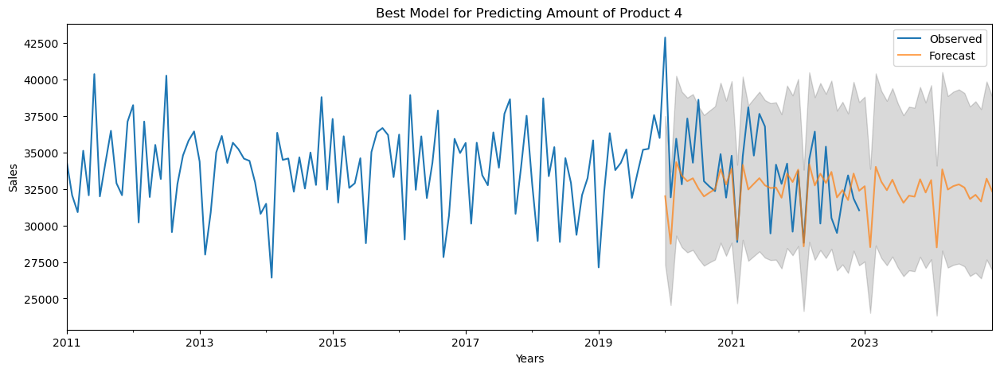

In [208]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['Q-P4']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Amount of Product 4')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [209]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_4.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_4.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,372794.348426,305666.716798,454663.915241,305666.716798,454663.915241
2020-02-01,368312.889421,301861.656426,449392.566516,301861.656426,449392.566516
2020-03-01,374315.574061,306746.268183,456768.878768,306746.268183,456768.878768
2020-04-01,378933.765172,310470.822774,462493.696201,310470.822774,462493.696201
2020-05-01,378574.667156,310050.515613,462243.316477,310050.515613,462243.316477


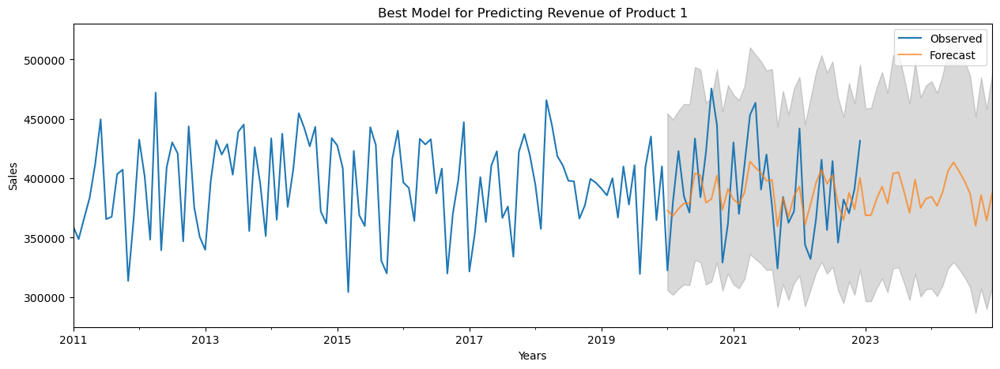

In [210]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['S-P1']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Revenue of Product 1')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [211]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_5.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_5.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,426632.611623,358584.991336,507593.428889,358584.991336,507593.428889
2020-02-01,361881.246831,304166.048499,430547.845345,304166.048499,430547.845345
2020-03-01,447259.863649,375345.646877,532952.459408,375345.646877,532952.459408
2020-04-01,415749.305518,348365.085331,496167.648013,348365.085331,496167.648013
2020-05-01,434479.336860,363971.118777,518646.355218,363971.118777,518646.355218


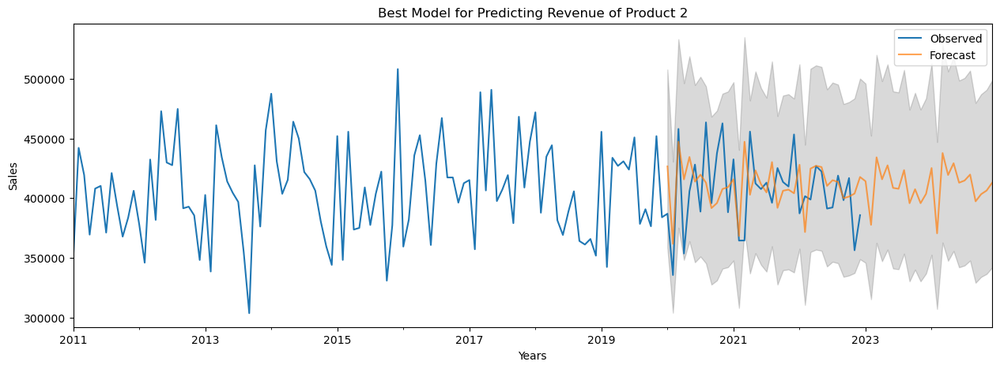

In [212]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['S-P2']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Revenue of Product 2')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [213]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_6.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_6.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,501141.852902,412147.075637,609353.242022,412147.075637,609353.242022
2020-02-01,502886.589098,413173.994115,612078.507109,413173.994115,612078.507109
2020-03-01,519473.566892,426698.171893,632420.770640,426698.171893,632420.770640
2020-04-01,518395.250348,425770.468132,631170.209533,425770.468132,631170.209533
2020-05-01,553477.447884,454589.195395,673877.180582,454589.195395,673877.180582


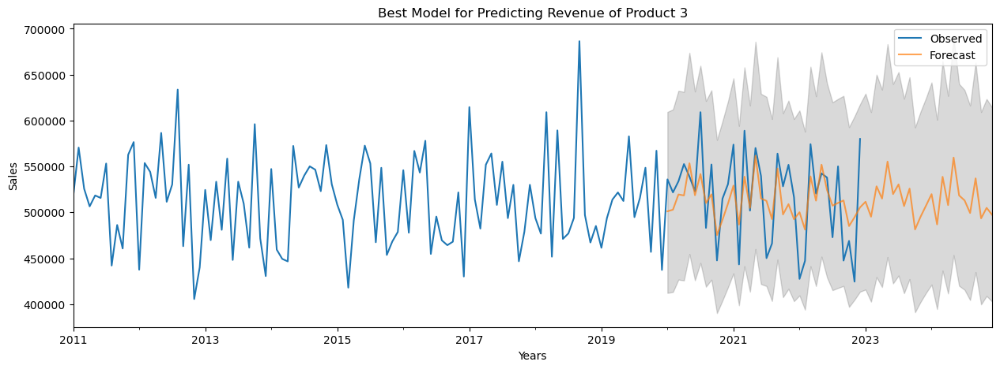

In [214]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['S-P3']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Revenue of Product 3')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

In [215]:
# Get forecast 36 steps (3 years) ahead in future
n_steps = 60
pred_uc_99 = best_results_SARIMA_7.get_forecast(steps=60, alpha=0.01) # alpha=0.01 signifies 99% confidence interval
pred_uc_95 = best_results_SARIMA_7.get_forecast(steps=60, alpha=0.05) # alpha=0.05 95% CI

# Get confidence intervals 95% & 99% of the forecasts
pred_ci_99 = pred_uc_99.conf_int()
pred_ci_95 = pred_uc_95.conf_int()

n_steps = 60
idx = pd.date_range(start='2020-01-01',end='2024-12-31',freq='MS')
fc_95 = pd.DataFrame(np.column_stack([np.power(10, pred_uc_95.predicted_mean), np.power(10, pred_ci_95)]),
                     index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
fc_99 = pd.DataFrame(np.column_stack([np.power(10, pred_ci_99)]),
                     index=idx, columns=['lower_ci_99', 'upper_ci_99'])
fc_all = fc_95.combine_first(fc_99)
fc_all = fc_all[['forecast', 'lower_ci_95', 'upper_ci_95', 'lower_ci_99', 'upper_ci_99']] # just reordering columns
fc_all.head()

,forecast,lower_ci_95,upper_ci_95,lower_ci_99,upper_ci_99
2020-01-01,228921.014082,195435.681182,268143.618256,195435.681182,268143.618256
2020-02-01,204683.170132,174746.125372,239748.950347,174746.125372,239748.950347
2020-03-01,244143.002974,208333.337429,286107.862702,208333.337429,286107.862702
2020-04-01,237889.861218,203000.499829,278775.599656,203000.499829,278775.599656
2020-05-01,235218.127268,200500.706984,275946.994041,200500.706984,275946.994041


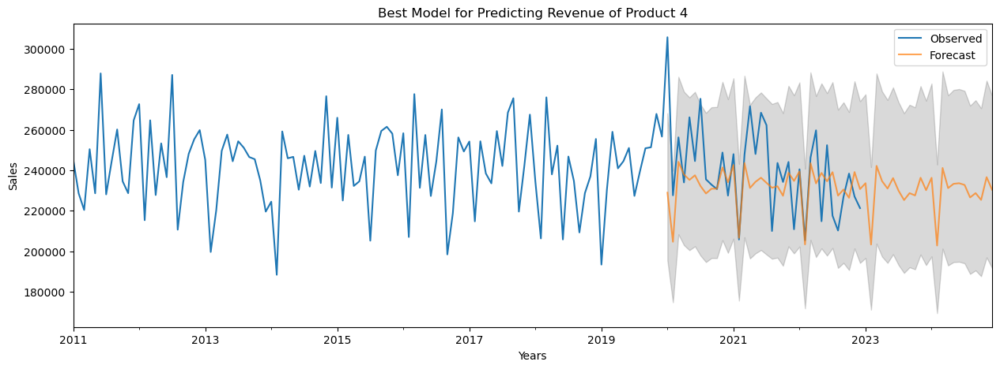

In [216]:
# plot the forecast along with the confidence band
sales_ts = file_sorted['S-P4']
axis = sales_ts.plot(label='Observed', figsize=(15, 5))
fc_all['forecast'].plot(ax=axis, label='Forecast', alpha=0.7)
axis.fill_between(fc_all.index, fc_all['lower_ci_95'], fc_all['upper_ci_95'], color='k', alpha=.15)
axis.set_title('Best Model for Predicting Revenue of Product 4')
axis.set_xlabel('Years')
axis.set_ylabel('Sales')
plt.legend(loc='best')
plt.show()

So we can see the 5th request of CEO. As we can seec we can use the best model (SARIMAX(3, 1, 3)x(3, 1, 3, 12)) for product 1, and we can predict the amount of product 1 for 2023, 2024 and etc.

#### Other Conclusions:
Plot ACF and PACF for residuals of ARIMA model to ensure no more information is left for extraction

##### QP2 = Amount of product 2

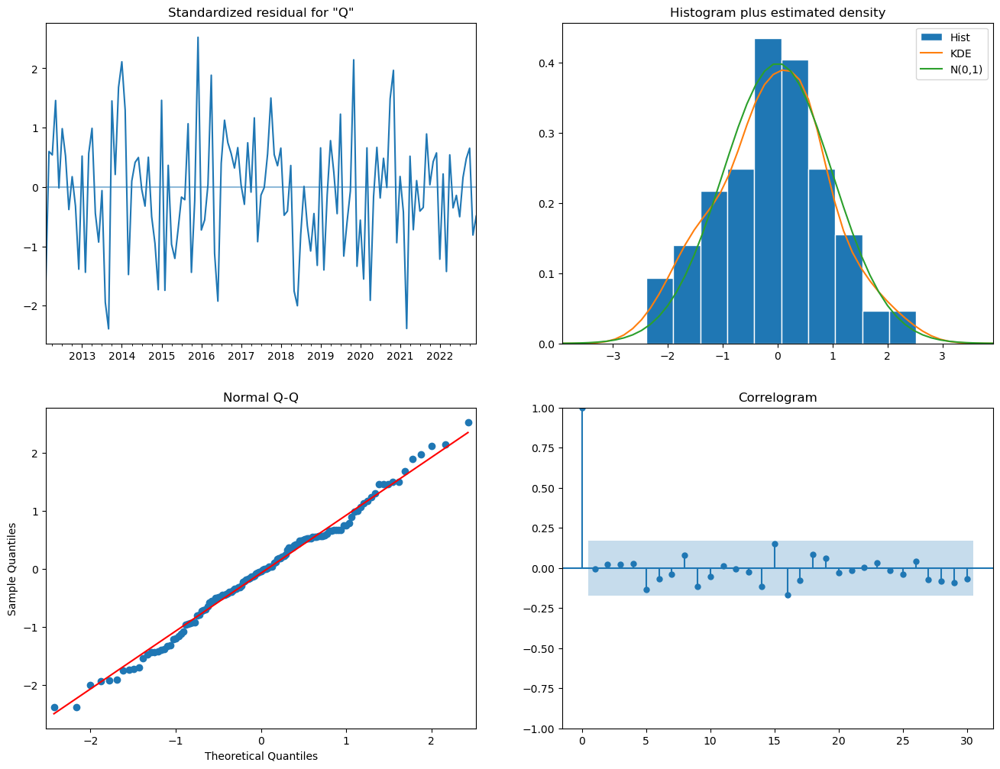

In [217]:
best_results_SARIMA_1.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### QP3 = Amount of product 3

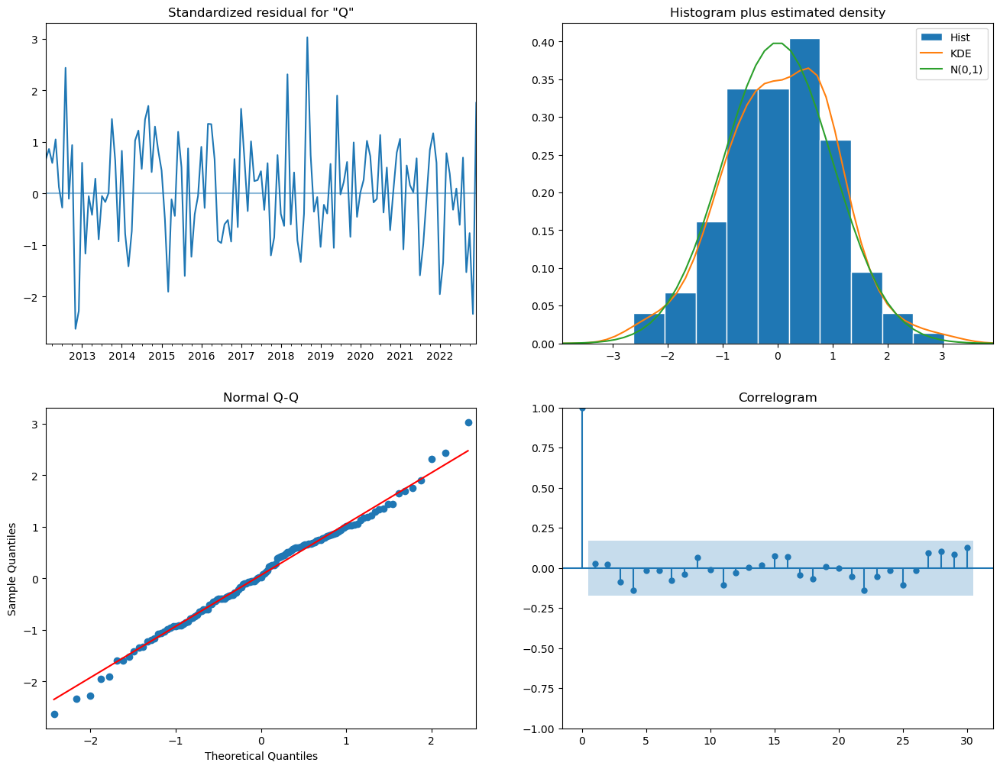

In [218]:
best_results_SARIMA_2.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### QP4 = Amount of product 4

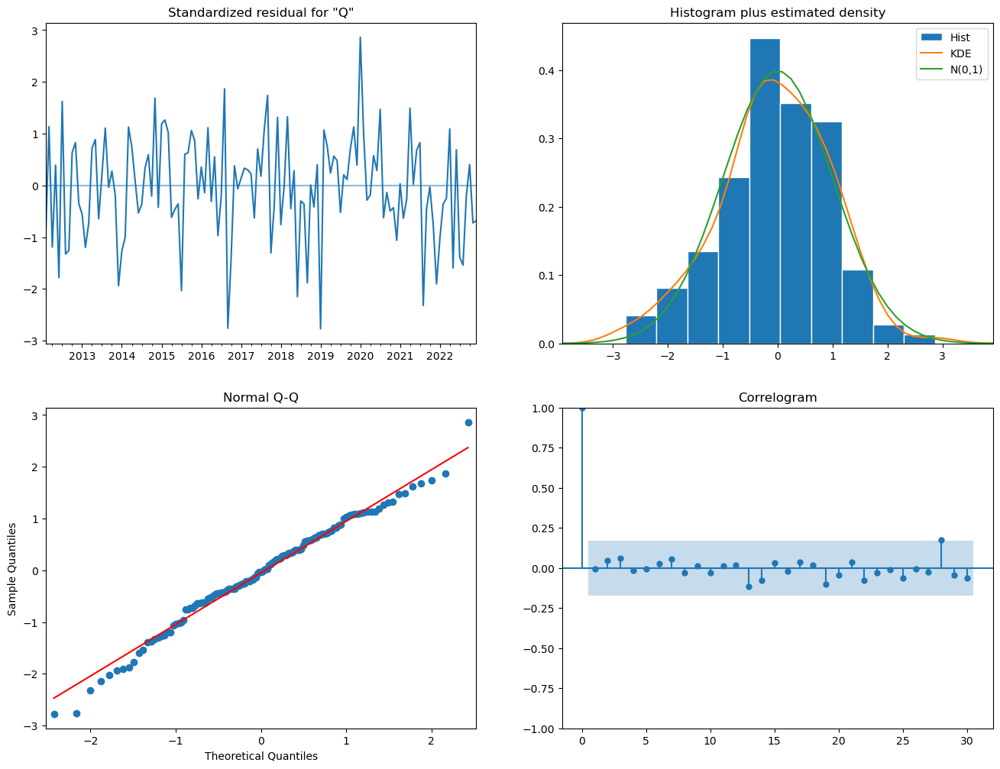

In [219]:
best_results_SARIMA_3.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### SP1 = Revenue of product 1

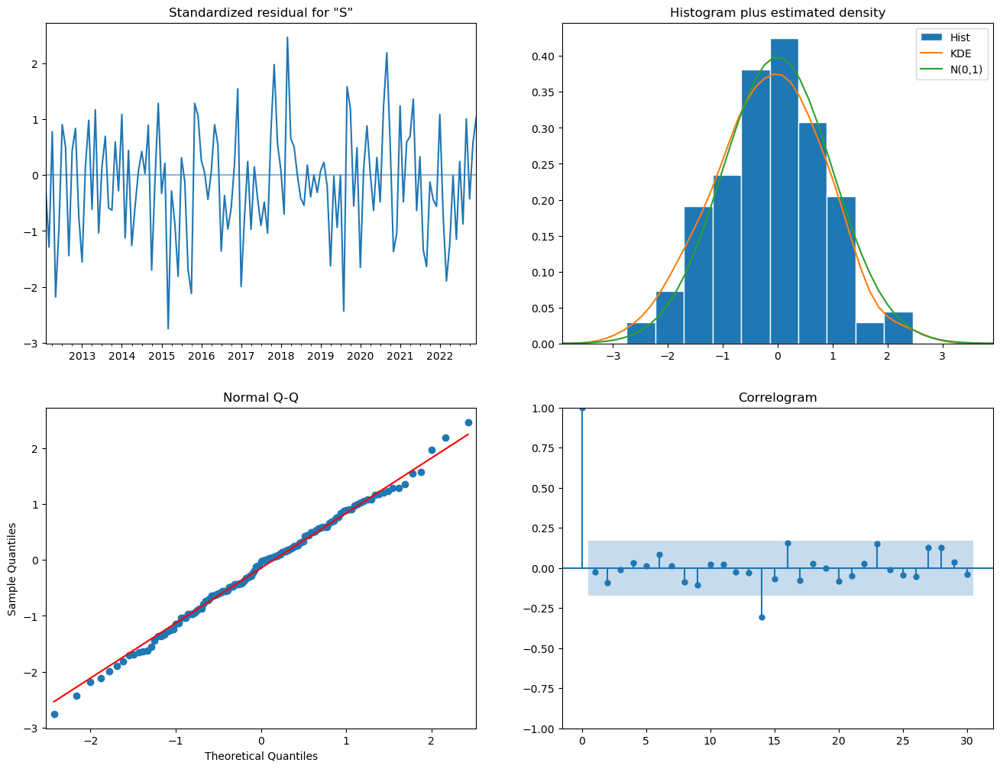

In [220]:
best_results_SARIMA_4.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### SP2 = Revenue of product 2

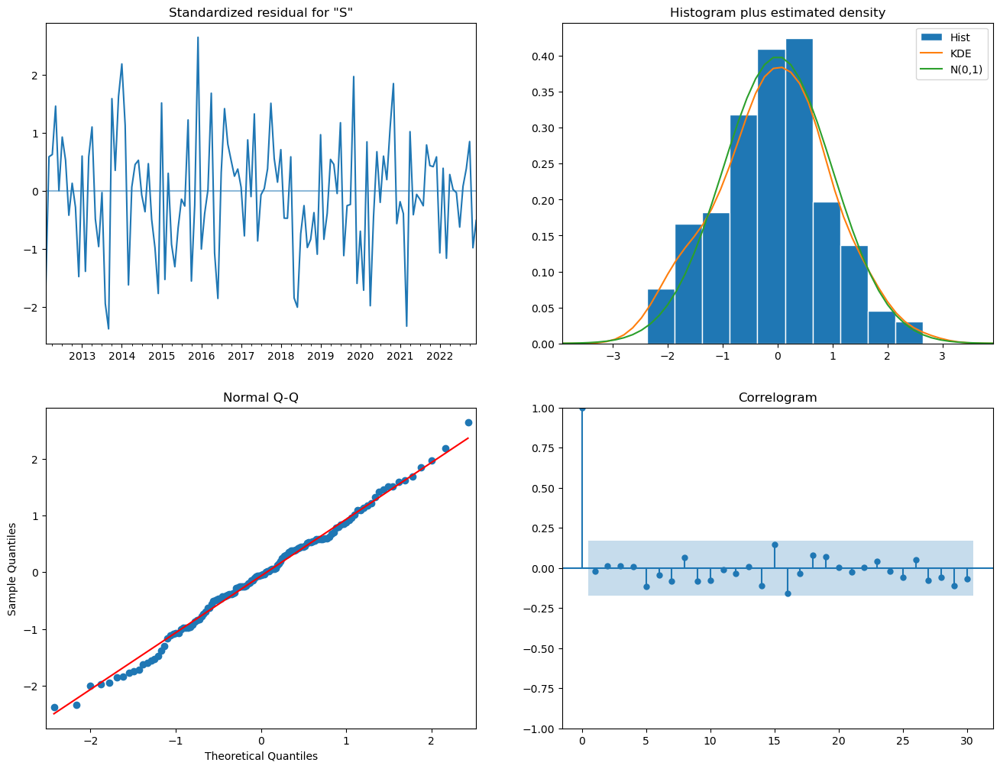

In [221]:
best_results_SARIMA_5.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### SP3 = Revenue of product 3

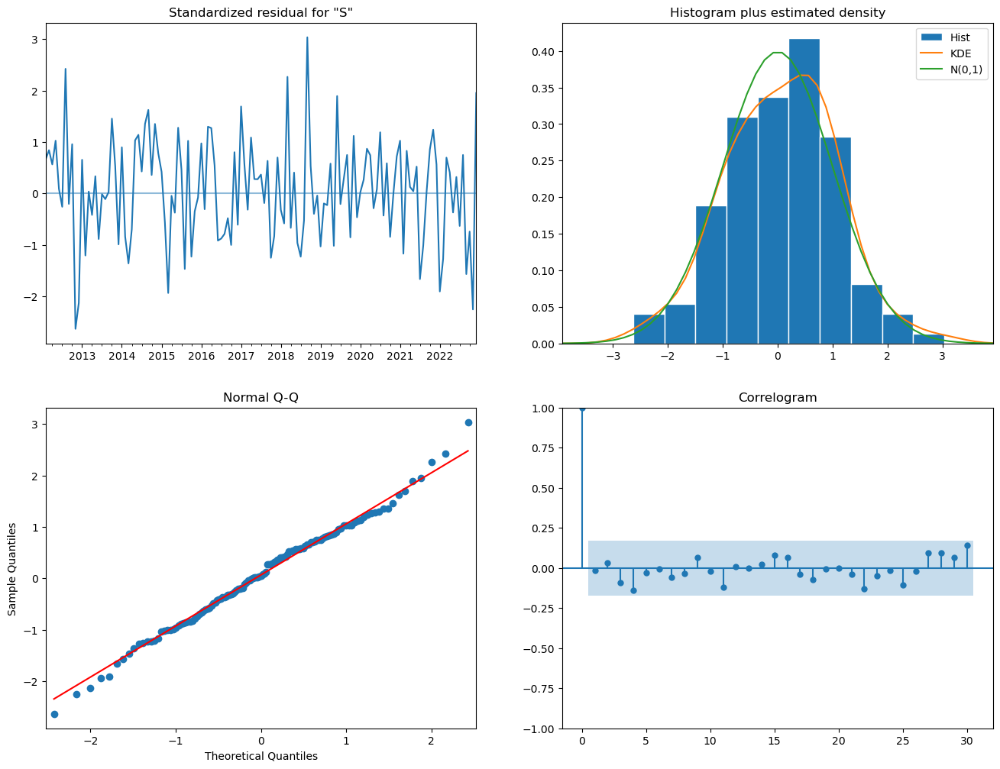

In [222]:
best_results_SARIMA_6.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

##### SP4 = Revenue of product 4

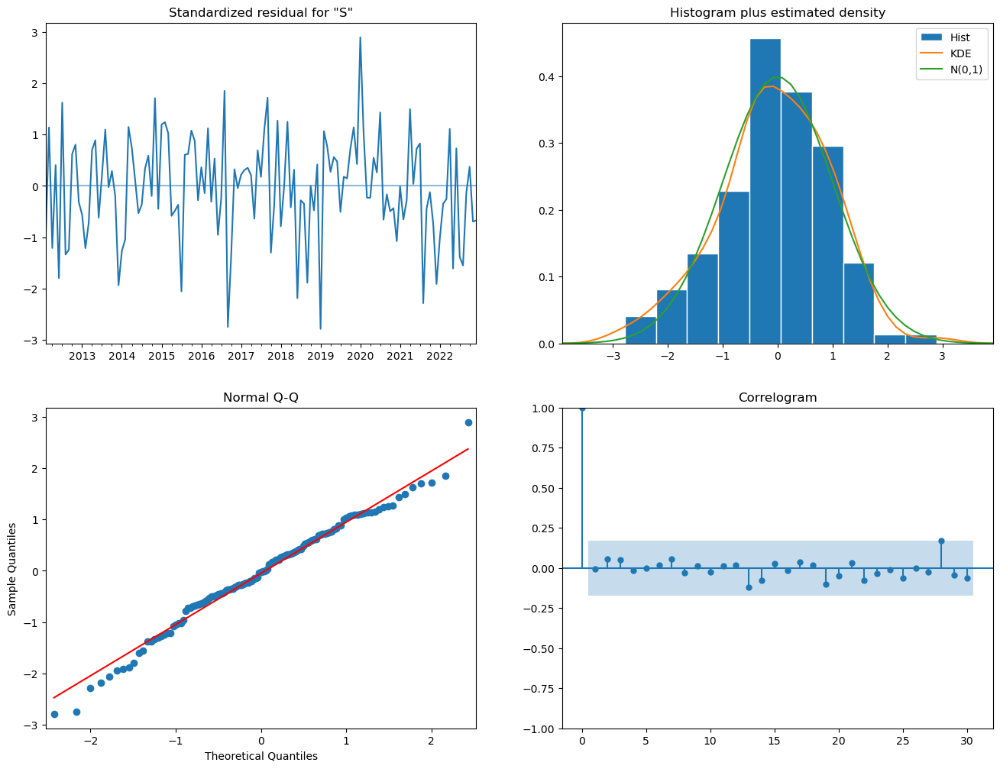

In [223]:
best_results_SARIMA_7.plot_diagnostics(lags=30, figsize=(16,12))
plt.show()

Inference
Note : 4 plots in the residuals diagnostic plots tell us :
- Standardized residuals plot The top left plot shows 1-step-ahead standardized residuals.
If model is working correctly, then no pattern should be obvious in the residuals which is clearly not visible from the plot as well .

- Histogram plus estimated density plot This plot shows the distribution of the residuals.The orange line shows a smoothed version of this histogram, and the green line shows a normal distribution. If the model is good these two lines should be the same. Here there are small differences between them, which indicate that our model is doing just well enough.

- Normal Q-Q plot The Q-Q plot compare the distribution of residuals to normal distribution. If the distribution of the residuals is normal, then all the points should lie along the red line, except for some values at the end, which is exactly happening in this case.

- Correlogram plot The correlogram plot is the ACF plot of the residuals rather than the data. 95% of the correlations for lag >0 should not be significant (within the blue shades). If there is a significant correlation in the residuals, it means that there is information in the data that was not captured by the model, which is clearly not in this case.